# Non-Linearity Probing Experiments
Capacity-scaling sweep, layer-wise analysis, and generalization matrices.
Designed for the EMNLP resubmission of *The (Non-)Linear Representation of Toxicity*.

In [1]:
import torch as t
import pandas as pd
import numpy as np
import random
import json
import configparser
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from scipy.stats import wilcoxon

from utils import DataManager
from probes_with_dynamic_hidden import (
    LRProbe, RidgeProbe, LinearSVMProbe,
    NonLinearProbe, make_nonlinear_probe,
    NL_HIDDEN_DIMS, LINEAR_PROBES, CAPACITY_SWEEP_PROBES,
)


In [2]:
# ── Global hyperparameters ────────────────────────────────────────────────────
SPLIT        = 0.85
DEVICE       = "cpu"
SEED         = 42
RESULTS_DIR  = Path("all_toxicity_results/experimental_outputs")
RESULTS_FILE = RESULTS_DIR / "generalization_results_capacity_sweep_toxic_with_early_stopping.json"

# Capacity sweep: hidden dims to evaluate for the NonLinearProbe width ablation
SWEEP_HIDDEN_DIMS  = [8, 16, 32, 64, 128, 256, 512]   # paper Table §NLS
# Depth ablation (run on 4B model pair only to keep compute tractable)
SWEEP_DEPTHS       = [1, 2, 3]
DEPTH_ABLATION_MODELS = ["Qwen3-4B", "llama-3-3B"]

# Build the ProbeClasses list that drives every experiment loop.
# Linear probes always come first (hidden_dim=0 signals "linear" in output JSON).
PROBE_CONFIGS: list[tuple] = (
    [(LRProbe,        0, 1)]
  #+ [(RidgeProbe,     0, 1)]
  #+ [(LinearSVMProbe, 0, 1)]
  + [(make_nonlinear_probe(hd, depth=2), hd, 2) for hd in SWEEP_HIDDEN_DIMS]
)
# PROBE_CONFIGS entries: (ProbeClass, hidden_dim, depth)

config = configparser.ConfigParser()
config.read("config.ini")

random.seed(SEED)
t.manual_seed(SEED)

print("Probe configurations:")
for cls, hd, d in PROBE_CONFIGS:
    print(f"  {cls.__str__():30s}  hidden={hd}  depth={d}")


Probe configurations:
  LRProbe                         hidden=0  depth=1
  NonLinearProbe_8x2              hidden=8  depth=2
  NonLinearProbe_16x2             hidden=16  depth=2
  NonLinearProbe_32x2             hidden=32  depth=2
  NonLinearProbe_64x2             hidden=64  depth=2
  NonLinearProbe_128x2            hidden=128  depth=2
  NonLinearProbe_256x2            hidden=256  depth=2
  NonLinearProbe_512x2            hidden=512  depth=2


In [3]:
# ── Dataset configuration ─────────────────────────────────────────────────────
# Each entry in TRAIN_MEDLEYS is a list of dataset names that are pooled for
# training a single probe.  VAL_DATASETS are always used for evaluation only.

TRAIN_MEDLEYS = [
    ["code-review-dataset-larger"],
    ["gitter_ethereum-labeled-larger"],
    ["hatecheck_balanced"],
    ["textdetox_de_Balanced"],
    ["textdetox_en_balanced"],
    ["textdetox_es_balanced"],
    ["textdetox_fr_balanced"],
    ["textdetox_it_balanced"],
    # ["cities"],
    # ["neg_cities"],
    # ["sp_en_trans"],
    # ["neg_sp_en_trans"],
    # ["larger_than"],
    # ["smaller_than"],
    # ["companies_true_false"],

]

VAL_DATASETS = [
    "code-review-dataset-larger",
    "gitter_ethereum-labeled-larger",
    "cumstrudel_train_comments_balanced",   # OOD comments
    "hatecheck_balanced",
    "textdetox_de_Balanced",
    "textdetox_en_balanced",
    "textdetox_es_balanced",
    "textdetox_fr_balanced",
    "textdetox_it_balanced",
    # "cities",
    # "neg_cities",
    # "sp_en_trans",
    # "neg_sp_en_trans",
    # "larger_than",
    # "smaller_than",
    # "companies_true_false",
]

#TODO: 14B and 32B need to be trained on all toxiciity

# Model families and their size scales
MODEL_FAMILIES = {
    # "Qwen1_5": {
    #    "scales": ["1_8B"],# "30B-A3B", "32B"], #"0_6B", "1_7B", "4B", "8B", "14B"],# "30B-A3B", # "8B", "14B", "32B"],#"0_6B", "1_7B", "4B",
    #    "suffix": "",
    # },
    #    "Qwen2": {
    #    "scales": ["1_5B"],# "30B-A3B", "32B"], #"0_6B", "1_7B", "4B", "8B", "14B"],# "30B-A3B", # "8B", "14B", "32B"],#"0_6B", "1_7B", "4B",
    #    "suffix": "",
    # },
    #    "Qwen2_5": {
    #    "scales": ["1_5B"],# "30B-A3B", "32B"], #"0_6B", "1_7B", "4B", "8B", "14B"],# "30B-A3B", # "8B", "14B", "32B"],#"0_6B", "1_7B", "4B",
    #    "suffix": "",
    # },
    "Qwen3": {
        "scales": ["0_6B", "1_7B", "4B", "8B", "14B", "30B-A3B", "32B"],# "30B-A3B", # "8B", "14B", "32B"],#"0_6B", "1_7B", "4B",
        "suffix": "",
    },
    "llama-3": {
       "scales": ["1B", "3B", "8B"], #["1b", "4b"]
       "suffix": "",
    },
#     "gemma-3": {
#         "scales": ["1b", "4b"], #[]
#         "suffix": "-it",
#     },
}

ALL_MODELS = [
    f"{fam}-{scale}{info['suffix']}"
    for fam, info in MODEL_FAMILIES.items()
    for scale in info["scales"]
]
print(ALL_MODELS)

LAYER_GROUPS = ["a", "b", "c", "d"]


def to_str(medley: list) -> str:
    return "+".join(medley)

def get_layer(model: str, group: str) -> int:
    return eval(config[model][f"probe_layer_{group}"])

def get_layers(model: str) -> dict:
    return {g: get_layer(model, g) for g in LAYER_GROUPS}

def get_all_layers(model: str) -> dict:
    last_layer = get_layer(model, "d")
    return {i: i for i in range(0, last_layer)}


['Qwen3-0_6B', 'Qwen3-1_7B', 'Qwen3-4B', 'Qwen3-8B', 'Qwen3-14B', 'Qwen3-30B-A3B', 'Qwen3-32B', 'llama-3-1B', 'llama-3-3B', 'llama-3-8B']


## Training Probes

In [4]:
# ── Experiment runner ─────────────────────────────────────────────────────────
# This cell runs ALL probe × model × layer × dataset combinations and appends
# results to RESULTS_FILE.  Re-running is safe: existing records are loaded
# first and new records are appended, so you can resume after interruptions.

def run_experiments(
    models=ALL_MODELS,
    probe_configs=PROBE_CONFIGS,
    train_medleys=TRAIN_MEDLEYS,
    val_datasets=VAL_DATASETS,
    split=SPLIT,
    seed=SEED,
    device=DEVICE,
    results_file=RESULTS_FILE,
):
    """Run probing experiments and persist results to JSON."""
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)
    if results_file.exists():
        with open(results_file) as f:
            outs = json.load(f)
    else:
        outs = []

    # Build a set of already-completed (model, probe_name, layer, medley) tuples
    # so we can skip them on resume.
    done = {
        (r["model"], r["probe"], r["layer"], r["medley"])
        for r in outs
        if all(k in r for k in ("model", "probe", "layer", "medley"))
    }

    for model in models:
        layers = get_all_layers(model)
        noperiod = eval(config[model]["noperiod"])

        for group, layer in layers.items():
            print(f"\n{'─'*60}")
            print(f"Model: {model}  |  Group: {group}  |  Layer: {layer}")
            print(f"{'─'*60}")

            for ProbeClass, hidden_dim, depth in probe_configs:
                probe_name = ProbeClass.__str__()

                for medley in train_medleys:
                    medley_key = to_str(medley)
                    run_key = (model, probe_name, layer, medley_key)

                    if run_key in done:
                        print(f"  [skip] {probe_name} | {medley_key}")
                        continue

                    print(f"  [run]  {probe_name:30s} | train={medley_key}")

                    # ── Set up DataManager ────────────────────────────────
                    dm = DataManager()
                    for ds in medley:
                        dm.add_dataset(
                            ds, model, layer,
                            seed=seed, split=split,
                            label="is_toxic",
                            noperiod=noperiod,
                            center=True, device=device,
                        )
                    for ds in val_datasets:
                        if ds not in medley:
                            dm.add_dataset(
                                ds, model, layer,
                                split=None,
                                label="is_toxic",
                                noperiod=noperiod,
                                center=True, device=device,
                            )

                    # ── Train ────────────────────────────────────────────
                    train_acts, train_labels = dm.get("train")
                    if hidden_dim > 0:
                        probe = ProbeClass.from_data(
                            train_acts, train_labels,
                            hidden_dim=hidden_dim, depth=depth,
                            device=device,
                        )
                    else:
                        probe = ProbeClass.from_data(
                            train_acts, train_labels, device=device
                        )

                    # ── Evaluate ──────────────────────────────────────────
                    accs = {}
                    for vds in val_datasets:
                        if vds in medley:
                            v_acts, v_labels = dm.data["val"][vds]
                        else:
                            v_acts, v_labels = dm.data[vds]
                        preds = probe.pred(v_acts)
                        # Ensure both are float tensors for comparison
                        if not isinstance(preds, t.Tensor):
                            preds = t.from_numpy(preds.astype(np.float32))
                        if not isinstance(v_labels, t.Tensor):
                            v_labels = t.tensor(v_labels, dtype=t.float32)
                        accs[vds] = (preds == v_labels.cpu()).float().mean().item()

                    # ── Persist ───────────────────────────────────────────
                    record = {
                        "model":       model,
                        "probe":       probe_name,
                        "hidden_dim":  hidden_dim,
                        "depth":       depth,
                        "layer":       layer,
                        "layer_group": group,
                        "medley":      medley_key,
                        "noperiod":    noperiod,
                        "oracle":      False,
                        "training_info": probe.training_info,
                        **accs,
                    }
                    outs.append(record)
                    done.add(run_key)

        # Save after each model (checkpoint)
        with open(results_file, "w") as f:
            json.dump(outs, f, indent=2)
        print(f"\n  ✓ Saved {len(outs)} records → {results_file}")

    return outs


# To run: uncomment the line below.
outs = run_experiments()



────────────────────────────────────────────────────────────
Model: Qwen3-30B-A3B  |  Group: 0  |  Layer: 0
────────────────────────────────────────────────────────────
  [run]  LRProbe                        | train=code-review-dataset-larger
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-30B-A3B/code-review-dataset-larger
torch.Size([998, 2048])
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-30B-A3B/gitter_ethereum-labeled-larger
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-30B-A3B/cumstrudel_train_comments_balanced
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-30B-A3B/hatecheck_balanced
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-30B-A3B/textdetox_de_Balanced
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-30B-A3B/textdetox_en_balanced
Directory: /Volumes/Samsung SSD 990 PRO 4

In [26]:
# ── Depth ablation (optional — 4B model pair only) ───────────────────────────
DEPTH_ABLATION_FILE = RESULTS_DIR / "depth_ablation_results_32.json"

SWEEP_DEPTHS       = [1, 2, 3]
DEPTH_ABLATION_MODELS = ["Qwen3-4B", "llama-3-3B"] #"Qwen3-4B", 

DEPTH_ABLATION_PROBE_CONFIGS = [
    [(LRProbe, 0, 1)]
  + [(make_nonlinear_probe(32, depth=d), 32, d) for d in SWEEP_DEPTHS]
]
DEPTH_ABLATION_PROBE_CONFIGS = DEPTH_ABLATION_PROBE_CONFIGS[0]  # flatten

# To run:
depth_outs = run_experiments(
    models=DEPTH_ABLATION_MODELS,
    probe_configs=DEPTH_ABLATION_PROBE_CONFIGS,
    results_file=DEPTH_ABLATION_FILE,
)



────────────────────────────────────────────────────────────
Model: Qwen3-4B  |  Group: a  |  Layer: 2
────────────────────────────────────────────────────────────
  [run]  LRProbe                        | train=code-review-dataset-larger
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-4B/code-review-dataset-larger
torch.Size([998, 2560])
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-4B/gitter_ethereum-labeled-larger
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-4B/cumstrudel_train_comments_balanced
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-4B/hatecheck_balanced
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-4B/textdetox_de_Balanced
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Qwen3-4B/textdetox_en_balanced
Directory: /Volumes/Samsung SSD 990 PRO 4TB/geometry-of-toxicity/data/acts/Q

In [36]:
# ── Load & index results ──────────────────────────────────────────────────────

def load_results(results_file=RESULTS_FILE) -> pd.DataFrame:
    """Load the JSON results file into a tidy DataFrame."""
    with open(results_file) as f:
        raw = json.load(f)
    # Each record has scalar metadata + one accuracy per val_dataset.
    # Melt into long form: one row per (model, probe, layer, medley, val_dataset).
    records = []
    meta_keys = {"model", "probe", "hidden_dim", "depth",
                 "layer", "layer_group", "medley", "noperiod", "oracle"}
    for r in raw:
        meta = {k: r[k] for k in meta_keys if k in r}
        for k, v in r.items():
            if k not in meta_keys and isinstance(v, float):
                records.append({**meta, "val_dataset": k, "accuracy": v})
    df = pd.DataFrame(records)
    # Add a family column
    df["family"] = df["model"].apply(
        lambda m: "Qwen3" if m.startswith("Qwen") else "Llama-3"
    )
    # Numeric hidden_dim for easy sorting/plotting
    df["hidden_dim"] = pd.to_numeric(df["hidden_dim"], errors="coerce").fillna(0).astype(int)
    return df


df = load_results()
df.tail()


,layer_group,model,layer,oracle,probe,depth,hidden_dim,medley,noperiod,val_dataset,accuracy,family
161403,38,Qwen3-14B,38,False,NonLinearProbe_512x2,2,512,sp_en_trans,False,neg_sp_en_trans,0.584746,Qwen3
161404,38,Qwen3-14B,38,False,NonLinearProbe_512x2,2,512,neg_sp_en_trans,False,cities,0.467914,Qwen3
161405,38,Qwen3-14B,38,False,NonLinearProbe_512x2,2,512,neg_sp_en_trans,False,neg_cities,0.966578,Qwen3
161406,38,Qwen3-14B,38,False,NonLinearProbe_512x2,2,512,neg_sp_en_trans,False,sp_en_trans,0.844633,Qwen3
161407,38,Qwen3-14B,38,False,NonLinearProbe_512x2,2,512,neg_sp_en_trans,False,neg_sp_en_trans,1.000000,Qwen3


---
# Analysing Probes

In [25]:
# General toxicity
#medleys = ["hatecheck_balanced", "textdetox_en_balanced"]
#val_datasets = ["hatecheck_balanced", "textdetox_en_balanced"]

# Multilingual toxicity - smaller models, especially in Qwen3, MLP outperforms LR in later layers
# medleys = ["textdetox_de_Balanced", 
#            "textdetox_it_balanced", 
#            "textdetox_fr_balanced",
#            "textdetox_es_balanced",
#            #"textdetox_en_balanced"
#            ]
# val_datasets = ["textdetox_de_Balanced", 
#                "textdetox_it_balanced", 
#                "textdetox_fr_balanced",
#                "textdetox_es_balanced",
#                #"textdetox_en_balanced"
#                ]

# code toxicity
# medleys = [
#    "code-review-dataset-larger",
#    "gitter_ethereum-labeled-larger",
# ]

# val_datasets = [
#    "code-review-dataset-larger",
#    "gitter_ethereum-labeled-larger",
#    #"cumstrudel_train_comments_balanced"
# ]

#Truthfulness
medleys = [
    "cities",
    "neg_cities",
    "sp_en_trans",
    "neg_sp_en_trans",
    "larger_than",
    "smaller_than",
    "companies_true_false",
]

val_datasets = [
    "cities",
    "neg_cities",
    "sp_en_trans",
    "neg_sp_en_trans",
    "larger_than",
    "smaller_than",
    "companies_true_false",
]

# FULL
# medleys = [
#     "code-review-dataset-larger",
#     "gitter_ethereum-labeled-larger",
#     "cumstrudel_train_comments_balanced",
#     "textdetox_de_Balanced", 
#     "textdetox_it_balanced", 
#     "textdetox_fr_balanced",
#     "textdetox_es_balanced",
#     "textdetox_en_balanced",
#     "hatecheck_balanced"
# ]
# val_datasets = [
#     "code-review-dataset-larger",
#     "gitter_ethereum-labeled-larger",
#     "cumstrudel_train_comments_balanced",
#     "textdetox_de_Balanced", 
#     "textdetox_it_balanced", 
#     "textdetox_fr_balanced",
#     "textdetox_es_balanced",
#     "textdetox_en_balanced",
#     "hatecheck_balanced"
# ]

In [26]:
# ── L1: Load layer-wise results ─────────────────────────────────────────────
# Expected JSON schema: same as group results but with integer "layer" field
# covering ALL layers, and NO "layer_group" field (or it may be absent).
# If you saved all-layer results to a separate file, point LAYERWISE_FILE there.

LAYERWISE_FILE = RESULTS_DIR / "generalization_results_capacity_sweep_true_with_early_stopping.json" #generalization_results_capacity_sweep_full_model
#ALL_MODELS=ALL_MODELS
def load_layerwise_results(
        results_file=LAYERWISE_FILE,
        models=ALL_MODELS,
        medleys: list = [],
        val_datasets: list = []
) -> pd.DataFrame:
    """
    Load all-layer results into a tidy long-form DataFrame.

    Returns one row per (model, probe, layer, medley, val_dataset).
    Adds columns:
      - family        : "Qwen3" | "Llama-3" | "Gemma3"
      - n_layers      : total number of layers for that model (from config)
      - rel_depth     : layer / (n_layers - 1)  ∈ [0, 1]
      - decile        : int 0-9  (floor(rel_depth * 10), clamped)
      - hidden_dim    : 0 for linear probes, else the MLP width
      - is_linear     : bool
    """
    with open(results_file) as f:
        raw = json.load(f)

    meta_keys = {"model", "probe", "hidden_dim", "depth",
                 "layer", "noperiod", "oracle", "medley", 
                 "layer_group"}
    
    training_info = {"stopped_epoch", "best_epoch",
                     "best_val_acc", "converged"}
    records = []
    for r in raw:
        meta = {k: r[k] for k in meta_keys if k in r}
        training_info = {info: r["training_info"][info] for info in training_info if info in r["training_info"]}
        for k, v in r.items():
            if k not in meta_keys and isinstance(v, float):
                records.append({**meta, **training_info, "val_dataset": k, "accuracy": v})

    df = pd.DataFrame(records)

    if len(models) > 0:
        df = df[df["model"].isin(models)]
    if len(medleys) > 0:
        df = df[df["medley"].isin(medleys)]
    if len(val_datasets) > 0:
        df = df[df["val_dataset"].isin(val_datasets)]

    # Family label
    def _family(m):
        if m.startswith("Qwen3-VL") or m.startswith("Qwen3VL"):
            return "Qwen3-VL"
        if m.startswith("Qwen"):
            return "Qwen3"
        if m.startswith("Llama") or m.startswith("llama"):
            return "Llama-3"
        if m.startswith("gemma") or m.startswith("Gemma"):
            return "Gemma3"
        return "Other"
    df["family"] = df["model"].apply(_family)

    # Layer count per model from config
    def _n_layers(m):
        try:
            # config stores last layer index; n_layers = last_layer + 1
            return eval(config[m]["n_layers"])
        except (KeyError, TypeError):
            # Fall back: infer from max layer seen for this model
            return df[df["model"] == m]["layer"].max() + 1

    model_nlayers = {m: _n_layers(m) for m in df["model"].unique()}
    df["n_layers"]   = df["model"].map(model_nlayers)
    df["rel_depth"]  = df["layer"] / (df["n_layers"] - 1)
    df["decile"]     = (df["rel_depth"] * 10).clip(upper=9.999).astype(int)

    df["hidden_dim"] = pd.to_numeric(
        df.get("hidden_dim", 0), errors="coerce"
    ).fillna(0).astype(int)
    df["is_linear"]  = df["hidden_dim"] == 0

    return df


ldf = load_layerwise_results(medleys=medleys, val_datasets=val_datasets)
print(ldf[["model","layer","rel_depth","decile","probe","accuracy"]].head(10))
print("Models:", ldf["model"].unique().tolist())

            model  layer  rel_depth  decile    probe  accuracy
30184  Qwen3-0_6B      0        0.0       0  LRProbe  0.511111
30185  Qwen3-0_6B      0        0.0       0  LRProbe  0.468583
30186  Qwen3-0_6B      0        0.0       0  LRProbe  0.516949
30187  Qwen3-0_6B      0        0.0       0  LRProbe  0.474576
30188  Qwen3-0_6B      0        0.0       0  LRProbe  0.490404
30189  Qwen3-0_6B      0        0.0       0  LRProbe  0.502525
30190  Qwen3-0_6B      0        0.0       0  LRProbe  0.470833
30191  Qwen3-0_6B      0        0.0       0  LRProbe  0.467914
30192  Qwen3-0_6B      0        0.0       0  LRProbe  0.511111
30193  Qwen3-0_6B      0        0.0       0  LRProbe  0.457627
Models: ['Qwen3-0_6B', 'Qwen3-1_7B', 'Qwen3-4B', 'Qwen3-8B', 'Qwen3-14B', 'Qwen3-30B-A3B', 'Qwen3-32B', 'llama-3-1B', 'llama-3-3B', 'llama-3-8B']


In [9]:
ldf.head()

,layer,oracle,probe,noperiod,hidden_dim,medley,depth,layer_group,model,converged,best_val_acc,best_epoch,stopped_epoch,val_dataset,accuracy,family,n_layers,rel_depth,decile,is_linear
44373,0,False,LRProbe,False,0,hatecheck_balanced,1,0,Qwen3-0_6B,True,0.791429,207,227,hatecheck_balanced,0.761290,Qwen3,27,0.0,0,True
44375,0,False,LRProbe,False,0,hatecheck_balanced,1,0,Qwen3-0_6B,True,0.791429,207,227,textdetox_en_balanced,0.575333,Qwen3,27,0.0,0,True
44391,0,False,LRProbe,False,0,textdetox_en_balanced,1,0,Qwen3-0_6B,True,0.729412,92,112,hatecheck_balanced,0.526647,Qwen3,27,0.0,0,True
44393,0,False,LRProbe,False,0,textdetox_en_balanced,1,0,Qwen3-0_6B,True,0.729412,92,112,textdetox_en_balanced,0.773333,Qwen3,27,0.0,0,True
44445,0,False,NonLinearProbe_8x2,False,8,hatecheck_balanced,2,0,Qwen3-0_6B,False,0.854286,71,74,hatecheck_balanced,0.806452,Qwen3,27,0.0,0,False


In [13]:
df_all = pd.read_json(LAYERWISE_FILE)
len(df_all)

23688

In [11]:
27072 * 9

243648

In [14]:
23688 * 7

165816

In [15]:
165816 + 243648

409464

In [ ]:
df_all

---
## Group-wise

In [7]:
# ── Non-Linearity Score (NLS) ─────────────────────────────────────────────────
# NLS(model, layer_group, val_dataset) =
#   mean over hidden_dim sweep of (MLP_acc - LR_acc)
#
# A positive NLS means the MLP family consistently outperforms LR at that
# (model, layer, dataset) combination. The saturation point is the smallest
# hidden_dim at which >=90% of the max gain is achieved.

def compute_nls(df: pd.DataFrame) -> pd.DataFrame:
    """Return a DataFrame with one NLS row per (model, layer_group, val_dataset)."""
    # Pivot: rows = (model, layer_group, val_dataset), cols = probe names
    lr_acc = (
        df[df["probe"] == "LRProbe"]
        .groupby(["model", "family", "layer_group", "val_dataset"])["accuracy"]
        .mean()
        .rename("lr_acc")
    )

    # Mean accuracy per (model, layer_group, val_dataset, hidden_dim) across medleys
    mlp_acc = (
        df[(df["hidden_dim"] > 0)]
        .groupby(["model", "family", "layer_group", "val_dataset", "hidden_dim"])["accuracy"]
        .mean()
        .reset_index()
    )

    results = []
    for (model, family, lg, vds), grp in mlp_acc.groupby(
        ["model", "family", "layer_group", "val_dataset"]
    ):
        grp = grp.sort_values("hidden_dim")
        try:
            lr = lr_acc.loc[(model, family, lg, vds)]
        except KeyError:
            continue
        gains = grp["accuracy"].values - lr
        nls   = float(gains.mean())

        # Saturation point: first hidden_dim where gain >= 90% of max gain
        max_gain = gains.max()
        sat_idx  = int(np.argmax(gains >= 0.9 * max_gain)) if max_gain > 0 else 0
        sat_dim  = int(grp["hidden_dim"].iloc[sat_idx])

        results.append({
            "model":        model,
            "family":       family,
            "layer_group":  lg,
            "val_dataset":  vds,
            "nls":          nls,
            "saturation_dim": sat_dim,
            "max_gain":     float(max_gain),
            "lr_acc":       float(lr),
        })
    return pd.DataFrame(results)


nls_df = compute_nls(ldf)
nls_df.groupby(["family", "layer_group"])["nls"].mean().unstack()


layer_group,0,1,2,3,4,5,6,7,8,9,...,53,54,55,56,57,58,59,60,61,62
family,,,,,,,,,,,,,,,,,,,,,
Llama-3,0.017109,0.032392,0.040039,0.024689,0.019314,0.015275,0.014376,0.017474,0.019177,0.009769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Qwen3,0.020410,0.019975,0.017003,0.018200,0.016096,0.015745,0.011910,0.008666,0.008171,0.009740,...,0.022268,0.018599,0.01872,0.015395,0.012351,0.020357,0.007329,0.00647,0.002131,0.008153


In [38]:
# ── Wilcoxon signed-rank test (replication + extension) ──────────────────────
# For each (family, hidden_dim) pair, test whether MLP accuracy systematically
# differs from LR accuracy across all (model, layer, dataset) observations.

def wilcoxon_by_family_and_dim(df: pd.DataFrame) -> pd.DataFrame:
    lr_rows = df[df["probe"] == "LRProbe"].copy()
    lr_indexed = lr_rows.set_index(
        ["model", "layer_group", "val_dataset", "medley"]
    )["accuracy"]

    rows = []
    for (family, hd), grp in df[df["hidden_dim"] > 0].groupby(["family", "hidden_dim"]):
        # Align with LR baseline on same (model, layer_group, val_dataset, medley)
        idx = grp.set_index(["model", "layer_group", "val_dataset", "medley"]).index
        mlp_vals, lr_vals = [], []
        for key in idx:
            if key in lr_indexed.index:
                mlp_vals.append(grp.loc[grp.set_index(
                    ["model", "layer_group", "val_dataset", "medley"]).index == key,
                    "accuracy"
                ].values[0])
                lr_vals.append(lr_indexed.loc[key])

        if len(mlp_vals) < 10:
            continue
        diffs = np.array(mlp_vals) - np.array(lr_vals)
        try:
            stat, pval = wilcoxon(diffs)
        except Exception:
            pval = float("nan")
        rows.append({
            "family":     family,
            "hidden_dim": hd,
            "n_pairs":    len(diffs),
            "mean_diff":  float(diffs.mean()),
            "p_value":    pval,
        })
    return pd.DataFrame(rows)

wilcoxon_df = wilcoxon_by_family_and_dim(df)
wilcoxon_df


KeyboardInterrupt: 

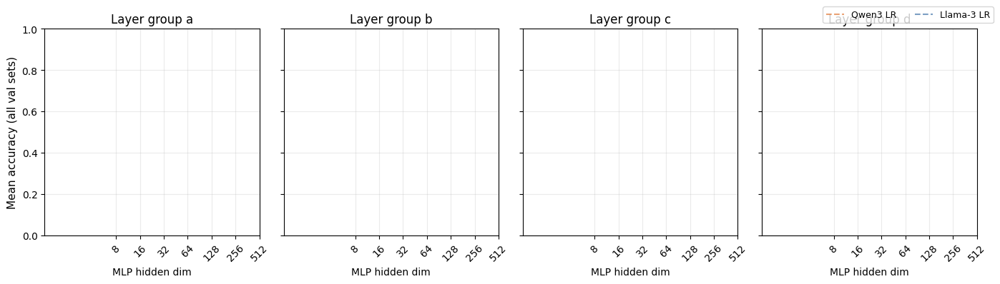

In [39]:
# ── Figure: Capacity scaling curves (main paper figure) ──────────────────────
# One subplot per layer group (a,b,c,d). Each subplot shows mean accuracy vs.
# log(hidden_dim) for Qwen3 and Gemma3, with the LR baseline as a dashed line.

def plot_capacity_curves(
    df: pd.DataFrame,
    val_datasets: list = VAL_DATASETS,
    layer_groups: list = LAYER_GROUPS,
    figsize=(14, 4),
    save_path: str = None,
):
    family_styles = {
        "Qwen3":  {"color": "#E07B39", "marker": "o"},
        "Llama-3": {"color": "#4477AA", "marker": "s"},
    }

    fig, axes = plt.subplots(1, len(layer_groups), figsize=figsize, sharey=True)

    for ax, group in zip(axes, layer_groups):
        for family, style in family_styles.items():
            fdf = df[(df["family"] == family) & (df["layer_group"] == group)]

            # LR baseline (horizontal line)
            lr_mean = fdf[fdf["probe"] == "LRProbe"]["accuracy"].mean()
            ax.axhline(
                lr_mean, color=style["color"], linestyle="--",
                linewidth=1.5, alpha=0.7, label=f"{family} LR",
            )

            # MLP curve across hidden dims
            mlp = (
                fdf[fdf["hidden_dim"] > 0]
                .groupby("hidden_dim")["accuracy"]
                .agg(["mean", "sem"])
                .reset_index()
                .sort_values("hidden_dim")
            )
            if mlp.empty:
                continue
            ax.plot(
                np.log2(mlp["hidden_dim"]),
                mlp["mean"],
                color=style["color"], marker=style["marker"],
                linewidth=2, markersize=6, label=f"{family} MLP",
            )
            ax.fill_between(
                np.log2(mlp["hidden_dim"]),
                mlp["mean"] - 1.96 * mlp["sem"],
                mlp["mean"] + 1.96 * mlp["sem"],
                color=style["color"], alpha=0.15,
            )

        ax.set_title(f"Layer group {group}", fontsize=12)
        ax.set_xlabel("MLP hidden dim", fontsize=10)
        xtick_vals = [int(hd) for hd in sorted(df[df["hidden_dim"] > 0]["hidden_dim"].unique())]
        ax.set_xticks(np.log2(xtick_vals))
        ax.set_xticklabels(xtick_vals, rotation=45)
        ax.grid(True, alpha=0.25)

    axes[0].set_ylabel("Mean accuracy (all val sets)", fontsize=11)

    # Single shared legend
    handles, labels = axes[-1].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="upper right", ncol=2, fontsize=9,
        bbox_to_anchor=(1.0, 1.0),
    )
    plt.tight_layout()
    #if save_path:
        #plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_capacity_curves(df)


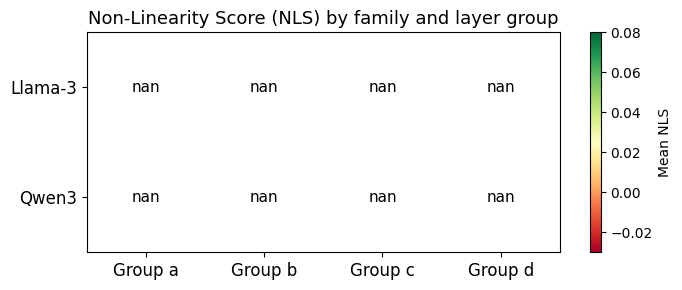

In [40]:
# ── Figure: NLS heatmap (family × layer group × dataset type) ────────────────

def plot_nls_heatmap(nls_df: pd.DataFrame, save_path: str = None):
    """2×4 heatmap: rows=family, cols=layer_group, values=mean NLS."""
    pivot = (
        nls_df
        .groupby(["family", "layer_group"])["nls"]
        .mean()
        .unstack("layer_group")
        .reindex(columns=LAYER_GROUPS)
    )

    fig, ax = plt.subplots(figsize=(7, 3))
    im = ax.imshow(pivot.values, vmin=-0.03, vmax=0.08, cmap="RdYlGn", aspect="auto")
    plt.colorbar(im, ax=ax, label="Mean NLS")

    ax.set_xticks(range(len(LAYER_GROUPS)))
    ax.set_xticklabels([f"Group {g}" for g in LAYER_GROUPS], fontsize=12)
    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels(pivot.index.tolist(), fontsize=12)

    for i in range(len(pivot.index)):
        for j in range(len(LAYER_GROUPS)):
            ax.text(
                j, i, f"{pivot.values[i, j]:.3f}",
                ha="center", va="center", fontsize=11,
                color="black",
            )

    ax.set_title("Non-Linearity Score (NLS) by family and layer group", fontsize=13)
    plt.tight_layout()
    #if save_path:
    #    plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_nls_heatmap(nls_df)


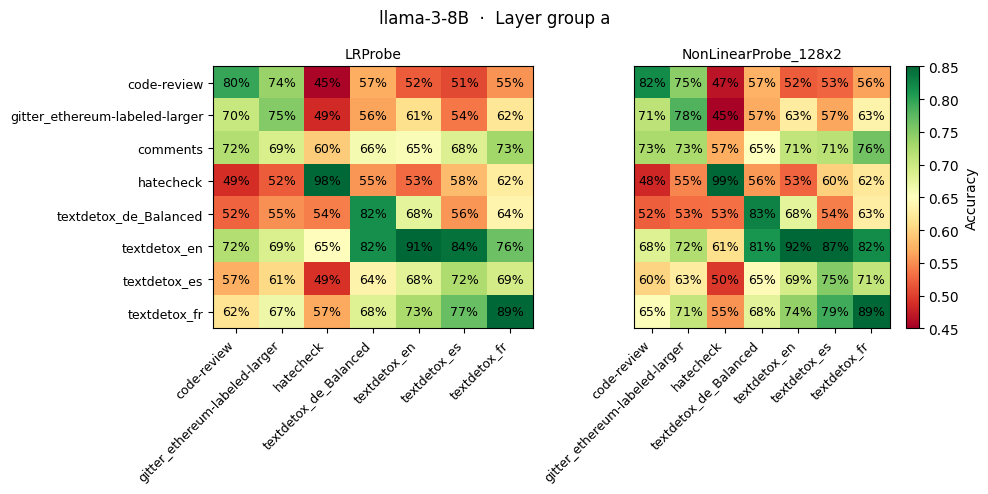

In [ ]:
# ── Figure: Generalization matrix (train × val heatmap) ──────────────────────
# For a single (model, layer_group, probe), show a grid of accuracies where
# rows=val_dataset, cols=train_medley.  Replaces the existing Figure 4 style.

def plot_generalization_matrix(
    df: pd.DataFrame,
    model: str,
    layer_group: str,
    probe_names: list = None,
    train_medleys: list = TRAIN_MEDLEYS,
    val_datasets: list = VAL_DATASETS,
    figsize_per_panel=(5, 5),
    save_path: str = None,
):
    if probe_names is None:
        probe_names = ["LRProbe", "NonLinearProbe_512x2"]

    n_panels = len(probe_names)
    fig, axes = plt.subplots(
        1, n_panels,
        figsize=(figsize_per_panel[0] * n_panels, figsize_per_panel[1]),
    )
    if n_panels == 1:
        axes = [axes]

    train_keys = [to_str(m) for m in train_medleys]
    train_labels_short = [
        m[0].replace("-dataset-larger", "").replace("_balanced", "")
        for m in train_medleys
    ]
    val_labels_short = [
        v.replace("-dataset-larger", "").replace("_balanced", "").replace(
            "cumstrudel_train_", ""
        )
        for v in val_datasets
    ]

    layer = get_layer(model, layer_group)
    sub = df[(df["model"] == model) & (df["layer"] == layer)]

    for ax, pname in zip(axes, probe_names):
        grid = np.full((len(val_datasets), len(train_keys)), np.nan)
        psub = sub[sub["probe"] == pname]
        for j, tk in enumerate(train_keys):
            msub = psub[psub["medley"] == tk]
            for i, vds in enumerate(val_datasets):
                vals = msub[msub["val_dataset"] == vds]["accuracy"].values
                if len(vals):
                    grid[i, j] = vals[0]

        im = ax.imshow(grid, vmin=0.45, vmax=0.85, cmap="RdYlGn", aspect="auto")
        for i in range(len(val_datasets)):
            for j in range(len(train_keys)):
                if not np.isnan(grid[i, j]):
                    ax.text(
                        j, i, f"{grid[i,j]*100:.0f}%",
                        ha="center", va="center", fontsize=9,
                    )
        ax.set_xticks(range(len(train_keys)))
        ax.set_xticklabels(train_labels_short, rotation=45, ha="right", fontsize=9)
        ax.set_title(pname, fontsize=10)
        if ax is axes[0]:
            ax.set_yticks(range(len(val_datasets)))
            ax.set_yticklabels(val_labels_short, fontsize=9)
        else:
            ax.set_yticks([])

    fig.colorbar(im, ax=axes[-1], label="Accuracy")
    fig.suptitle(f"{model}  ·  Layer group {layer_group}", fontsize=12)
    plt.tight_layout()
    #if save_path:
        #plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_generalization_matrix(df, "llama-3-8B", "a",
    probe_names=["LRProbe", "NonLinearProbe_128x2"]) #NonLinearProbe_512x2


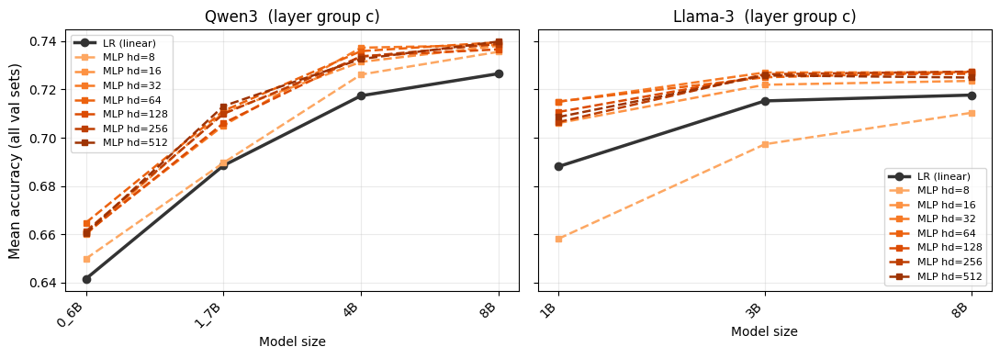

In [ ]:
# ── Figure: LR vs MLP accuracy across model scales (Figure 2 analogue) ───────
# Reproduces the main paper figure but now with multiple MLP capacity lines.

def plot_scale_comparison(
    df: pd.DataFrame,
    layer_group: str = "d",
    hidden_dims_to_show: list = [8, 16, 32, 64, 128, 256, 512],
    save_path: str = None,
):
    fig, axes = plt.subplots(1, 2, figsize=(11, 4), sharey=True)

    family_info = [
        ("Qwen3",  ["0_6B","1_7B","4B","8B"], ""),
        ("Llama-3", ["1B","3B","8B"], ""),
    ]

    palette = plt.cm.Oranges(np.linspace(0.4, 0.9, len(hidden_dims_to_show)))

    for ax, (family, scales, suffix) in zip(axes, family_info):
        fam_key = "Qwen3" if family == "Qwen3" else "llama-3"
        models_ordered = [f"{fam_key}-{s}{suffix}" for s in scales]

        def mean_acc_for(probe_name, hd=0):
            vals = []
            for m in models_ordered:
                sub = df[
                    (df["model"] == m) &
                    (df["layer_group"] == layer_group) &
                    (df["probe"] == probe_name) &
                    (df["hidden_dim"] == hd)
                ]["accuracy"]
                vals.append(sub.mean() if len(sub) else np.nan)
            return vals

        # LR baseline
        ax.plot(
            range(len(scales)),
            mean_acc_for("LinearSVMProbe", 0),
            color="#333333", linewidth=2.5, linestyle="-",
            marker="o", label="LR (linear)",
        )

        # MLP curves
        for hd, color in zip(hidden_dims_to_show, palette):
            probe_name = f"NonLinearProbe_{hd}x2"
            ax.plot(
                range(len(scales)),
                mean_acc_for(probe_name, hd),
                color=color, linewidth=1.8, linestyle="--",
                marker="s", markersize=5, label=f"MLP hd={hd}",
            )

        ax.set_xticks(range(len(scales)))
        ax.set_xticklabels(scales, rotation=45, ha="right")
        ax.set_title(f"{family}  (layer group {layer_group})", fontsize=12)
        ax.set_xlabel("Model size")
        ax.grid(True, alpha=0.25)
        ax.legend(fontsize=8)

    axes[0].set_ylabel("Mean accuracy (all val sets)", fontsize=11)
    plt.tight_layout()
    #if save_path:
    #    plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_scale_comparison(df, layer_group="c")


In [ ]:
df.tail()

,depth,noperiod,medley,oracle,layer,layer_group,probe,model,hidden_dim,val_dataset,accuracy,family
4955,2,False,textdetox_fr_balanced,False,31,d,NonLinearProbe_512x2,llama-3-8B,512,hatecheck_balanced,0.773740,Llama-3
4956,2,False,textdetox_fr_balanced,False,31,d,NonLinearProbe_512x2,llama-3-8B,512,textdetox_de_Balanced,0.656667,Llama-3
4957,2,False,textdetox_fr_balanced,False,31,d,NonLinearProbe_512x2,llama-3-8B,512,textdetox_en_balanced,0.889333,Llama-3
4958,2,False,textdetox_fr_balanced,False,31,d,NonLinearProbe_512x2,llama-3-8B,512,textdetox_es_balanced,0.802667,Llama-3
4959,2,False,textdetox_fr_balanced,False,31,d,NonLinearProbe_512x2,llama-3-8B,512,textdetox_fr_balanced,0.923333,Llama-3


In [ ]:
# ── Table: NLS summary (paper Table §NLS) ────────────────────────────────────

def make_nls_table(nls_df: pd.DataFrame) -> pd.DataFrame:
    """Wide-format NLS table suitable for dropping straight into a LaTeX paper."""
    tbl = (
        nls_df
        .groupby(["family", "layer_group"])
        .agg(
            nls_mean       = ("nls",            "mean"),
            nls_std        = ("nls",            "std"),
            saturation_dim = ("saturation_dim", "median"),
            max_gain       = ("max_gain",       "mean"),
        )
        .round(4)
        .reset_index()
    )
    return tbl

tbl = make_nls_table(nls_df)
print(tbl.to_latex(index=False, float_format="%.4f"))


\begin{tabular}{llrrrr}
\toprule
family & layer_group & nls_mean & nls_std & saturation_dim & max_gain \\
\midrule
Gemma3 & a & 0.0102 & 0.0179 & 192.0000 & 0.0267 \\
Gemma3 & b & 0.0038 & 0.0168 & 160.0000 & 0.0233 \\
Gemma3 & c & 0.0008 & 0.0244 & 192.0000 & 0.0235 \\
Gemma3 & d & -0.0157 & 0.0113 & 80.0000 & 0.0092 \\
Qwen3 & a & -0.0014 & 0.0238 & 64.0000 & 0.0131 \\
Qwen3 & b & 0.0127 & 0.0241 & 64.0000 & 0.0262 \\
Qwen3 & c & 0.0407 & 0.0268 & 32.0000 & 0.0525 \\
Qwen3 & d & 0.0482 & 0.0286 & 64.0000 & 0.0586 \\
\bottomrule
\end{tabular}



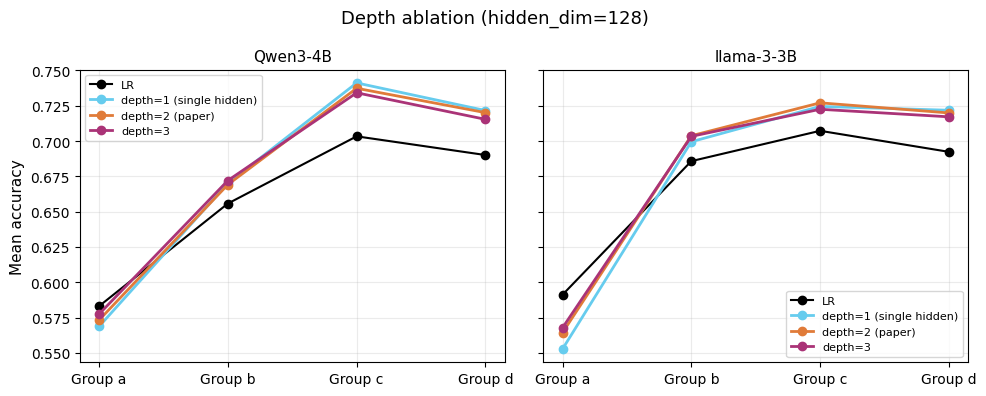

In [ ]:
# ── Figure: Depth ablation (depth 1 vs 2 vs 3, fixed hd=128) ────────────────

def plot_depth_ablation(
    depth_df: pd.DataFrame,
    models: list = DEPTH_ABLATION_MODELS,
    save_path: str = None,
):
    fig, axes = plt.subplots(1, len(models), figsize=(5 * len(models), 4), sharey=True)

    depth_colors = {1: "#66CCEE", 2: "#E07B39", 3: "#AA3377"}
    depth_labels = {1: "depth=1 (single hidden)", 2: "depth=2 (paper)", 3: "depth=3"}

    for ax, model in zip(axes, models):
        # LR baseline
        lr_mean = (
            depth_df[(depth_df["model"] == model) & (depth_df["probe"] == "LRProbe")]
                .groupby("layer_group")["accuracy"]
                .mean()
                .reindex(LAYER_GROUPS)
        )
        #ax.axhline(lr_mean, color="black", linestyle="--", linewidth=1.5, label="LR")
        ax.plot(
            range(len(LAYER_GROUPS)), lr_mean.values,
            color="black", marker="o", linewidth=1.5,
            label="LR",
        )

        for d, color in depth_colors.items():
            probe_name = f"NonLinearProbe_32x{d}"
            sub = (
                depth_df[(depth_df["model"] == model) & (depth_df["probe"] == probe_name)]
                .groupby("layer_group")["accuracy"]
                .mean()
                .reindex(LAYER_GROUPS)
            )
            ax.plot(
                range(len(LAYER_GROUPS)), sub.values,
                color=color, marker="o", linewidth=2,
                label=depth_labels[d],
            )

        ax.set_xticks(range(len(LAYER_GROUPS)))
        ax.set_xticklabels([f"Group {g}" for g in LAYER_GROUPS])
        ax.set_title(model, fontsize=11)
        ax.grid(True, alpha=0.25)
        ax.legend(fontsize=8)

    axes[0].set_ylabel("Mean accuracy", fontsize=11)
    plt.suptitle("Depth ablation (hidden_dim=128)", fontsize=13)
    plt.tight_layout()
    #if save_path:
    #    plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


depth_df = load_results(RESULTS_DIR / "depth_ablation_results_32.json")
plot_depth_ablation(depth_df)


---
## Full-layer analysis
The cells below extend the group-based analysis to every layer of every model.
Three new analysis levels are introduced:
1. **Per-model two-panel figures** — LR accuracy curve + MLP-vs-LR delta heatmap
2. **Relative-depth NLS curves** — comparable across models with different layer counts
3. **Three-level Wilcoxon tests** — per-model · per-decile · per-group (existing)

In [135]:
decile_layers = {}
last_layer = get_layer("Qwen3-14B", "d")
#decile_layer = np.linspace(round(last_layer/10), round(last_layer-(last_layer/10)), 9)
decile_layer = np.percentile(np.arange(0,last_layer), np.arange(10, 100, 10)).round().astype(int)
decile_layer

array([ 4,  8, 11, 15, 19, 23, 27, 30, 34])

Qwen3-0_6B


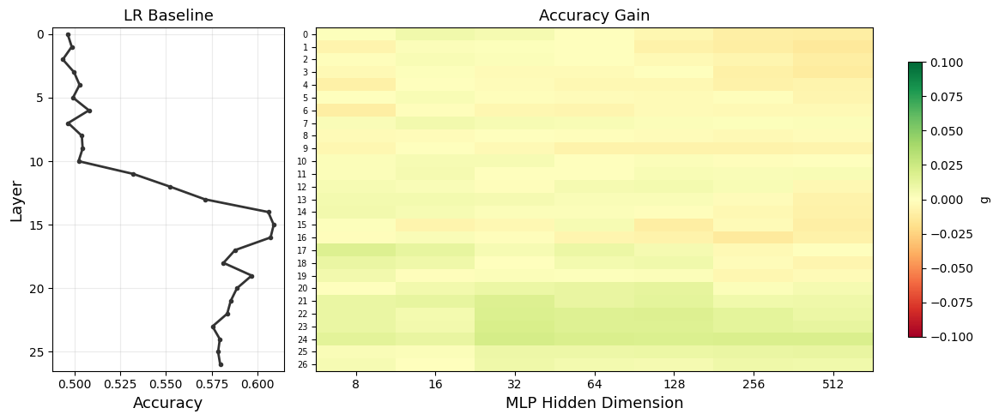

Qwen3-1_7B


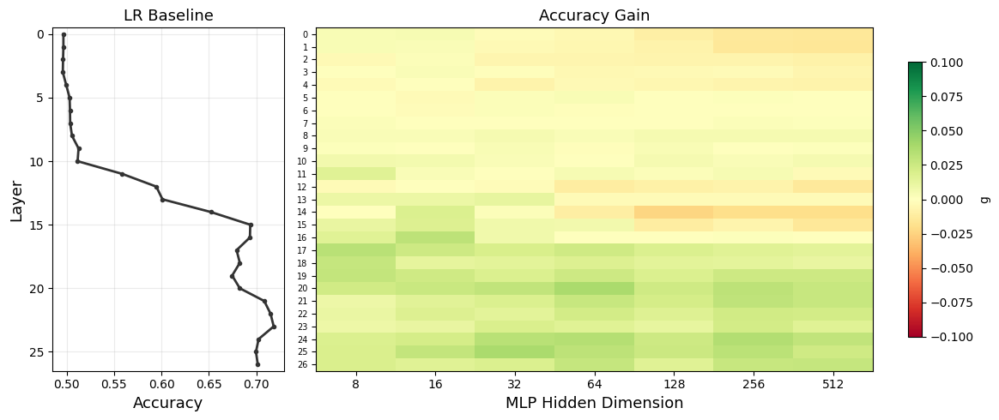

Qwen3-4B


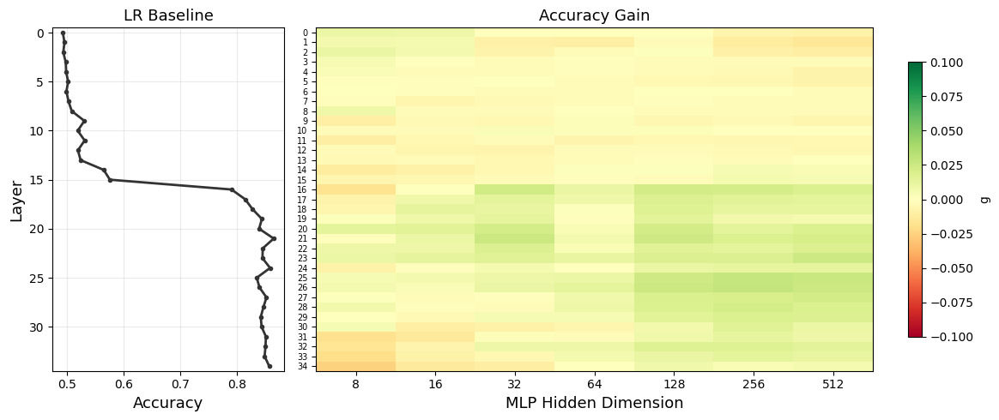

Qwen3-8B


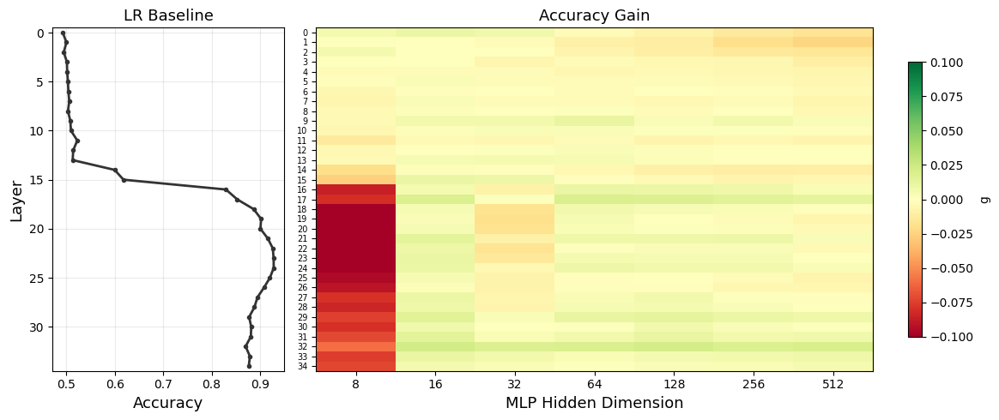

Qwen3-14B


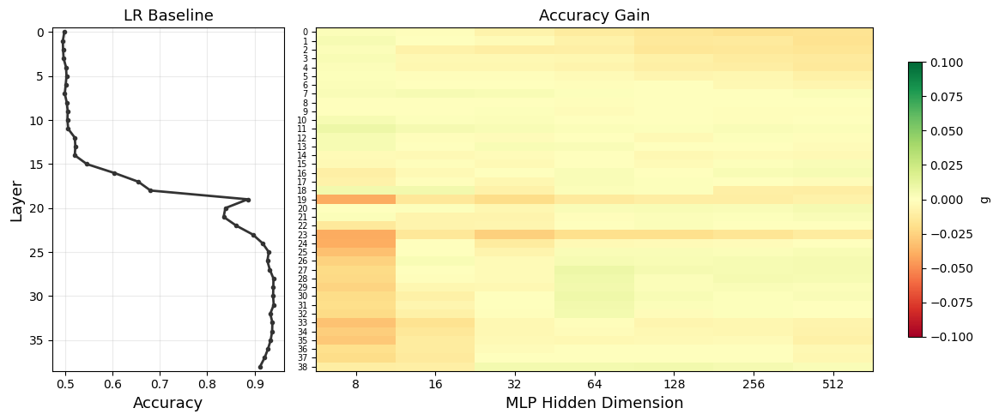

Qwen3-30B-A3B


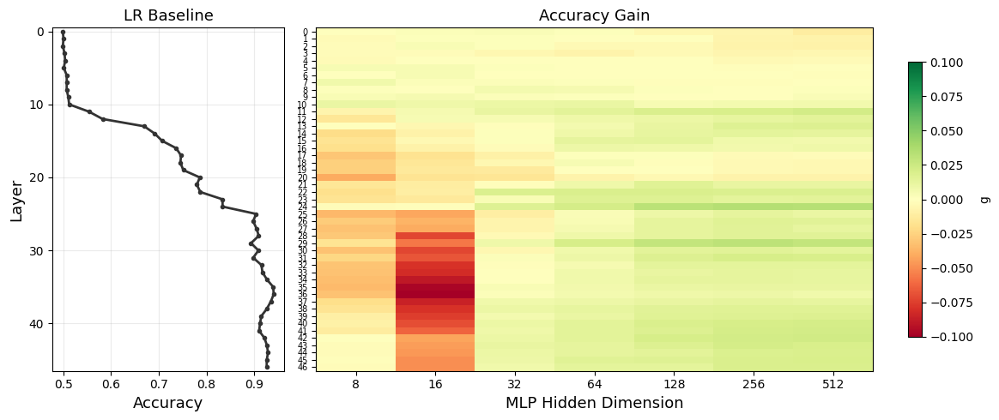

Qwen3-32B


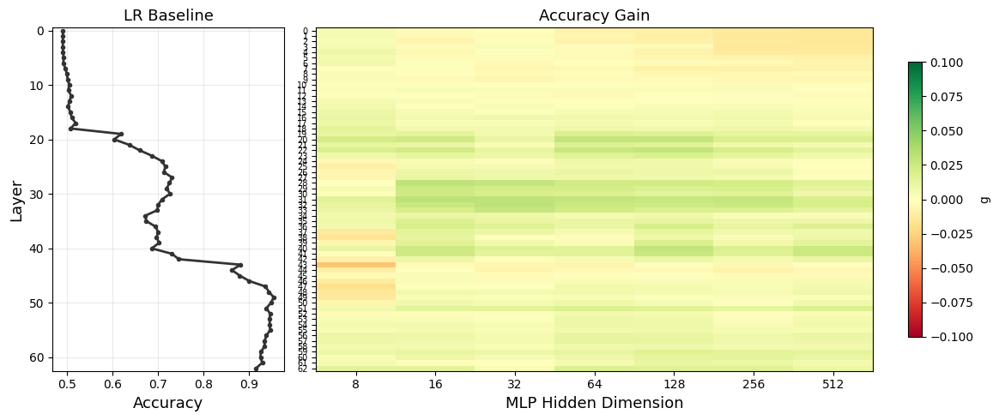

llama-3-1B


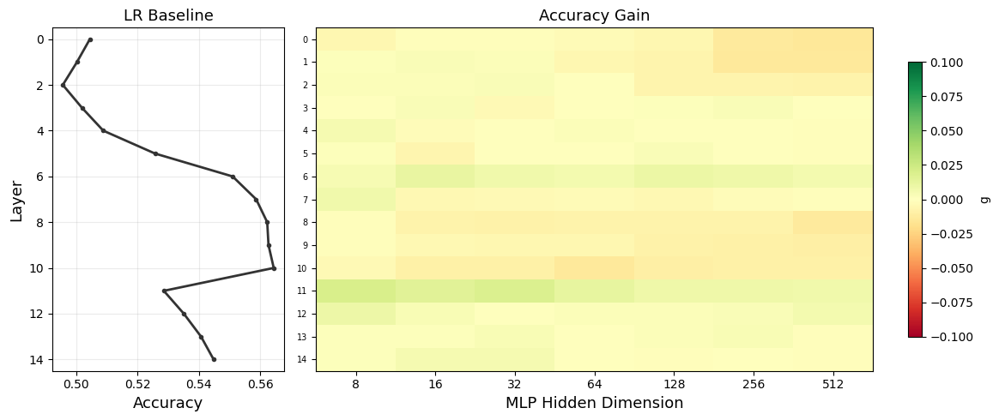

llama-3-3B


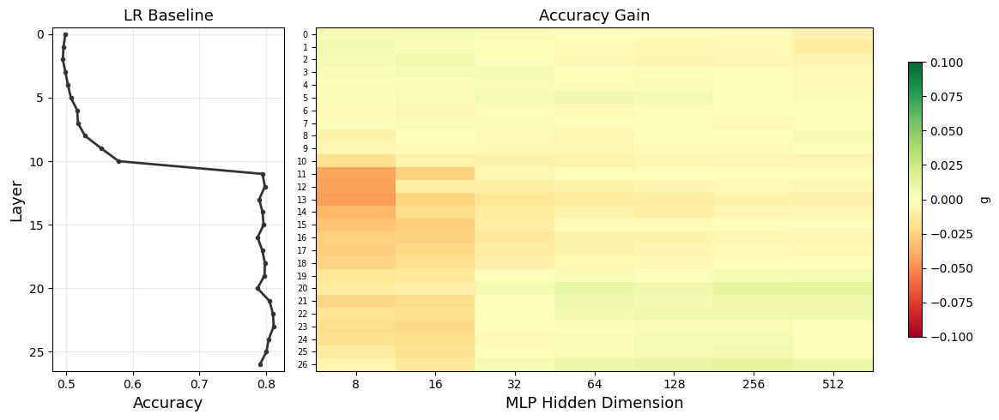

llama-3-8B


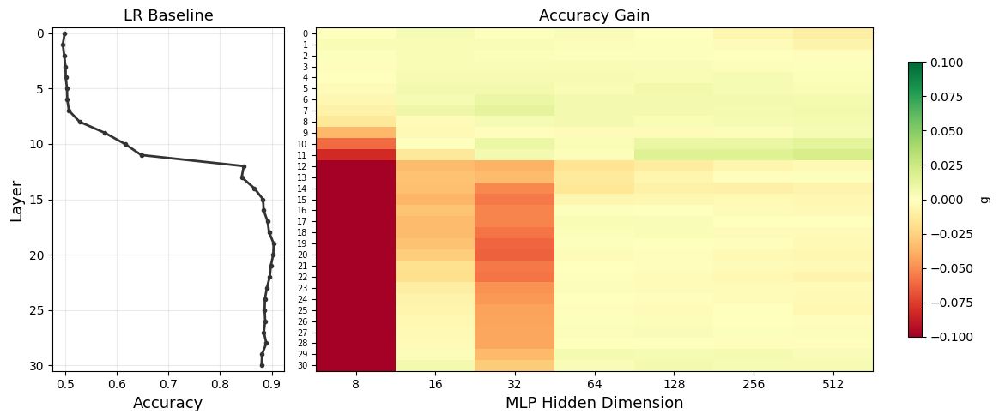

In [27]:
# ── L2: Per-model two-panel figure ───────────────────────────────────────────
# Left : LR accuracy across all layers (line plot)
# Right: (MLP_acc − LR_acc) heatmap, rows = layers, cols = hidden_dim
#         Diverging colormap centred at 0; annotated with layer-group bands.

def plot_layerwise_heatmap(
    ldf: pd.DataFrame,
    model: str,
    hidden_dims: list = None,
    figsize=(12, 5),
    vmin_delta: float = -0.1,
    vmax_delta: float = +0.1,
    save_path: str = None):
    """
    Two-panel figure for one model.

    Parameters
    ----------
    ldf         : layerwise results DataFrame (from load_layerwise_results)
    model       : model name string
    hidden_dims : which MLP widths to include (default: all present in data)
    vmin_delta / vmax_delta : colormap range for the delta heatmap
    save_path   : if given, save figure to this path (PDF/PNG)
    """
    print(model)
    mdf = ldf[ldf["model"] == model].copy()
    #n_layers = get_layer(model, "d")#int(mdf["n_layers"].iloc[0])
    layers   = sorted(mdf["layer"].unique())
    # n_layers = layers[-1]
    # rel_dep  = [layer / (n_layers - 1) for layer in layers]
    # decile_layers   =[min(int(rel_dep_i * 10), 9) for rel_dep_i in rel_dep]

    if hidden_dims is None:
        hidden_dims = sorted(mdf[~mdf["is_linear"]]["hidden_dim"].unique())

    # ── Compute mean accuracy per (layer, probe_type, hidden_dim)
    #    averaging over val_datasets and medleys
    lr_mean = (
        mdf[mdf["is_linear"] & (mdf["probe"] == "LRProbe")]
        .groupby("layer")["accuracy"].mean()
        .reindex(layers)
    )

    # delta matrix: rows=layers, cols=hidden_dim
    delta = np.full((len(layers), len(hidden_dims)), np.nan)
    for j, hd in enumerate(hidden_dims):
        mlp_mean = (
            mdf[mdf["hidden_dim"] == hd]
            .groupby("layer")["accuracy"].mean()
            .reindex(layers)
        )
        delta[:, j] = (mlp_mean - lr_mean).values
    #print(delta[0])
    # ── Layer group bands (from config, if available)
    #last_layer = get_layer(model, "d")
    #print(last_layer)
    #decile_layers = np.percentile(np.arange(0,last_layer), np.arange(10, 95, 9)).round().astype(int)

    # ── Figure ────────────────────────────────────────────────────────────────
    fig, (ax_lr, ax_delta) = plt.subplots(
        1, 2, figsize=figsize,
        gridspec_kw={"width_ratios": [1, 3]},
    )

    # Left: LR accuracy line
    ax_lr.plot(lr_mean.values, layers, color="#333333", linewidth=2, marker="o",
               markersize=3)
    ax_lr.set_xlabel("Accuracy", fontsize=13)
    ax_lr.set_ylabel("Layer", fontsize=13)
    ax_lr.set_ylim(layers[0] - 0.5, layers[-1] + 0.5)
    ax_lr.invert_yaxis()       # layer 0 at top, matching heatmap convention
    ax_lr.grid(True, alpha=0.25)
    ax_lr.set_title("LR Baseline", fontsize=13)
    # Mark group layers
    colors_g = {"a": "#4477AA", "b": "#66CCEE", "c": "#CCBB44", "d": "#EE6677"}
    # for g in decile_layers:
    #     ax_lr.axhline(g, color="black", linewidth=1.5, linestyle="--", alpha=0.6)

    # Right: delta heatmap
    im = ax_delta.imshow(
        delta,
        aspect="auto",
        cmap="RdYlGn",
        vmin=vmin_delta,
        vmax=vmax_delta,
        interpolation="nearest",
    )
    ax_delta.set_xlabel("MLP Hidden Dimension", fontsize=13)
    ax_delta.set_yticks(range(len(layers)))
    ax_delta.set_yticklabels(layers, fontsize=7)
    ax_delta.set_xticks(range(len(hidden_dims)))
    ax_delta.set_xticklabels(hidden_dims, fontsize=10)
    ax_delta.set_title("Accuracy Gain", fontsize=13)
    # Group layer bands on delta heatmap
    # for g in decile_layers:
    #     ax_delta.axhline(g, color="black", linewidth=1.5,
    #                          linestyle="--", alpha=0.6)

    plt.colorbar(im, ax=ax_delta, label="g", shrink=0.8)
    # fig.suptitle(f"{model}  —  layer-wise probe comparison", fontsize=13,
    #              fontweight="bold")
    plt.tight_layout()
    if save_path:
       plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


# Example usage — uncomment to run:
ldf = load_layerwise_results(medleys=medleys, val_datasets=val_datasets)
for model in ALL_MODELS:
    plot_layerwise_heatmap(ldf, model, save_path=f"all_toxicity_results/Accuracy_gain_heatmap_{model}_truth.pdf")

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26)]
27


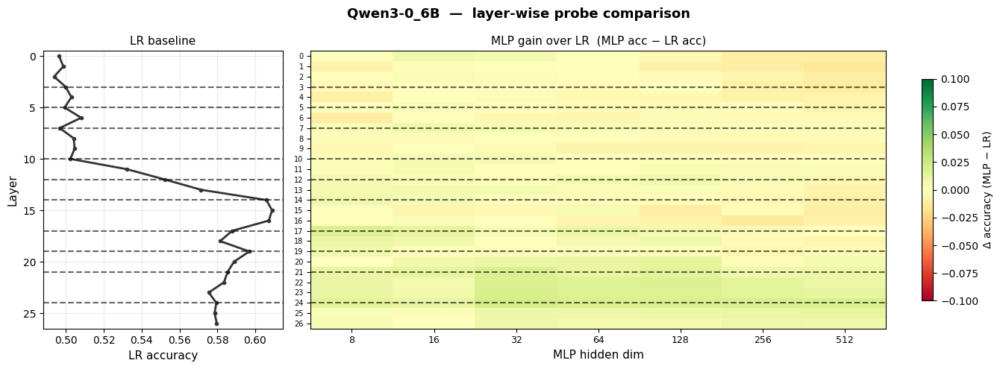

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38)]
39


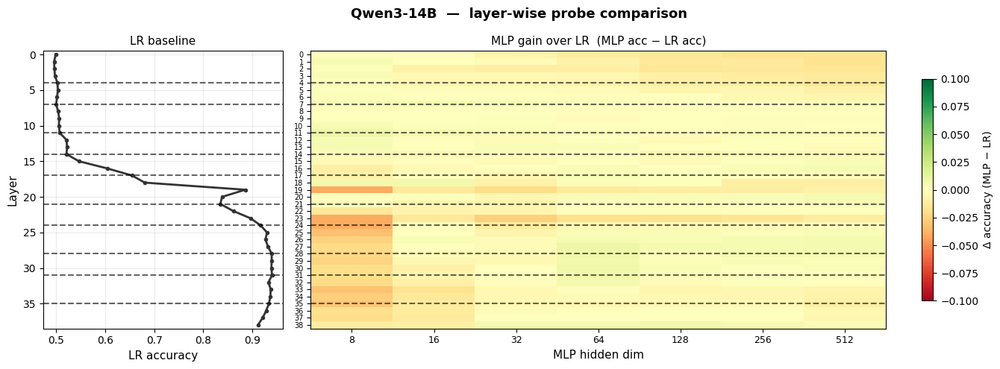

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26)]
27


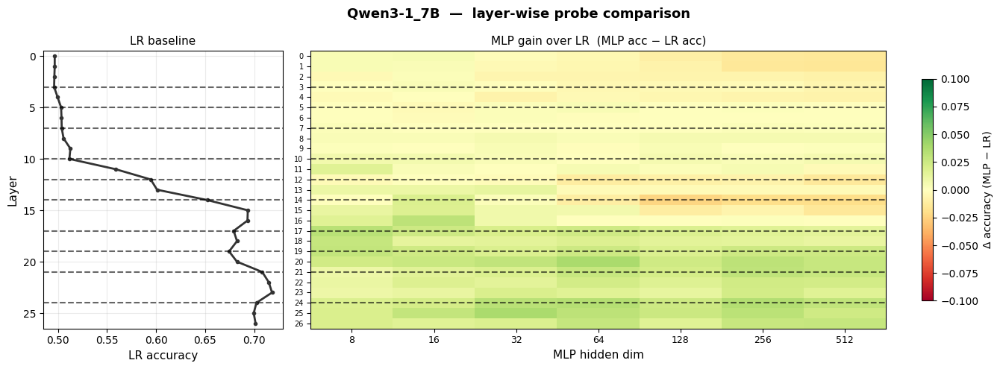

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46)]
47


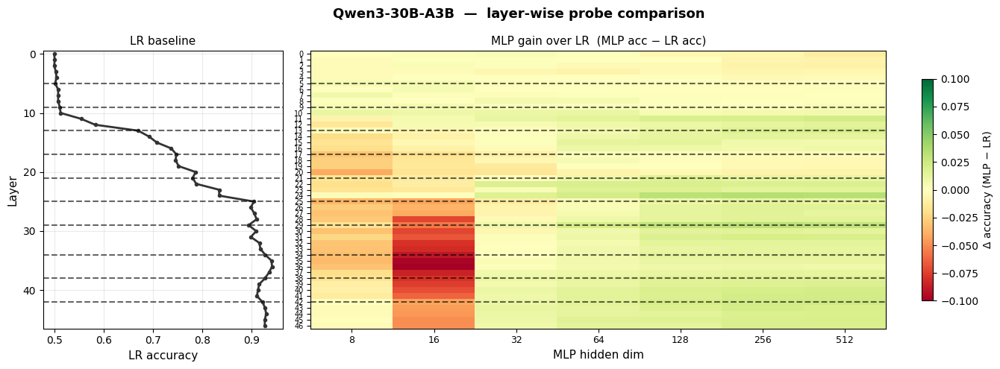

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(54), np.int64(55), np.int64(56), np.int64(57), np.int64(58), np.int64(59), np.int64(60), np.int64(61), np.int64(62)]
63


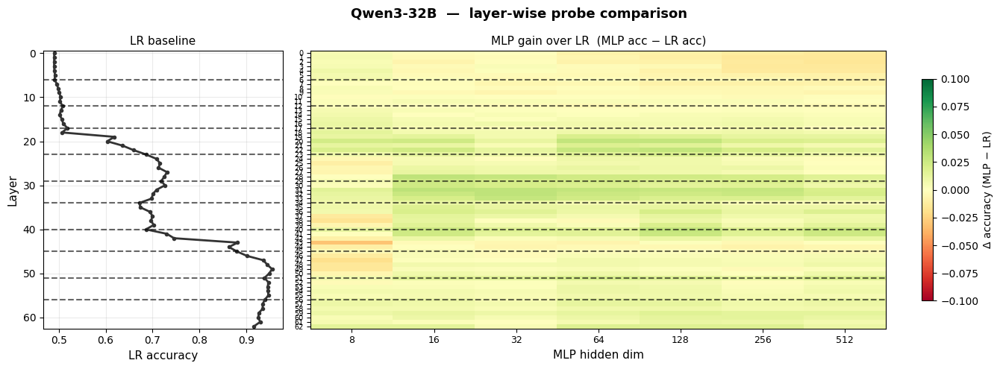

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34)]
35


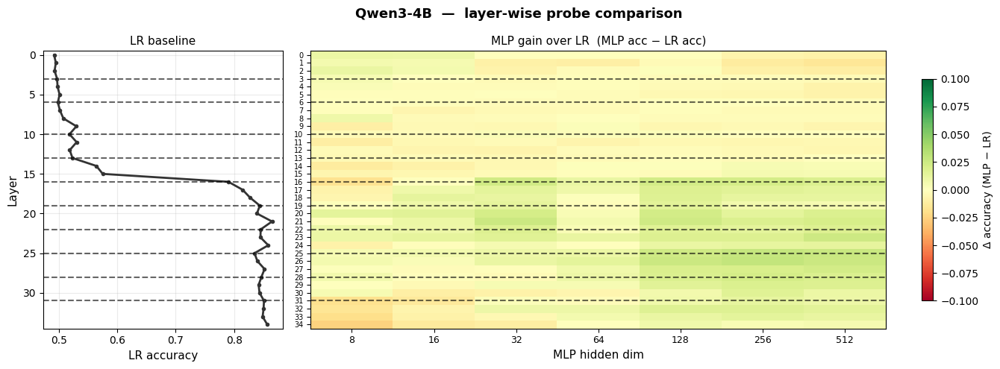

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34)]
35


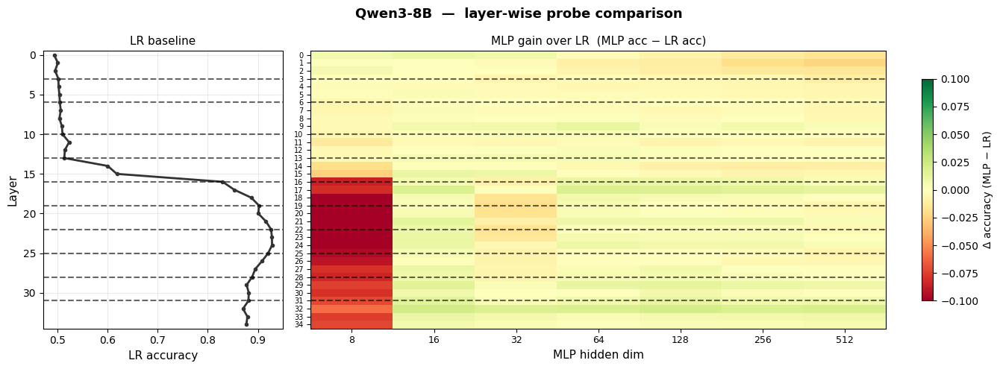

[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14)]
15


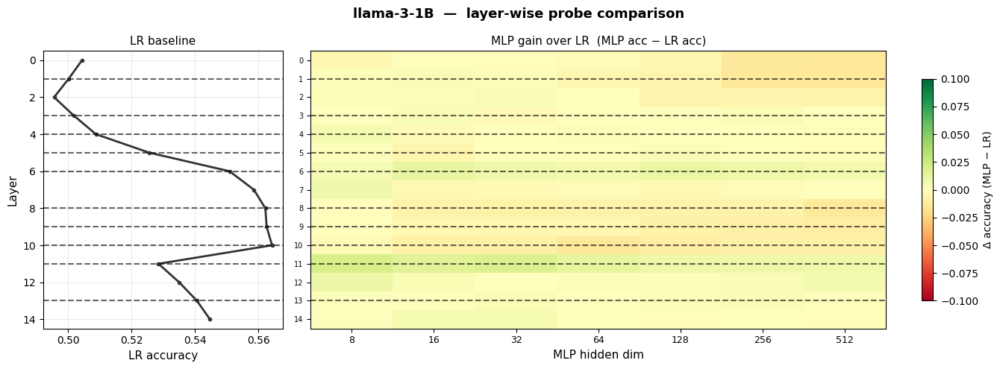

In [9]:
# ── L3: Batch figure — all models in a family on one page ────────────────────

def plot_layerwise_family(
    ldf: pd.DataFrame,
    family: str,
    hidden_dims: list = None,
    cols: int = 3,
    panel_figsize=(14, 4),
    save_path: str = None,
):
    """
    Calls plot_layerwise_heatmap for every model in a family and arranges them
    in a multi-row grid, saving to a single PDF if save_path is given.

    Tip: pass save_path="figures/layerwise_Qwen3.pdf" to get one document.
    """
    from matplotlib.backends.backend_pdf import PdfPages

    models = sorted(ldf[ldf["family"] == family]["model"].unique())
    if not models:
        print(f"No models found for family '{family}'")
        return

    if save_path:
        with PdfPages(save_path) as pdf:
            for model in models:
                fig = plt.figure(figsize=panel_figsize)
                # Re-use the single-model function but capture into the PDF
                plot_layerwise_heatmap(ldf, model, hidden_dims=hidden_dims)
                pdf.savefig(bbox_inches="tight")
                plt.close()
        print(f"Saved {len(models)} pages → {save_path}")
    else:
        for model in models:
            plot_layerwise_heatmap(ldf, model, hidden_dims=hidden_dims)


plot_layerwise_family(ldf, "Qwen3")
plot_layerwise_family(ldf, "Llama-3")

In [39]:
# ── L4: NLS at every layer (absolute and relative depth) ────────────────────

def compute_layerwise_nls(ldf: pd.DataFrame) -> pd.DataFrame:
    """
    Compute the Non-Linearity Score at every individual layer.

    NLS(model, layer) = mean over hidden_dims of (MLP_acc − LR_acc),
                        further averaged over val_datasets and medleys.

    Returns a DataFrame with columns:
      model | family | layer | n_layers | rel_depth | decile |
      nls | max_gain | saturation_dim | lr_acc_mean
    """
    records = []
    for (model, layer), grp in ldf.groupby(["model", "layer"]):
        family   = grp["family"].iloc[0]
        n_layers = int(grp["n_layers"].iloc[0])
        rel_dep  = layer / (n_layers - 1)
        decile   = min(int(rel_dep * 10), 9)

        lr_acc = grp[grp["probe"] == "LRProbe"]["accuracy"].mean()
        if np.isnan(lr_acc):
            continue

        mlp_grp = grp[grp["hidden_dim"] > 0]
        if mlp_grp.empty:
            continue

        hd_means = (
            mlp_grp.groupby("hidden_dim")["accuracy"].mean()
            .sort_index()
        )
        gains      = hd_means.values - lr_acc
        nls        = float(gains.mean())
        max_gain   = float(gains.max())

        # Saturation: first hidden_dim where gain >= 90 % of max_gain
        if max_gain > 0:
            sat_idx = int(np.argmax(gains >= 0.9 * max_gain))
        else:
            sat_idx = 0
        sat_dim = int(hd_means.index[sat_idx])

        records.append({
            "model":           model,
            "family":          family,
            "layer":           layer,
            "n_layers":        n_layers,
            "rel_depth":       rel_dep,
            "decile":          decile,
            "nls":             nls,
            "max_gain":        max_gain,
            "saturation_dim":  sat_dim,
            "lr_acc_mean":     float(lr_acc),
        })

    return pd.DataFrame(records)


nls_layer = compute_layerwise_nls(ldf)
nls_layer.groupby(["family","decile"])["nls"].mean().unstack()

decile,0,1,2,3,4,5,6,7,8,9
family,,,,,,,,,,
Llama-3,0.038015,0.023510,0.017203,0.014693,0.011570,0.010891,0.002509,0.004871,0.002163,0.003618
Qwen3,0.023189,0.014437,0.009633,0.009324,0.009127,0.010337,0.009741,0.012070,0.015914,0.022684


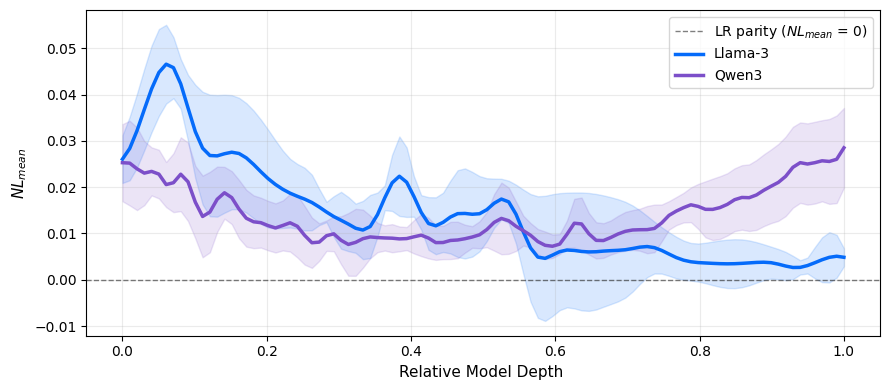

In [40]:
# ── L5: Cross-model NLS curves using relative depth ─────────────────────────
# Each model's layers are mapped to [0,1] so curves overlay regardless of
# absolute layer count.  Mean ± 95% CI across models within each family.

def plot_nls_by_relative_depth(
    nls_layer: pd.DataFrame,
    families: list = None,
    n_interp: int = 100,
    figsize=(9, 4),
    save_path: str = None,
):
    """
    Smooth NLS-vs-relative-depth curves per family.

    Uses scipy cubic interpolation per model to a shared [0,1] grid,
    then plots mean ± 95% CI band across models in each family.
    """
    from scipy.interpolate import interp1d

    if families is None:
        families = sorted(nls_layer["family"].unique())

    family_colors = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
        "Gemma3":   "#228833",
        "Qwen3-VL": "#AA3377",
        "Other":    "#888888",
    }

    xs = np.linspace(0, 1, n_interp)
    fig, ax = plt.subplots(figsize=figsize)
    ax.axhline(0, color="black", linewidth=1, linestyle="--", alpha=0.5,
               label=r"LR parity ($NL_{mean}$ = 0)")

    for family in families:
        fdf    = nls_layer[nls_layer["family"] == family]
        models = fdf["model"].unique()
        curves = []
        for model in models:
            mdf = fdf[fdf["model"] == model].sort_values("rel_depth")
            if len(mdf) < 3:
                continue
            # Cubic interpolation; use linear at edges to avoid ringing
            f = interp1d(
                mdf["rel_depth"].values, mdf["nls"].values,
                kind="cubic", bounds_error=False, fill_value="extrapolate",
            )
            curves.append(f(xs))

        if not curves:
            continue

        arr  = np.array(curves)               # shape (n_models, n_interp)
        mean = arr.mean(axis=0)
        sem  = arr.std(axis=0) / np.sqrt(len(arr))
        ci   = 1.96 * sem

        color = family_colors.get(family, "#888888")
        ax.plot(xs, mean, color=color, linewidth=2.5, label=family)
        ax.fill_between(xs, mean - ci, mean + ci, color=color, alpha=0.15)

    # Shade the layer-group regions for reference (approximate)
    # group_spans = {"a": (0.0, 0.25), "b": (0.25, 0.5),
    #                "c": (0.5, 0.75), "d": (0.75, 1.0)}
    # group_colors = {"a": "#4477AA22", "b": "#66CCEE22",
    #                 "c": "#CCBB4422", "d": "#EE667722"}
    # for g, (lo, hi) in group_spans.items():
    #     ax.axvspan(lo, hi, color=group_colors[g], zorder=0)
    #     ax.text((lo + hi) / 2, ax.get_ylim()[0], g,
    #             ha="center", va="bottom", fontsize=9, color="#555555")

    ax.set_xlabel("Relative Model Depth ", fontsize=11)
    ax.set_ylabel(r"$NL_{mean}$", fontsize=11)
    # ax.set_title("NLS across model depth — mean ± 95 % CI per family", fontsize=12)
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.25)
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_nls_by_relative_depth(nls_layer, save_path="NL_mean_Qwen3-4B_toxicity_full.pdf")


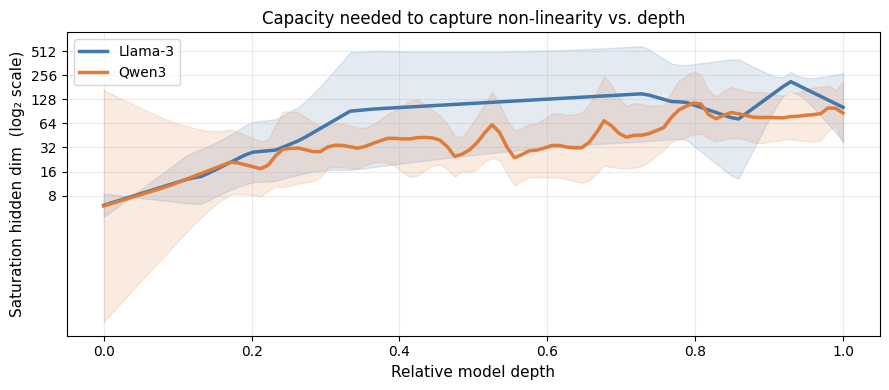

In [ ]:
# ── L6: Saturation-dim curve across relative depth ───────────────────────────
# The saturation point (which hidden_dim captures 90% of max MLP gain) as a
# function of relative depth — shows how much capacity is *needed* at each
# point in the residual stream.

def plot_saturation_by_depth(
    nls_layer: pd.DataFrame,
    families: list = None,
    figsize=(9, 4),
    save_path: str = None,
):
    from scipy.interpolate import interp1d

    if families is None:
        families = sorted(nls_layer["family"].unique())

    family_colors = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
    }
    xs   = np.linspace(0, 1, 100)
    fig, ax = plt.subplots(figsize=figsize)

    for family in families:
        fdf    = nls_layer[(nls_layer["family"] == family) &
                           (nls_layer["max_gain"] > 0.005)]  # only meaningful gains
        models = fdf["model"].unique()
        curves = []
        for model in models:
            mdf = fdf[fdf["model"] == model].sort_values("rel_depth")
            if len(mdf) < 3:
                continue
            f = interp1d(
                mdf["rel_depth"].values,
                np.log2(mdf["saturation_dim"].values.clip(min=1)),
                kind="linear", bounds_error=False, fill_value="extrapolate",
            )
            curves.append(f(xs))

        if not curves:
            continue
        arr  = np.array(curves)
        mean = arr.mean(axis=0)
        sem  = arr.std(axis=0) / np.sqrt(len(arr))
        color = family_colors.get(family, "#888888")
        ax.plot(xs, 2**mean, color=color, linewidth=2.5, label=family)
        ax.fill_between(xs, 2**(mean - 1.96*sem), 2**(mean + 1.96*sem),
                        color=color, alpha=0.15)

    ax.set_yscale("log", base=2)
    ax.set_yticks([8, 16, 32, 64, 128, 256, 512])
    ax.set_yticklabels([8, 16, 32, 64, 128, 256, 512])
    ax.set_xlabel("Relative model depth", fontsize=11)
    ax.set_ylabel("Saturation hidden dim  (log₂ scale)", fontsize=11)
    ax.set_title("Capacity needed to capture non-linearity vs. depth", fontsize=12)
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.25)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_saturation_by_depth(nls_layer) #save_path="figures/saturation_dim.pdf"

In [8]:
# ── L7: Three-level Wilcoxon signed-rank tests ───────────────────────────────
#
# Level 1 — one p-value per model
#   Null: median(MLP_acc − LR_acc) = 0  across all (layer, dataset, medley, hd)
#
# Level 2 — one p-value per (family, decile)
#   Pool all models within a family; run per relative-depth decile.
#   Gives a 10-point significance curve comparable across families.
#
# Level 3 — per layer group (existing, kept for paper compatibility)

from scipy.stats import wilcoxon as _wilcoxon
from scipy.stats import false_discovery_control as fdr

def _run_wilcoxon(diffs: np.ndarray) -> dict:
    """Run Wilcoxon signed-rank test on a diff array; return summary dict."""
    if len(diffs) < 6:
        return {"n": len(diffs), "stat": np.nan, "p_value": np.nan,
                "mean_diff": float(np.mean(diffs)) if len(diffs) else np.nan}
    try:
        stat, p = _wilcoxon(diffs, alternative="two-sided")
    except Exception:
        stat, p = np.nan, np.nan
    return {"n": len(diffs), "stat": stat, "p_value": p,
            "mean_diff": float(np.mean(diffs))}


def wilcoxon_per_model(ldf: pd.DataFrame) -> pd.DataFrame:
    """
    Level 1: one Wilcoxon test per model.

    For each (layer, dataset, medley, hidden_dim) combination, compute
    MLP_acc − LR_acc.  The LR accuracy for a given (layer, dataset, medley)
    is matched to every MLP hidden_dim at the same coordinates.
    """
    rows = []
    for model, mdf in ldf.groupby("model"):
        family = mdf["family"].iloc[0]

        # Index LR accuracies by (layer, val_dataset, medley)
        lr_idx = (
            mdf[mdf["probe"] == "LRProbe"]
            .set_index(["layer", "val_dataset", "medley"])["accuracy"]
        )
        print(lr_idx)

        diffs = []
        for _, row in mdf[mdf["hidden_dim"] > 0].iterrows():
            key = (row["layer"], row["val_dataset"], row["medley"])
            if key in lr_idx.index:
                diffs.append(row["accuracy"] - lr_idx.loc[key])

        result = _run_wilcoxon(np.array(diffs))
        rows.append({"model": model, "family": family, **result})

    return pd.DataFrame(rows).sort_values(["family", "model"])


def wilcoxon_per_decile(ldf: pd.DataFrame) -> pd.DataFrame:
    """
    Level 2: one Wilcoxon test per (family, decile).

    Pools all (model, layer, dataset, medley, hidden_dim) within the same
    family and decile bucket.  Allows cross-model comparison on a shared
    0-9 relative-depth scale.
    """
    rows = []
    # Build LR index across the full dataframe
    lr_global = (
        ldf[ldf["probe"] == "LRProbe"]
        .set_index(["model", "layer", "val_dataset", "medley"])["accuracy"]
    )
    #print(lr_global)

    for (family, decile), grp in ldf[ldf["hidden_dim"] > 0].groupby(
        ["family", "decile"]
    ):
        diffs = []
        for _, row in grp.iterrows():
            key = (row["model"], row["layer"], row["val_dataset"], row["medley"])
            if key in lr_global.index:
                diffs.append(row["accuracy"] - lr_global.loc[key])
        result = _run_wilcoxon(np.array(diffs))
        rows.append({"family": family, "decile": decile,
                     "rel_depth_mid": (decile + 0.5) / 10, **result})

    return pd.DataFrame(rows).sort_values(["family", "decile"])


def wilcoxon_per_group(ldf: pd.DataFrame) -> pd.DataFrame:
    """
    Level 3: per layer group (a/b/c/d) — matches the existing paper analysis.

    Requires "layer_group" column to be present in ldf, or derives it by
    matching layer values against the config layer group assignments.
    """
    # Assign group labels if not already present
    if "layer_group" not in ldf.columns or ldf["layer_group"].isna().all():
        def _assign_group(row):
            model = row["model"]
            for g in ["a", "b", "c", "d"]:
                try:
                    if get_layer(model, g) == row["layer"]:
                        return g
                except Exception:
                    pass
            return np.nan
        ldf = ldf.copy()
        ldf["layer_group"] = ldf.apply(_assign_group, axis=1)

    group_df = ldf[ldf["layer_group"].notna()]
    lr_global = (
        group_df[group_df["probe"] == "LRProbe"]
        .set_index(["model", "layer", "val_dataset", "medley"])["accuracy"]
    )
    rows = []
    for (family, group), grp in group_df[group_df["hidden_dim"] > 0].groupby(
        ["family", "layer_group"]
    ):
        diffs = []
        for _, row in grp.iterrows():
            key = (row["model"], row["layer"], row["val_dataset"], row["medley"])
            if key in lr_global.index:
                diffs.append(row["accuracy"] - lr_global.loc[key])
        result = _run_wilcoxon(np.array(diffs))
        rows.append({"family": family, "layer_group": group, **result})

    return (
        pd.DataFrame(rows)
        .sort_values(["family", "layer_group"])
        .assign(layer_group=lambda d: pd.Categorical(
            d["layer_group"], categories=["a","b","c","d"], ordered=True
        ))
        .sort_values(["family", "layer_group"])
    )

In [9]:
# ── Run all three levels ──────────────────────────────────────────────────────
ldf = load_layerwise_results(medleys=medleys, val_datasets=val_datasets)

#w_model  = wilcoxon_per_model(ldf)
w_decile = wilcoxon_per_decile(ldf)
#w_group  = wilcoxon_per_group(ldf)

#print("=== Level 1: per model ===")
#print(w_model[["model","family","n","mean_diff","p_value"]].to_string(index=False))

print("\n=== Level 2: per decile ===")
print(w_decile[["family","decile","n","mean_diff","p_value"]].to_string(index=False))

# print("\n=== Level 3: per group ===")
# print(w_group[["family","layer_group","n","mean_diff","p_value"]].to_string(index=False))


=== Level 2: per decile ===
 family  decile   n  mean_diff      p_value
Llama-3       0 224   0.048748 1.020094e-09
Llama-3       1 196   0.017373 3.141691e-05
Llama-3       2 196   0.014047 1.493392e-02
Llama-3       3 196   0.004845 1.015470e-01
Llama-3       4 168   0.005175 2.035280e-01
Llama-3       5 224   0.008774 3.024505e-05
Llama-3       6 196   0.003103 6.901989e-02
Llama-3       7 196   0.000282 4.587093e-01
Llama-3       8 196  -0.002554 3.750013e-01
Llama-3       9 252  -0.002094 1.612674e-01
  Qwen3       0 840   0.033816 7.343271e-24
  Qwen3       1 756   0.010996 6.877731e-06
  Qwen3       2 728   0.004292 2.460594e-03
  Qwen3       3 756   0.011510 5.720653e-25
  Qwen3       4 644   0.012803 7.819642e-31
  Qwen3       5 840   0.012139 2.863939e-30
  Qwen3       6 756   0.009682 1.725269e-19
  Qwen3       7 728   0.017929 7.762477e-57
  Qwen3       8 756   0.017682 3.433989e-38
  Qwen3       9 840   0.021538 2.450344e-44


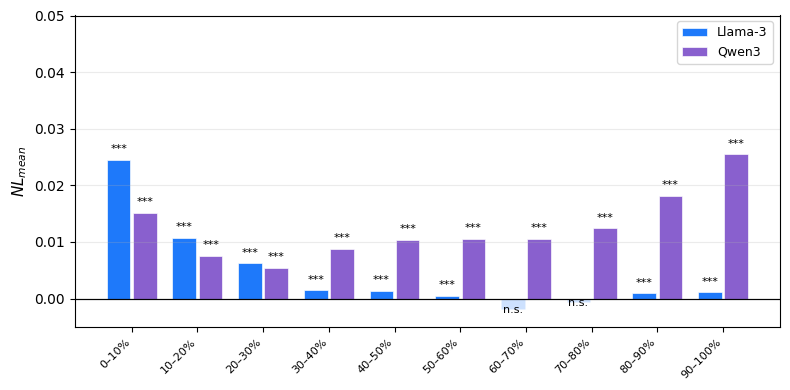

In [13]:
# ── L8: Visualise significance across relative depth (Level 2) ───────────────
# Bar chart of mean_diff per decile, coloured by significance level,
# one subplot per family.  Makes the "non-linearity emerges progressively"
# narrative immediately visible.

def plot_decile_significance(
    w_decile: pd.DataFrame,
    alpha: float = 0.05,
    figsize=(8, 4),
    save_path: str = None,
):
    families = sorted(w_decile["family"].unique())
    fig, ax = plt.subplots(figsize=figsize, sharey=True)
    # if len(families) == 1:
    #     axes = [axes]

    family_colors = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
        "Gemma3":   "#228833",
        "Qwen3-VL": "#AA3377",
        "Other":    "#888888",
    }

    decile_labels = [f"{d*10}–{d*10+10}%" for d in range(10)]
    # fsub = sub[sub["family"] == family].set_index("decile")
    # heights = [fsub.loc[lg, "score"] if lg in fsub.index else 0.
    #             for lg in layer_order]
    bar_width = 0.8/len(families)
    offsets = [(j - len(families)/2 + 0.5) * bar_width
                for j in range(len(families))]
    for i, family in enumerate(families):
        fdf = (
            w_decile[w_decile["family"] == family]
            .sort_values("decile")
            .set_index("decile")
            .reindex(range(10))
        )

        mean_diffs = fdf["mean_diff"].fillna(0).values
        p_vals     = fdf["p_value"].values

        # # Color bars by significance
        alpha_cs: list = []
        for p, d in zip(p_vals, mean_diffs):
            if np.isnan(p):
                alpha_cs.append(0.0) #bar_colors.append("#BBBBBB")
            elif p < 0.001:
                alpha_cs.append(0.9)# bar_colors.append("#228833" if d > 0 else "#CC3311")
            elif p < 0.01:
                alpha_cs.append(0.75) #bar_colors.append("#2DB544" if d > 0 else "#CC3311")
            elif p < alpha:
                alpha_cs.append(0.5) #bar_colors.append("#37DE53" if d > 0 else "#EE7755")#D9FFDF
            else:
                alpha_cs.append(0.20) #bar_colors.append("#DDDDDD")
        layer_order   = fdf.index
        x = np.arange(len(layer_order))
        bars = ax.bar(x+offsets[i], mean_diffs,
                      width=bar_width * 0.9, 
                      color=family_colors.get(family, "#888888"), 
                      edgecolor="white",
                      linewidth=0.5,
                      label=family,
                      )
        for bar, alpha_c in zip(bars, alpha_cs):
            bar.set_alpha(alpha_c)
        ax.axhline(0, color="black", alpha=0.9, linewidth=0.8)


            # ax.bar(
            #     x + offsets[i], heights,
            #     width=bar_width * 0.9,
            #     color=family_colors.get(family, "#888888"),
            #     label=family, alpha=0.85,
            # )

        # Annotate p-values
        for i, (bar, p) in enumerate(zip(bars, p_vals)):
            if not np.isnan(p):
                sig = "***" if p < 0.001 else ("**" if p < 0.01
                        else ("*" if p < alpha else "n.s."))
                ax.text(bar.get_x() + bar.get_width() / 2,
                        bar.get_height() + 0.001 * np.sign(bar.get_height()),
                        sig, ha="center", va="bottom", fontsize=8)
        ax.set_ylim(-0.005, 0.05)
        ax.set_xticks(range(10))
        ax.set_xticklabels(decile_labels, rotation=45, ha="right", fontsize=8)
        #ax.set_title(family, fontsize=12)
        ax.grid(True, axis="y", alpha=0.25)

    ax.set_ylabel(r"$NL_{mean}$", fontsize=11)

    # Legend
    # from matplotlib.patches import Patch
    # legend_elements = [
    #     Patch(facecolor="#196325", label="p < 0.001, positive"),
    #     Patch(facecolor="#88CC55", label=f"p < {alpha}, positive"),
    #     Patch(facecolor="#EE7755", label=f"p < {alpha}, negative"),
    #     Patch(facecolor="#CC3311", label="p < 0.001, negative"),
    #     Patch(facecolor="#DDDDDD", label="n.s."),
    # ]
    fig.legend(loc="upper right", fontsize=9, frameon=True, bbox_to_anchor=(0.98, 0.95))

    # fig.suptitle("MLP gain over LR by relative depth decile  (Wilcoxon signed-rank)",
    #              fontsize=12)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_decile_significance(w_decile, save_path="all_toxicity_results/NL_mean_wilcoxon_toxicity_full.pdf") #save_path="figures/wilcoxon_decile_significance.pdf"

In [ ]:
# ── L10: End-to-end convenience runner ──────────────────────────────────────
# Run this cell to reproduce all full-layer figures and tables from scratch.

def run_full_layer_analysis(
    results_file=LAYERWISE_FILE,
    figures_dir: str = "figures",
    families: list = None,
):
    """
    Load results, compute NLS and Wilcoxon tests at all three levels,
    generate all figures, and return the key DataFrames for further inspection.
    """
    import pathlib
    pathlib.Path(figures_dir).mkdir(parents=True, exist_ok=True)

    print("Loading results...")
    ldf = load_layerwise_results(results_file)
    if families:
        ldf = ldf[ldf["family"].isin(families)]

    print("Computing layerwise NLS...")
    nls_layer = compute_layerwise_nls(ldf)

    print("Running Wilcoxon tests...")
    w_model  = wilcoxon_per_model(ldf)
    w_decile = wilcoxon_per_decile(ldf)
    w_group  = wilcoxon_per_group(ldf)

    print("\n=== Wilcoxon per model ===")
    print(w_model[["model","family","n","mean_diff","p_value"]].to_string(index=False))

    print("\n=== Wilcoxon per decile (family × depth) ===")
    print(w_decile[["family","decile","n","mean_diff","p_value"]].to_string(index=False))

    print("\n=== Wilcoxon per layer group ===")
    print(w_group.to_string(index=False))

    print("\nGenerating figures...")

    # Per-model heatmaps (saved to PDF per family)
    for fam in ldf["family"].unique():
        plot_layerwise_family(
            ldf, fam,
            save_path=f"{figures_dir}/layerwise_{fam.replace('-','_')}.pdf",
        )

    # NLS by relative depth
    plot_nls_by_relative_depth(
        nls_layer,
        save_path=f"{figures_dir}/nls_relative_depth.pdf",
    )

    # Saturation dim by depth
    plot_saturation_by_depth(
        nls_layer,
        save_path=f"{figures_dir}/saturation_dim.pdf",
    )

    # Wilcoxon significance bars
    plot_decile_significance(
        w_decile,
        save_path=f"{figures_dir}/wilcoxon_decile_significance.pdf",
    )

    # Summary table
    tbl = make_model_summary_table(nls_layer, w_model)
    tbl.to_csv(f"{figures_dir}/model_summary_table.csv", index=False)
    print(f"\nSummary table → {figures_dir}/model_summary_table.csv")

    return ldf, nls_layer, w_model, w_decile, w_group, tbl


# Uncomment to run everything:
# ldf, nls_layer, w_model, w_decile, w_group, tbl = run_full_layer_analysis()


---
## Probe Convergence Analysis

In [18]:
# ── T1: Build and melt training-info DataFrame ──────────────────────────────
#
# `make_training_info_statistics` (your existing function, reproduced here
# with minor fixes) produces one row per (model, layer) in WIDE format.
# `melt_training_info` converts it to LONG format — one row per
# (model, layer, probe_type) — which all downstream plots consume.
#
# probe_type values:  "LR"  |  "MLP_8" | "MLP_16" | ... | "MLP_512"
# key columns added:  hidden_dim (int, 0 for LR), is_linear (bool)

def make_training_info_statistics(ldf: pd.DataFrame) -> pd.DataFrame:
    """
    Aggregate training_info columns from the layer-wise results DataFrame.

    Expects ldf to contain columns: best_epoch, probe, hidden_dim
    (populated by load_results when training_info is stored in the JSON).

    Returns one row per (model, layer) with columns:
      lr_mean_epoch | lr_std_epoch |
      hd_<k>_mean_epoch | hd_<k>_std_epoch  for each hidden_dim k
    """
    records = []
    for (model, layer), grp in ldf.groupby(["model", "layer"]):
        family   = grp["family"].iloc[0]
        n_layers = int(grp["n_layers"].iloc[0])
        rel_dep  = layer / (n_layers - 1)
        decile   = min(int(rel_dep * 10), 9)

        lr_sub = grp[grp["probe"] == "LRProbe"]["best_epoch"]
        if lr_sub.empty or lr_sub.isna().all():
            continue
        lr_mean = lr_sub.mean()
        lr_std  = lr_sub.std()
        if np.isnan(lr_mean):
            continue

        mlp_grp = grp[grp["hidden_dim"] > 0]
        if mlp_grp.empty:
            continue

        mlp_means = {
            f"hd_{int(dim)}_mean_epoch": vals["best_epoch"].mean()
            for dim, vals in mlp_grp.groupby("hidden_dim")
        }
        mlp_stds = {
            f"hd_{int(dim)}_std_epoch": vals["best_epoch"].std()
            for dim, vals in mlp_grp.groupby("hidden_dim")
        }
        records.append({
            "model":         model,
            "family":        family,
            "layer":         layer,
            "n_layers":      n_layers,
            "rel_depth":     rel_dep,
            "decile":        decile,
            "lr_mean_epoch": float(lr_mean),
            "lr_std_epoch":  float(lr_std),
            **mlp_means,
            **mlp_stds,
        })
    return pd.DataFrame(records)


def melt_training_info(df_training: pd.DataFrame) -> pd.DataFrame:
    """
    Convert wide df_training to long form.

    Each row in the output represents one (model, layer, probe_type)
    with columns:
        model | family | layer | n_layers | rel_depth | decile |
        probe_type | hidden_dim | is_linear | mean_epoch | std_epoch

    probe_type examples: "LR", "MLP_8", "MLP_16", ..., "MLP_512"
    """
    hidden_dims = sorted(set(
        int(col.split("_")[1])
        for col in df_training.columns
        if col.startswith("hd_") and col.endswith("_mean_epoch")
    ))

    meta_cols = ["model", "family", "layer", "n_layers", "rel_depth", "decile"]
    records   = []

    for _, row in df_training.iterrows():
        base = {c: row[c] for c in meta_cols}

        # LR row
        records.append({
            **base,
            "probe_type": "LR",
            "hidden_dim": 0,
            "is_linear":  True,
            "mean_epoch": row["lr_mean_epoch"],
            "std_epoch":  row.get("lr_std_epoch", np.nan),
        })

        # MLP rows
        for hd in hidden_dims:
            mean_col = f"hd_{hd}_mean_epoch"
            std_col  = f"hd_{hd}_std_epoch"
            if mean_col not in row.index or np.isnan(row[mean_col]):
                continue
            records.append({
                **base,
                "probe_type": f"MLP_{hd}",
                "hidden_dim": hd,
                "is_linear":  False,
                "mean_epoch": float(row[mean_col]),
                "std_epoch":  float(row.get(std_col, np.nan)),
            })

    long_df = pd.DataFrame(records)
    # Ordered probe_type category for consistent x-axis ordering
    pt_order = ["LR"] + [f"MLP_{hd}" for hd in hidden_dims]
    long_df["probe_type"] = pd.Categorical(
        long_df["probe_type"], categories=pt_order, ordered=True
    )
    return long_df


# Usage:
df_training = make_training_info_statistics(ldf)
long_df     = melt_training_info(df_training)
print(long_df[["model","layer","probe_type","hidden_dim","mean_epoch"]].head(10))

        model  layer probe_type  hidden_dim  mean_epoch
0  Qwen3-0_6B      0         LR           0       149.5
1  Qwen3-0_6B      0      MLP_8           8        48.5
2  Qwen3-0_6B      0     MLP_16          16        55.5
3  Qwen3-0_6B      0     MLP_32          32        62.0
4  Qwen3-0_6B      0     MLP_64          64        72.5
5  Qwen3-0_6B      0    MLP_128         128        55.5
6  Qwen3-0_6B      0    MLP_256         256        37.0
7  Qwen3-0_6B      0    MLP_512         512        34.5
8  Qwen3-0_6B      1         LR           0        60.5
9  Qwen3-0_6B      1      MLP_8           8        71.0


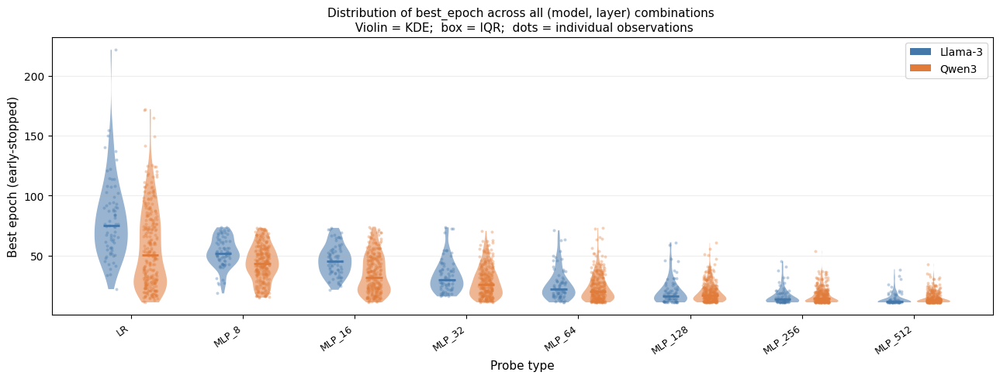

In [ ]:
# ── T2: Violin plot — best_epoch distribution per probe type ────────────────
#
# Each violin shows the distribution of mean_epoch values across all
# (model, layer) combinations for that probe type.  Splitting by family
# reveals whether convergence patterns differ architecturally.
#
# Reading guide:
#   Wide violin  → high variance in when this probe type converges
#   Median line  → typical convergence point
#   Long upper tail → some layers take much longer (hard-to-probe layers)

def plot_epoch_distributions(
    long_df: pd.DataFrame,
    figsize=(13, 5),
    save_path: str = None,
):
    """
    Split violins per probe_type, coloured by family.

    The box inside each violin marks Q1–Q3; the white dot marks the median.
    Overlaid strip (jittered dots) shows individual (model, layer) data points
    so you can see the raw scatter, not just the KDE.
    """
    families = sorted(long_df["family"].unique())
    family_colors = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }
    probe_order = long_df["probe_type"].cat.categories.tolist()
    x_pos       = {pt: i for i, pt in enumerate(probe_order)}
    n_fam       = len(families)
    width       = 0.35
    offsets     = np.linspace(-width*(n_fam-1)/2, width*(n_fam-1)/2, n_fam)

    fig, ax = plt.subplots(figsize=figsize)

    for fam, offset in zip(families, offsets):
        color = family_colors.get(fam, "#888888")
        fdf   = long_df[long_df["family"] == fam]

        positions = [x_pos[pt] + offset for pt in probe_order]
        data      = [fdf[fdf["probe_type"] == pt]["mean_epoch"].dropna().values
                     for pt in probe_order]

        parts = ax.violinplot(
            data, positions=positions,
            widths=width * 0.85,
            showmedians=True, showextrema=False,
        )
        for pc in parts["bodies"]:
            pc.set_facecolor(color)
            pc.set_alpha(0.55)
        parts["cmedians"].set_color(color)
        parts["cmedians"].set_linewidth(2)

        # Strip: jittered raw points
        rng = np.random.default_rng(42)
        for pt, pos, d in zip(probe_order, positions, data):
            if len(d) == 0:
                continue
            jitter = rng.uniform(-width*0.18, width*0.18, len(d))
            ax.scatter(pos + jitter, d, color=color, s=8,
                       alpha=0.35, zorder=3, linewidths=0)

    # Legend
    handles = [plt.matplotlib.patches.Patch(
                   facecolor=family_colors.get(f, "#888"), label=f)
               for f in families]
    ax.legend(handles=handles, fontsize=10, frameon=True)

    ax.set_xticks(range(len(probe_order)))
    ax.set_xticklabels(probe_order, rotation=35, ha="right", fontsize=9)
    ax.set_ylabel("Best epoch (early-stopped)", fontsize=11)
    ax.set_xlabel("Probe type", fontsize=11)
    ax.set_title(
        "Distribution of best_epoch across all (model, layer) combinations \n Violin = KDE;  box = IQR;  dots = individual observations",
        fontsize=11,
    )
    ax.grid(True, axis="y", alpha=0.22)
    plt.tight_layout()
    #if save_path:
    #    plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


long_df = melt_training_info(df_training)
plot_epoch_distributions(long_df, save_path="figures/epoch_distributions.pdf")


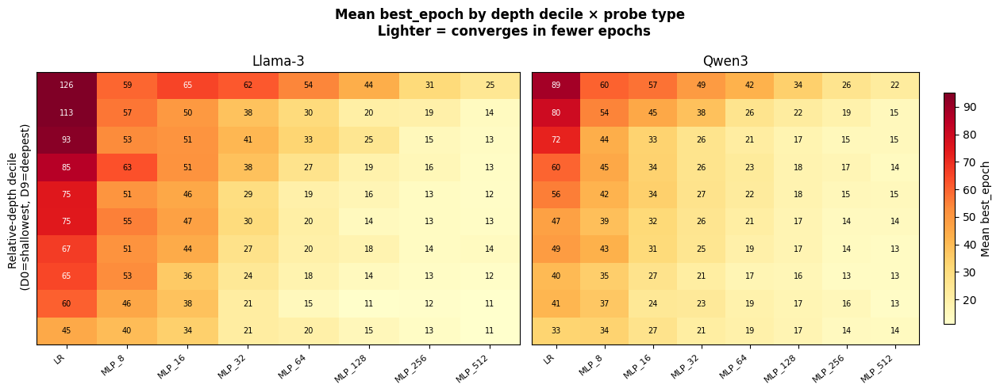

In [20]:
# ── T3: Heatmap — mean best_epoch by decile × probe type, per family ─────────
#
# Shows the JOINT effect of model depth (decile, rows) and probe capacity
# (hidden_dim, columns) on convergence speed.
#
# Key patterns to look for:
#   Darker rows at top (early layers) → early layers need more epochs
#   Darker left columns (small MLPs)  → small MLPs need more epochs
#   Interaction: if late layers + large MLPs is distinctly lighter,
#   it suggests non-linearity there is both easy to find AND easy to fit.

def plot_epoch_heatmap(
    long_df: pd.DataFrame,
    families: list = None,
    figsize=(13, 5),
    save_path: str = None,
):
    """
    One heatmap panel per family.  Rows = decile (0=shallowest, 9=deepest),
    columns = probe type (LR, MLP_8, …, MLP_512).
    Colour = mean best_epoch (yellow=few, purple=many).
    """
    if families is None:
        families = sorted(long_df["family"].unique())

    probe_order = long_df["probe_type"].cat.categories.tolist()
    n_fam   = len(families)
    fig, axes = plt.subplots(1, n_fam,
                             figsize=(figsize[0], figsize[1]),
                             sharey=True)
    if n_fam == 1:
        axes = [axes]

    # Shared colour scale across families
    vmin = long_df["mean_epoch"].quantile(0.02)
    vmax = long_df["mean_epoch"].quantile(0.98)

    for ax, family in zip(axes, families):
        fdf   = long_df[long_df["family"] == family]
        grid  = np.full((10, len(probe_order)), np.nan)
        for j, pt in enumerate(probe_order):
            by_dec = (fdf[fdf["probe_type"] == pt]
                      .groupby("decile")["mean_epoch"].mean())
            for d in range(10):
                if d in by_dec.index:
                    grid[d, j] = by_dec[d]

        im = ax.imshow(grid, aspect="auto", cmap="YlOrRd",
                       vmin=vmin, vmax=vmax, interpolation="nearest")

        # Annotate cells
        for i in range(10):
            for j in range(len(probe_order)):
                if not np.isnan(grid[i, j]):
                    ax.text(j, i, f"{grid[i,j]:.0f}",
                            ha="center", va="center", fontsize=7,
                            color="white" if grid[i,j] > (vmin+vmax)*0.6
                                  else "black")

        ax.set_xticks(range(len(probe_order)))
        ax.set_xticklabels(probe_order, rotation=40, ha="right", fontsize=8)
        ax.set_title(family, fontsize=12)
        if ax is axes[0]:
            ax.set_yticks(range(10))
            ax.set_yticklabels(
                [f"D{d}  ({d*10}–{d*10+10}%)" for d in range(10)],
                fontsize=8,
            )
            ax.set_ylabel("Relative-depth decile \n (D0=shallowest, D9=deepest)",
                          fontsize=10)
        else:
            ax.set_yticks([])

    fig.colorbar(im, ax=axes[-1], label="Mean best_epoch", shrink=0.85)
    fig.suptitle(
        "Mean best_epoch by depth decile × probe type \n Lighter = converges in fewer epochs",
        fontsize=12, fontweight="bold",
    )
    plt.tight_layout()
    #if save_path:
    #    plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_epoch_heatmap(long_df, save_path="figures/epoch_heatmap.pdf")


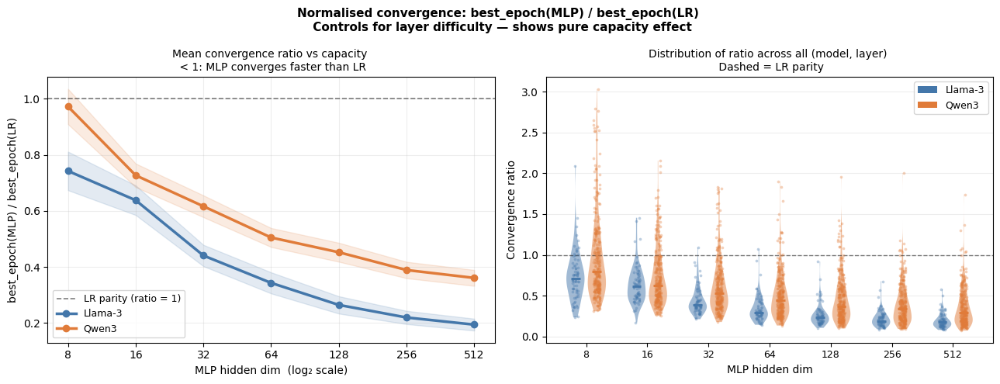

In [ ]:
# ── T4: Normalised convergence ratio — best_epoch(MLP) / best_epoch(LR) ──────
#
# Divides each MLP's mean_epoch by the LR mean_epoch at the SAME (model, layer),
# then plots the distribution of this ratio across all (model, layer) pairs.
#
# Ratio < 1 : MLP converges faster than LR at that layer
# Ratio = 1 : same speed
# Ratio > 1 : MLP needs more epochs (under-fitting regime or noisy optimisation)
#
# This removes the confound that some layers are simply harder to probe
# (high LR epoch count), exposing the pure capacity effect.
#
# Two sub-figures:
#   Left  — ratio vs log(hidden_dim), mean ± 95% CI per family
#   Right — ratio distributions as violins per hidden_dim (collapsed over depth)

def compute_epoch_ratio(long_df: pd.DataFrame) -> pd.DataFrame:
    """
    For each (model, layer, probe_type) row where probe_type != "LR",
    divide mean_epoch by the LR mean_epoch at the same (model, layer).

    Returns a DataFrame with the same rows as long_df (MLP only) plus
    a new column: epoch_ratio = mean_epoch / lr_mean_epoch
    """
    lr_idx = (
        long_df[long_df["is_linear"]]
        .set_index(["model", "layer"])["mean_epoch"]
        .rename("lr_mean_epoch")
    )
    mlp = long_df[~long_df["is_linear"]].copy()
    mlp = mlp.join(lr_idx, on=["model", "layer"])
    mlp["epoch_ratio"] = mlp["mean_epoch"] / mlp["lr_mean_epoch"]
    # Drop rows where LR didn't converge (lr_mean_epoch == 0 or NaN)
    mlp = mlp[mlp["lr_mean_epoch"] > 0].copy()
    return mlp


def plot_epoch_ratio(
    long_df: pd.DataFrame,
    families: list = None,
    figsize=(13, 5),
    save_path: str = None,
):
    """
    Two-panel figure showing normalised convergence ratios.
    """
    from scipy.interpolate import interp1d as _interp1d

    ratio_df = compute_epoch_ratio(long_df)
    if families is None:
        families = sorted(ratio_df["family"].unique())

    family_colors = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }
    hidden_dims = sorted(ratio_df["hidden_dim"].unique())

    fig, (ax_line, ax_viol) = plt.subplots(1, 2, figsize=figsize)

    # ── Left: ratio vs hidden_dim line plot per family ────────────────────────
    ax_line.axhline(1.0, color="black", linewidth=1.2, linestyle="--",
                    alpha=0.5, label="LR parity (ratio = 1)")

    for family in families:
        color = family_colors.get(family, "#888888")
        fdf   = ratio_df[ratio_df["family"] == family]
        means, sems = [], []
        for hd in hidden_dims:
            vals = fdf[fdf["hidden_dim"] == hd]["epoch_ratio"].dropna()
            means.append(vals.mean() if len(vals) else np.nan)
            sems.append(vals.sem()  if len(vals) else np.nan)
        means, sems = np.array(means), np.array(sems)
        xs = np.log2(hidden_dims)
        ax_line.plot(xs, means, color=color, linewidth=2.5,
                     marker="o", markersize=6, label=family)
        ax_line.fill_between(xs, means - 1.96*sems, means + 1.96*sems,
                             color=color, alpha=0.15)

    ax_line.set_xticks(np.log2(hidden_dims))
    ax_line.set_xticklabels(hidden_dims)
    ax_line.set_xlabel("MLP hidden dim  (log₂ scale)", fontsize=10)
    ax_line.set_ylabel("best_epoch(MLP) / best_epoch(LR)", fontsize=10)
    ax_line.set_title("Mean convergence ratio vs capacity \n < 1: MLP converges faster than LR", fontsize=10)
    ax_line.legend(fontsize=9)
    ax_line.grid(True, alpha=0.22)

    # ── Right: violin per hidden_dim, colour by family ────────────────────────
    n_fam   = len(families)
    width   = 0.35
    offsets = np.linspace(-width*(n_fam-1)/2, width*(n_fam-1)/2, n_fam)
    x_pos   = {hd: i for i, hd in enumerate(hidden_dims)}

    ax_viol.axhline(1.0, color="black", linewidth=1, linestyle="--", alpha=0.5)

    for fam, offset in zip(families, offsets):
        color = family_colors.get(fam, "#888888")
        fdf   = ratio_df[ratio_df["family"] == fam]
        positions = [x_pos[hd] + offset for hd in hidden_dims]
        data      = [fdf[fdf["hidden_dim"] == hd]["epoch_ratio"].dropna().values
                     for hd in hidden_dims]

        parts = ax_viol.violinplot(
            data, positions=positions, widths=width * 0.85,
            showmedians=True, showextrema=False,
        )
        for pc in parts["bodies"]:
            pc.set_facecolor(color)
            pc.set_alpha(0.50)
        parts["cmedians"].set_color(color)
        parts["cmedians"].set_linewidth(2)

        rng = np.random.default_rng(0)
        for hd, pos, d in zip(hidden_dims, positions, data):
            if len(d) == 0:
                continue
            jitter = rng.uniform(-width*0.15, width*0.15, len(d))
            ax_viol.scatter(pos + jitter, d, color=color, s=7,
                            alpha=0.35, zorder=3, linewidths=0)

    ax_viol.set_xticks(range(len(hidden_dims)))
    ax_viol.set_xticklabels(hidden_dims, fontsize=9)
    ax_viol.set_xlabel("MLP hidden dim", fontsize=10)
    ax_viol.set_ylabel("Convergence ratio", fontsize=10)
    ax_viol.set_title("Distribution of ratio across all (model, layer) \n Dashed = LR parity", fontsize=10)

    handles = [plt.matplotlib.patches.Patch(
                   facecolor=family_colors.get(f,"#888"), label=f)
               for f in families]
    ax_viol.legend(handles=handles, fontsize=9, frameon=True)
    ax_viol.grid(True, axis="y", alpha=0.22)

    fig.suptitle(
        "Normalised convergence: best_epoch(MLP) / best_epoch(LR) \n Controls for layer difficulty — shows pure capacity effect",
        fontsize=11, fontweight="bold",
    )
    plt.tight_layout()
    #if save_path:
    #    plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


long_df = melt_training_info(df_training)
plot_epoch_ratio(long_df, save_path="figures/epoch_ratio.pdf")


---
## Capacity-Weighted Isotonic AUC (CWIA)
Replaces the simple-mean NLS with a measure that satisfies four formal desiderata:
capacity sensitivity, monotonicity reward, positivity, and ceiling normalisation.
See the theoretical discussion for the mathematical derivation.

In [15]:
# ── N1: Core CWIA computation ────────────────────────────────────────────────
import numpy as np
from sklearn.isotonic import IsotonicRegression

def _isotonic_envelope(values: np.ndarray) -> np.ndarray:
    """
    Non-decreasing isotonic envelope via the Pool Adjacent Violators algorithm.
    For each position k, returns max(values[:k+1]).
    """
    out = np.empty_like(values)
    running_max = -np.inf
    for i, v in enumerate(values):
        running_max = max(running_max, v)
        out[i] = running_max
    return out

def compute_cwia(
    g: np.ndarray,
    hidden_dims: np.ndarray,
    lr_acc: float,
    return_diagnostics: bool = False,
) -> float | dict:
    """
    Capacity-Weighted Isotonic AUC (CWIA).

    Parameters
    ----------
    g           : array of (MLP_acc - LR_acc) at each hidden_dim, shape (K,)
    hidden_dims : array of hidden dim values, shape (K,), e.g. [8,16,32,64,128,256,512]
    lr_acc      : mean LR accuracy at this (layer, dataset) combination
    return_diagnostics : if True, return a dict with intermediate values

    Returns
    -------
    float  : CWIA score in (-inf, 1]
        > 0  : MLP family systematically outperforms LR
        = 0  : parity
        < 0  : MLP family underperforms LR (typically early layers)

    Notes
    -----
    Step 1 — Isotonic projection (PAV algorithm, non-decreasing constraint).
              Enforces that the gain must be non-decreasing with capacity.
              Violations are penalised by pooling adjacent pairs, which
              reduces the weighted sum when violations occur at high-weight
              (large-d) positions.

    Step 2 — Log-capacity weighting.
              w_k = log2(d_k) - log2(d_{k-1}), with the first weight set to
              log2(d_1) - log2(d_0) using d_0 = d_min / (d_1/d_0) as the
              implied prior step.  For log-uniformly spaced dims all w_k
              are equal; for non-uniform spacing larger gaps get more weight.

    Step 3 — Ceiling normalisation.
              Divide by (1 - lr_acc) so the score is comparable across layers
              with different baseline accuracy levels.
    """
    hidden_dims = np.asarray(hidden_dims, dtype=float)
    g           = np.asarray(g, dtype=float)
    assert len(hidden_dims) == len(g), "hidden_dims and g must have the same length"
    assert lr_acc <= 1.0, "lr_acc must be <= 1.0"

    #lr_acc must be < 1.0 for ceiling normalisation
    if lr_acc == 1.0:
        lr_acc = 0.999

    # ── Step 1: isotonic regression (non-decreasing) ─────────────────────────
    # iso = IsotonicRegression(increasing=True, out_of_bounds="clip")
    # g_iso = iso.fit_transform(np.arange(len(g), dtype=float), g)
    g_iso  = _isotonic_envelope(g)

    # ── Step 2: log-capacity weights ─────────────────────────────────────────
    log_dims = np.log2(hidden_dims)
    # Width of each interval in log-space; first interval uses the implied step
    log_step   = np.diff(log_dims)
    first_step = log_step[0] if len(log_step) > 0 else 1.0
    # Weight of each point = half-interval to left + half-interval to right
    # (trapezoidal rule in log-space)
    left  = np.concatenate([[first_step], log_step]) / 2
    right = np.concatenate([log_step, [log_step[-1]]]) / 2
    w     = left + right                    # shape (K,)
    W     = w.sum()                         # total log-span
    #print(f"W: {W}")
    # ── Step 3: ceiling-normalised weighted sum ───────────────────────────────
    ceiling = 1.0 - lr_acc
    #print(f"ceiling: {ceiling}")
    cwia    = float(np.dot(w, g_iso) / (W * ceiling))
    #print(f"CWIA: {cwia}")
    #print()
    if cwia <= -1.0:
        print(f"g: {g}")
        print(f"g_iso: {g_iso}")
        print(f"lr_acc: {lr_acc}")
        print(f"W: {W}")
        print(f"ceiling: {ceiling}")
        print(f"CWIA: {cwia}")
        print()
    if not return_diagnostics:
        return cwia

    # Saturation point: first d where isotonic gain >= 90% of max isotonic gain
    max_iso   = g_iso.max()
    if max_iso > 0:
        sat_idx = int(np.argmax(g_iso >= 0.90 * max_iso))
    else:
        sat_idx = len(g_iso) - 1
    sat_dim = int(hidden_dims[sat_idx])

    # Monotonicity index: fraction of pairs (i<j) where g[i] <= g[j]
    n_pairs    = len(g) * (len(g) - 1) // 2
    concordant = sum(
        1 for i in range(len(g)) for j in range(i+1, len(g)) if g[i] <= g[j]
    )
    mono_index = concordant / n_pairs if n_pairs > 0 else 1.0

    # Raw (pre-isotonic) weighted mean for comparison with old NLS
    raw_nls = float(np.dot(w, g) / (W * ceiling))

    return {
        "cwia":         cwia,
        "raw_nls":      raw_nls,
        "g_raw":        g.tolist(),
        "g_iso":        g_iso.tolist(),
        "weights":      w.tolist(),
        "lr_acc":       lr_acc,
        "ceiling":      ceiling,
        "max_iso_gain": float(max_iso),
        "saturation_dim": sat_dim,
        "monotonicity_index": mono_index,
    }


In [50]:
# ── N2: Compute CWIA at every layer for every model ─────────────────────────

def compute_layerwise_cwia_mean(ldf: pd.DataFrame) -> pd.DataFrame:
    """
    Compute CWIA (and diagnostics) at every (model, layer) combination.

    Requires ldf to have columns: model, family, layer, n_layers, rel_depth,
    decile, hidden_dim (0 for LR, >0 for MLP), accuracy.

    Returns a DataFrame with one row per (model, layer).
    """
    records = []

    for (model, layer), grp in ldf.groupby(["model", "layer"]):
        family   = grp["family"].iloc[0]
        n_layers = int(grp["n_layers"].iloc[0])
        rel_dep  = layer / (n_layers - 1)
        decile   = min(int(rel_dep * 10), 9)

        # LR baseline: mean over all val_datasets and medleys
        lr_acc = grp[grp["probe"] == "LRProbe"]["accuracy"].mean()
        if np.isnan(lr_acc) or lr_acc >= 1.0:
            continue

        # MLP means per hidden_dim (averaged over val_datasets and medleys)
        mlp_grp = (
            grp[grp["hidden_dim"] > 0]
            .groupby("hidden_dim")["accuracy"]
            .mean()
            .sort_index()
        )
        if mlp_grp.empty:
            continue

        hidden_dims = mlp_grp.index.values.astype(float)
        g           = mlp_grp.values - lr_acc
        #print(g)
        diag = compute_cwia(g, hidden_dims, lr_acc, return_diagnostics=True)

        records.append({
            "model":              model,
            "family":             family,
            "layer":              layer,
            "n_layers":           n_layers,
            "rel_depth":          rel_dep,
            "decile":             decile,
            **diag,
        })

    df = pd.DataFrame(records)
    # Convenience: keep old "nls" column name pointing to CWIA for compatibility
    df["nls"] = df["cwia"]
    return df

def compute_layerwise_cwia_all(
    ldf: pd.DataFrame,
    hidden_dims: list = None,
) -> pd.DataFrame:
    """
    Compute CWIA for every (model, layer, medley, val_dataset) combination.

    Parameters
    ----------
    ldf         : layer-wise results DataFrame from load_results().
                  Must contain columns: model, family, layer, n_layers,
                  hidden_dim, probe, medley, val_dataset, accuracy.
    hidden_dims : ordered list of MLP hidden dims to include in the sweep.
                  Default: all hidden_dims > 0 present in ldf, sorted.

    Returns
    -------
    DataFrame with one row per (model, layer, medley, val_dataset).
    Columns include all keys plus the output of compute_cwia(..., return_diagnostics=True):
      cwia | G | rho_tilde | saturation_dim | monotonicity_index |
      g_raw | g_iso | weights | ceiling | raw_nls | lr_acc
    Also adds: rel_depth | decile | nls (alias for cwia, for compatibility).
    """
    if hidden_dims is None:
        hidden_dims = sorted(ldf[ldf["hidden_dim"] > 0]["hidden_dim"].unique())

    # ── Build LR lookup: (model, layer, medley, val_dataset) → scalar acc ────
    # One LR value per combination — this is the paired baseline for each row.
    lr_lookup = (
        ldf[ldf["hidden_dim"] == 0]
        .groupby(["model", "layer", "medley", "val_dataset"])["accuracy"]
        .mean()   # mean over seeds/runs if duplicates exist; usually one value
    )

    records = []

    for (model, layer, medley, val_ds), grp in (
        ldf[ldf["hidden_dim"] > 0]
        .groupby(["model", "layer", "medley", "val_dataset"])
    ):
        # ── Look up LR baseline for this exact combination ───────────────────
        key = (model, layer, medley, val_ds)
        if key not in lr_lookup.index:
            continue
        lr_acc = float(lr_lookup.loc[key])
        #print(f"{key} : {lr_acc}")

        # ── One accuracy per hidden_dim for this combination ─────────────────
        # Use mean over duplicate rows (e.g. multiple seeds), reindex to
        # ensure the full hidden_dim sweep is present in the expected order.
        hd_acc = (
            grp.groupby("hidden_dim")["accuracy"]
            .mean()
            .reindex(hidden_dims)
        )
        if hd_acc.isna().any():
            # Skip if any hidden_dim is missing for this combination
            continue

        g = hd_acc.values - lr_acc   # delta vector, length = len(hidden_dims)
        #print(g)
        # ── Compute CWIA ─────────────────────────────────────────────────────
        diag = compute_cwia(
            g,
            np.array(hidden_dims, dtype=float),
            lr_acc,
            return_diagnostics=True,
        )

        # ── Attach positional metadata ────────────────────────────────────────
        family   = grp["family"].iloc[0]
        n_layers = int(grp["n_layers"].iloc[0])
        rel_dep  = layer / (n_layers - 1)
        decile   = min(int(rel_dep * 10), 9)

        records.append({
            "model":       model,
            "family":      family,
            "layer":       layer,
            "n_layers":    n_layers,
            "rel_depth":   rel_dep,
            "decile":      decile,
            "medley":      medley,
            "val_dataset": val_ds,
            "lr_acc":      lr_acc,
            **diag,
        })

    df = pd.DataFrame(records)
    # Compatibility alias
    if "cwia" in df.columns:
        df["nls"] = df["cwia"]
    return df


# ── Quick sanity check on a single (model, layer) ────────────────────────────
def demo_cwia(ldf: pd.DataFrame, model: str, layer: int):
    """Print a detailed CWIA breakdown for one (model, layer) combination."""
    grp = ldf[(ldf["model"] == model) & (ldf["layer"] == layer)]
    lr_acc  = grp[grp["probe"] == "LRProbe"]["accuracy"].mean()
    mlp_grp = (
        grp[grp["hidden_dim"] > 0]
        .groupby("hidden_dim")["accuracy"].mean()
        .sort_index()
    )
    g = mlp_grp.values - lr_acc
    d = mlp_grp.index.values.astype(float)

    result = compute_cwia(g, d, lr_acc, return_diagnostics=True)
    print(f"Model: {model}  |  Layer: {layer}")
    print(f"  LR accuracy   : {lr_acc:.4f}   ceiling = {result['ceiling']:.4f}")
    print(f"  hidden_dims   : {list(d.astype(int))}")
    print(f"  raw g(d)      : {[round(x,4) for x in result['g_raw']]}")
    print(f"  isotonic g(d) : {[round(x,4) for x in result['g_iso']]}")
    print(f"  log2 weights  : {[round(x,3) for x in result['weights']]}")
    print(f"  raw NLS       : {result['raw_nls']:+.5f}")
    print(f"  CWIA          : {result['cwia']:+.5f}")
    print(f"  monotonicity  : {result['monotonicity_index']:.3f}  (1=perfectly monotone)")
    print(f"  saturation dim: {result['saturation_dim']}")


ldf = load_layerwise_results(medleys=medleys, val_datasets=val_datasets)
cwia_df_mean = compute_layerwise_cwia_mean(ldf)
cwia_df_all = compute_layerwise_cwia_all(ldf)
demo_cwia(ldf, "Qwen3-4B", layer=30)


g: [-0.26069516 -0.27139038 -0.10828876  0.01336902  0.02339572  0.02339572
  0.02339572]
g_iso: [-0.26069516 -0.26069516 -0.10828876  0.01336902  0.02339572  0.02339572
  0.02339572]
lr_acc: 0.9284759163856506
W: 7.0
ceiling: 0.07152408361434937
CWIA: -1.0907872485438685

g: [-0.27272725 -0.39371657 -0.10695183 -0.00601602  0.          0.00802141
  0.01336902]
g_iso: [-0.27272725 -0.27272725 -0.10695183 -0.00601602  0.          0.00802141
  0.01336902]
lr_acc: 0.9351603984832764
W: 7.0
ceiling: 0.06483960151672363
CWIA: -1.4035335943339782

g: [-0.05555558 -0.05555558  0.          0.          0.          0.
  0.        ]
g_iso: [-0.05555558 -0.05555558  0.          0.          0.          0.
  0.        ]
lr_acc: 0.999
W: 7.0
ceiling: 0.0010000000000000009
CWIA: -15.87302344185964

g: [-0.07407409 -0.07407409  0.          0.          0.          0.
  0.        ]
g_iso: [-0.07407409 -0.07407409  0.          0.          0.          0.
  0.        ]
lr_acc: 0.999
W: 7.0
ceiling: 0.001000

AssertionError: lr_acc must be <= 1.0

In [24]:
cwia_df_all.describe()

,layer,n_layers,rel_depth,decile,lr_acc,cwia,raw_nls,ceiling,max_iso_gain,saturation_dim,monotonicity_index,nls
count,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000,1384.000000
mean,19.040462,39.080925,0.500000,4.526012,0.799191,0.191176,0.142429,0.200809,0.028887,170.543353,0.619392,0.191176
std,13.701648,13.466622,0.297287,2.932978,0.150259,0.412909,0.428537,0.150259,0.043343,204.335721,0.251553,0.412909
min,0.000000,15.000000,0.000000,0.000000,0.437333,-10.599077,-10.599077,0.001000,-0.083333,8.000000,0.000000,-10.599077
25%,8.000000,27.000000,0.236842,2.000000,0.686500,0.007143,-0.034879,0.066667,0.005333,16.000000,0.428571,0.007143
50%,17.000000,35.000000,0.500000,5.000000,0.817556,0.121040,0.068336,0.182444,0.019114,64.000000,0.666667,0.121040
75%,27.000000,47.000000,0.763158,7.000000,0.933333,0.333333,0.277882,0.313500,0.035556,256.000000,0.809524,0.333333
max,62.000000,63.000000,1.000000,9.000000,0.999000,0.968254,0.909457,0.562667,0.341936,512.000000,1.000000,0.968254


In [25]:
cwia_df_mean.describe()

,layer,n_layers,rel_depth,decile,cwia,raw_nls,lr_acc,ceiling,max_iso_gain,saturation_dim,monotonicity_index,nls
count,346.000000,346.000000,346.000000,346.000000,346.000000,346.000000,346.000000,346.000000,346.000000,346.000000,346.000000,346.000000
mean,19.040462,39.080925,0.500000,4.526012,0.085104,0.066168,0.799192,0.200808,0.021547,117.895954,0.586017,0.085104
std,13.716533,13.481252,0.297610,2.936164,0.067879,0.068537,0.067651,0.067651,0.017820,171.568487,0.216775,0.067879
min,0.000000,15.000000,0.000000,0.000000,-0.068479,-0.091973,0.605064,0.096063,-0.008230,8.000000,0.000000,-0.068479
25%,8.000000,27.000000,0.237414,2.000000,0.036619,0.020418,0.758120,0.147064,0.009575,16.000000,0.428571,0.036619
50%,17.000000,35.000000,0.500000,5.000000,0.078778,0.059121,0.813186,0.186814,0.018112,32.000000,0.619048,0.078778
75%,27.000000,47.000000,0.762586,7.000000,0.130514,0.113232,0.852936,0.241880,0.030479,128.000000,0.761905,0.130514
max,62.000000,63.000000,1.000000,9.000000,0.276566,0.238253,0.903937,0.394936,0.104950,512.000000,1.000000,0.276566


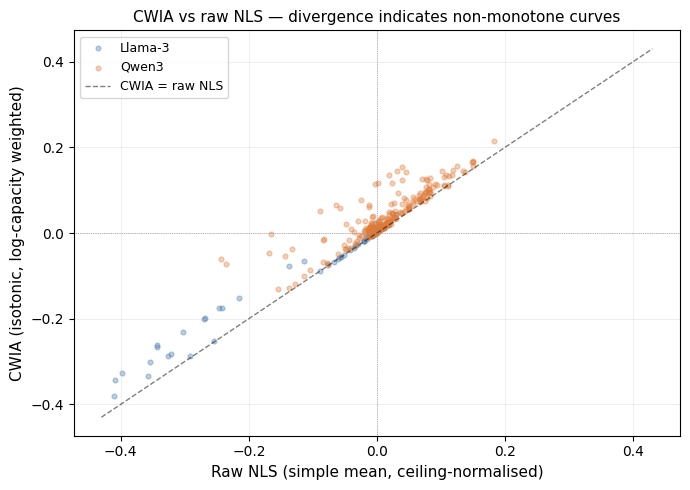

In [28]:
# ── N3: Diagnostic — CWIA vs raw NLS scatter ────────────────────────────────
# Shows where the two measures disagree most, i.e. where non-monotone curves
# inflate the old NLS relative to CWIA.

def plot_cwia_vs_raw_nls(
    cwia_df: pd.DataFrame,
    figsize=(7, 5),
    save_path: str = None,
):
    """
    Scatter plot of CWIA (y) vs raw NLS (x).  Points above the diagonal have
    monotone curves (CWIA >= raw NLS after ceiling normalisation).  Points
    below indicate non-monotone curves where the isotonic projection penalised
    the score.  Colour = family.
    """
    family_colors = {
        "Qwen3": "#E07B39", "Llama-3": "#4477AA",
        "Gemma3": "#228833", "Qwen3-VL": "#AA3377",
    }

    fig, ax = plt.subplots(figsize=figsize)

    for family, fdf in cwia_df.groupby("family"):
        ax.scatter(
            fdf["raw_nls"], fdf["cwia"],
            color=family_colors.get(family, "#888888"),
            alpha=0.35, s=12, label=family,
        )

    lim = max(abs(cwia_df["raw_nls"]).max(), abs(cwia_df["cwia"]).max()) * 1.05
    ax.plot([-lim, lim], [-lim, lim], "k--", linewidth=1, alpha=0.5,
            label="CWIA = raw NLS")
    ax.axhline(0, color="gray", linewidth=0.5, linestyle=":")
    ax.axvline(0, color="gray", linewidth=0.5, linestyle=":")

    ax.set_xlabel("Raw NLS (simple mean, ceiling-normalised)", fontsize=11)
    ax.set_ylabel("CWIA (isotonic, log-capacity weighted)", fontsize=11)
    ax.set_title("CWIA vs raw NLS — divergence indicates non-monotone curves",
                 fontsize=11)
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.2)
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_cwia_vs_raw_nls(cwia_df_mean)


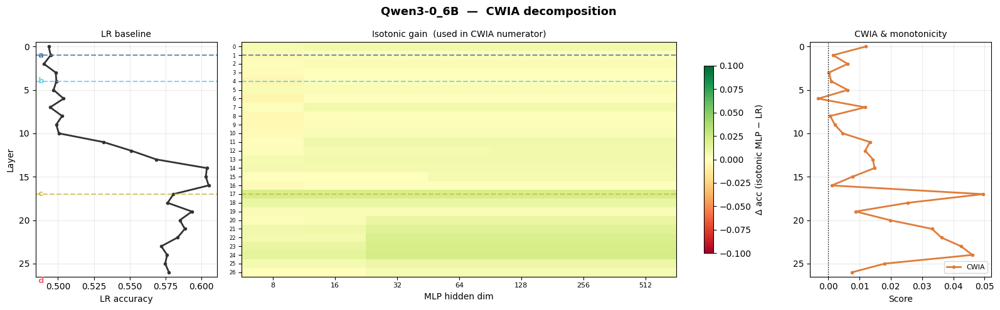

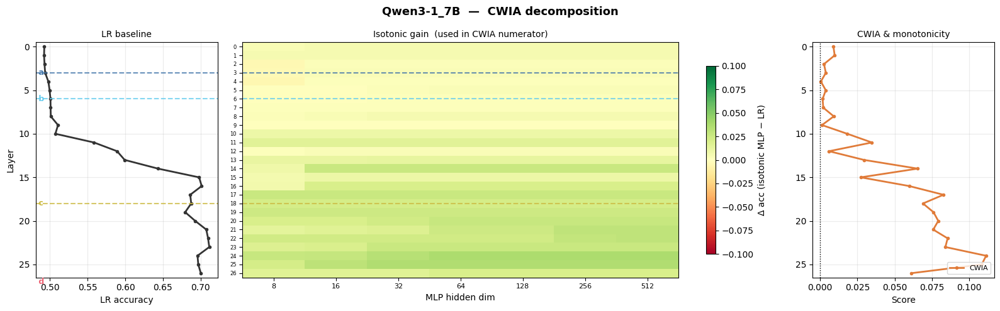

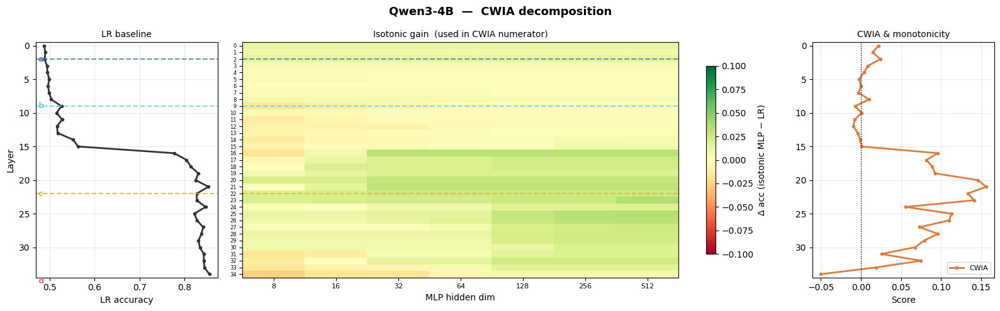

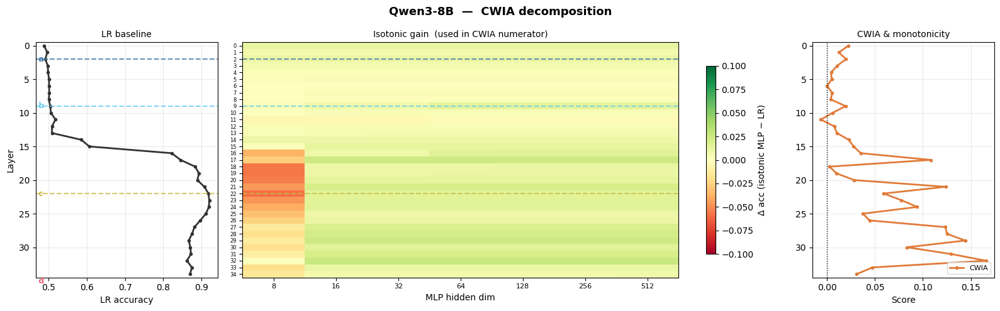

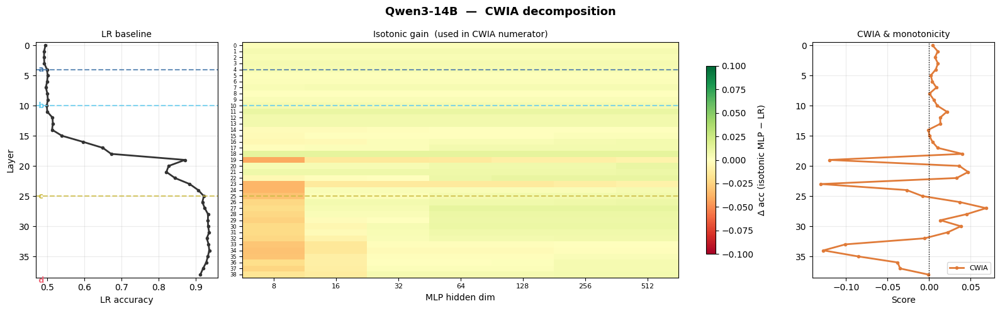

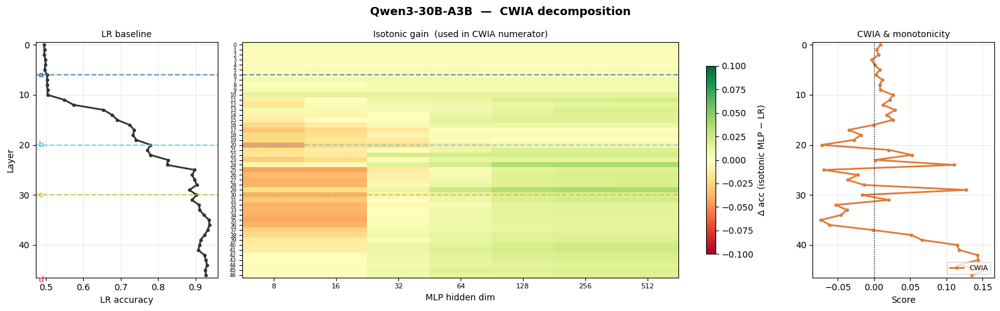

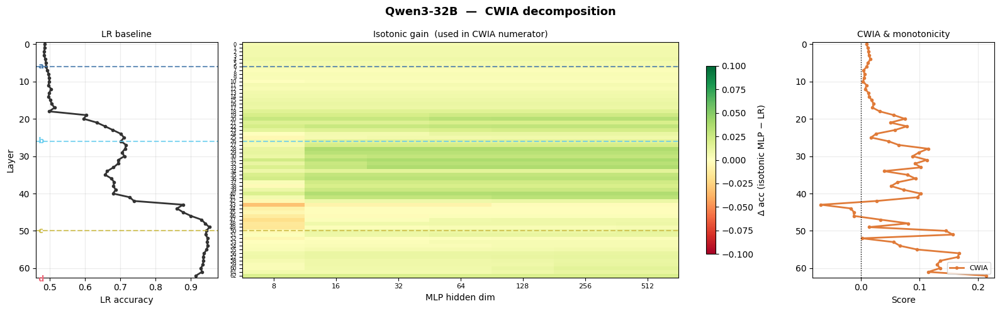

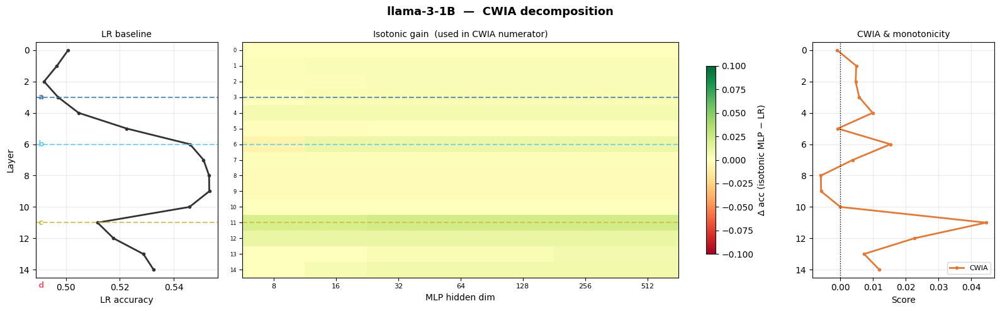

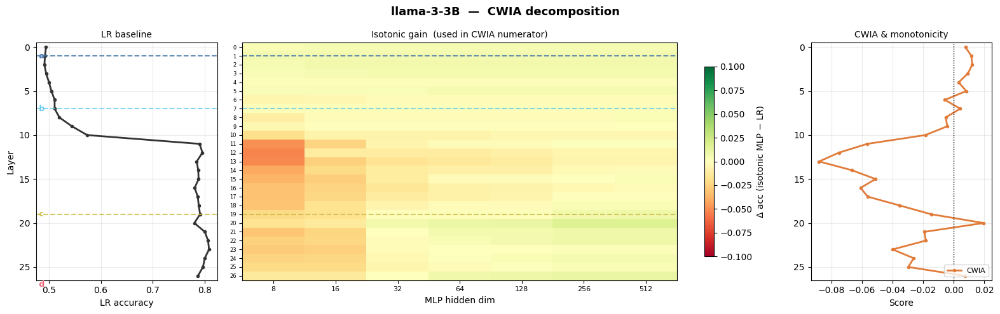

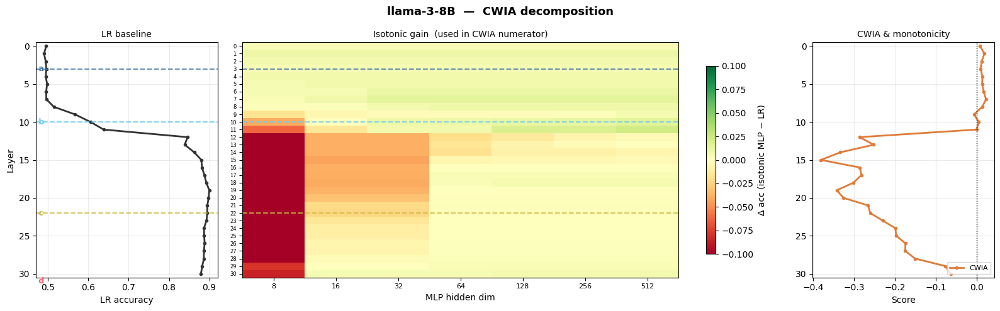

In [29]:
# ── N4: Updated per-model figure using CWIA ──────────────────────────────────
# Extends plot_layerwise_heatmap (Cell L2) but replaces the raw delta heatmap
# with three side-by-side panels:
#   (1) LR accuracy line         — absolute performance
#   (2) Isotonic gain heatmap    — CWIA numerator before ceiling division
#   (3) Monotonicity index line  — fraction of concordant pairs per layer

def plot_cwia_decomposition(
    ldf: pd.DataFrame,
    cwia_df: pd.DataFrame,
    model: str,
    hidden_dims: list = None,
    figsize=(16, 5),
    vmin_delta: float = -0.1,
    vmax_delta: float = +0.1,
    save_path: str = None,
):
    """
    Three-panel figure per model.

    Panel 1 (narrow)  : LR accuracy across layers + group annotations
    Panel 2 (wide)    : Isotonic gain heatmap (layers × hidden_dim)
    Panel 3 (narrow)  : Monotonicity index and CWIA per layer
    """
    mdf     = ldf[ldf["model"] == model].copy()
    cdf     = cwia_df[cwia_df["model"] == model].sort_values("layer")
    layers  = sorted(mdf["layer"].unique())
    #n_layers = int(mdf["n_layers"].iloc[0])

    if hidden_dims is None:
        hidden_dims = sorted(mdf[~mdf["is_linear"]]["hidden_dim"].unique())

    lr_mean = (
        mdf[mdf["probe"] == "LRProbe"]
        .groupby("layer")["accuracy"].mean()
        .reindex(layers)
    )

    # Isotonic gain matrix (layers × hidden_dim)
    iso_matrix = np.full((len(layers), len(hidden_dims)), np.nan)
    for row_i, lay in enumerate(layers):
        row = cdf[cdf["layer"] == lay]
        if row.empty:
            continue
        g_iso = row["g_iso"].iloc[0]
        # g_iso is stored as a list; match positions to hidden_dims
        lay_grp = mdf[(mdf["layer"] == lay) & (mdf["hidden_dim"] > 0)]
        hds_present = sorted(lay_grp["hidden_dim"].unique())
        for col_j, hd in enumerate(hidden_dims):
            if hd in hds_present:
                idx = hds_present.index(hd)
                if idx < len(g_iso):
                    iso_matrix[row_i, col_j] = g_iso[idx]

    group_layers, colors_g = {}, {
        "a": "#4477AA", "b": "#66CCEE", "c": "#CCBB44", "d": "#EE6677"
    }
    for g in ["a","b","c","d"]:
        try:
            group_layers[g] = get_layer(model, g)
        except Exception:
            pass

    fig, axes = plt.subplots(
        1, 3, figsize=figsize,
        gridspec_kw={"width_ratios": [1, 3, 1]},
    )
    ax_lr, ax_iso, ax_mono = axes

    # ── Panel 1: LR accuracy ──────────────────────────────────────────────────
    ax_lr.plot(lr_mean.values, layers, color="#333333", linewidth=2,
               marker="o", markersize=3)
    for g, gl in group_layers.items():
        ax_lr.axhline(gl, color=colors_g[g], linewidth=1.5, linestyle="--",
                      alpha=0.8)
        ax_lr.text(ax_lr.get_xlim()[0] if ax_lr.get_xlim()[0] != 0 else
                   lr_mean.min() * 0.99, gl, f" {g}", va="center",
                   color=colors_g[g], fontsize=9, fontweight="bold")
    ax_lr.set_xlabel("LR accuracy", fontsize=10)
    ax_lr.set_ylabel("Layer", fontsize=10)
    ax_lr.set_ylim(layers[0] - 0.5, layers[-1] + 0.5)
    ax_lr.invert_yaxis()
    ax_lr.grid(True, alpha=0.25)
    ax_lr.set_title("LR baseline", fontsize=10)

    # ── Panel 2: Isotonic gain heatmap ────────────────────────────────────────
    im = ax_iso.imshow(
        iso_matrix, aspect="auto", cmap="RdYlGn",
        vmin=vmin_delta, vmax=vmax_delta, interpolation="nearest",
    )
    ax_iso.set_xlabel("MLP hidden dim", fontsize=10)
    ax_iso.set_yticks(range(len(layers)))
    ax_iso.set_yticklabels(layers, fontsize=6)
    ax_iso.set_xticks(range(len(hidden_dims)))
    ax_iso.set_xticklabels(hidden_dims, fontsize=8)
    ax_iso.set_title("Isotonic gain  (used in CWIA numerator)", fontsize=10)
    for g, gl in group_layers.items():
        if gl in layers:
            ax_iso.axhline(layers.index(gl), color=colors_g[g],
                           linewidth=1.5, linestyle="--", alpha=0.8)
    plt.colorbar(im, ax=ax_iso, label="Δ acc (isotonic MLP − LR)", shrink=0.8)

    # ── Panel 3: CWIA and monotonicity index ─────────────────────────────────
    ax_mono.plot(
        cdf["cwia"].values, cdf["layer"].values,
        color="#E07B39", linewidth=2, marker="o", markersize=3, label="CWIA",
    )
    # ax_mono.plot(
    #     cdf["monotonicity_index"].values - 0.5, cdf["layer"].values,
    #     color="#4477AA", linewidth=1.5, linestyle="--", marker="s",
    #     markersize=3, label="Mono. idx − 0.5",
    # )
    ax_mono.axvline(0, color="black", linewidth=1, linestyle=":")
    ax_mono.set_xlabel("Score", fontsize=10)
    ax_mono.set_ylim(layers[0] - 0.5, layers[-1] + 0.5)
    ax_mono.invert_yaxis()
    ax_mono.grid(True, alpha=0.25)
    ax_mono.set_title("CWIA & monotonicity", fontsize=10)
    ax_mono.legend(fontsize=8, loc="lower right")

    fig.suptitle(f"{model}  —  CWIA decomposition", fontsize=13,
                 fontweight="bold")
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


ldf     = load_layerwise_results(medleys=medleys, val_datasets=val_datasets)
cwia_df_mean = compute_layerwise_cwia_mean(ldf)
for model in ALL_MODELS:
    plot_cwia_decomposition(ldf, cwia_df_mean, model)


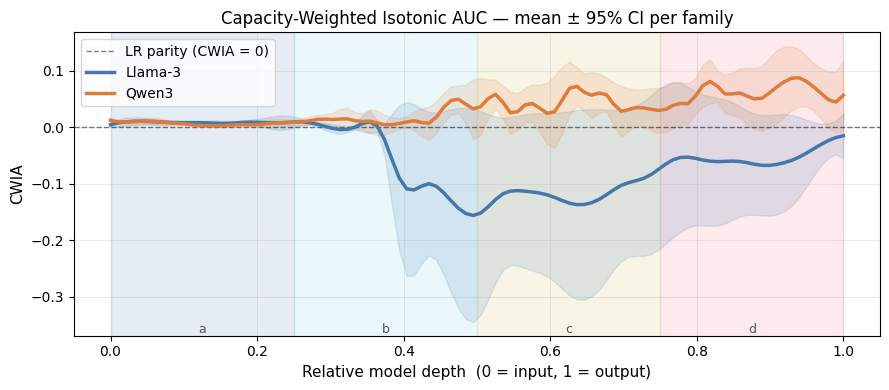

In [30]:
# ── N5: Family-level CWIA curves (relative depth) ───────────────────────────
# Drop-in replacement for plot_nls_by_relative_depth (Cell L5) using CWIA.

def plot_cwia_by_relative_depth(
    cwia_df: pd.DataFrame,
    families: list = None,
    n_interp: int = 100,
    figsize=(9, 4),
    save_path: str = None,
):
    from scipy.interpolate import interp1d

    if families is None:
        families = sorted(cwia_df["family"].unique())

    family_colors = {
        "Qwen3": "#E07B39", "Llama-3": "#4477AA",
        "Gemma3": "#228833", "Qwen3-VL": "#AA3377",
    }
    xs  = np.linspace(0, 1, n_interp)
    fig, ax = plt.subplots(figsize=figsize)
    ax.axhline(0, color="black", linewidth=1, linestyle="--", alpha=0.5,
               label="LR parity (CWIA = 0)")

    for family in families:
        fdf    = cwia_df[cwia_df["family"] == family]
        models = fdf["model"].unique()
        curves = []
        for model in models:
            mdf = fdf[fdf["model"] == model].sort_values("rel_depth")
            if len(mdf) < 3:
                continue
            f = interp1d(
                mdf["rel_depth"].values, mdf["cwia"].values,
                kind="cubic", bounds_error=False, fill_value="extrapolate",
            )
            curves.append(f(xs))

        if not curves:
            continue
        arr  = np.array(curves)
        mean = arr.mean(axis=0)
        sem  = arr.std(axis=0) / np.sqrt(len(arr))
        color = family_colors.get(family, "#888888")
        ax.plot(xs, mean, color=color, linewidth=2.5, label=family)
        ax.fill_between(xs, mean - 1.96*sem, mean + 1.96*sem,
                        color=color, alpha=0.15)

    group_spans  = {"a":(0.0,0.25),"b":(0.25,0.5),"c":(0.5,0.75),"d":(0.75,1.0)}
    group_colors = {"a":"#4477AA22","b":"#66CCEE22","c":"#CCBB4422","d":"#EE667722"}
    for g, (lo, hi) in group_spans.items():
        ax.axvspan(lo, hi, color=group_colors[g], zorder=0)
        ax.text((lo+hi)/2, ax.get_ylim()[0], g, ha="center", va="bottom",
                fontsize=9, color="#555555")

    ax.set_xlabel("Relative model depth  (0 = input, 1 = output)", fontsize=11)
    ax.set_ylabel("CWIA", fontsize=11)
    ax.set_title("Capacity-Weighted Isotonic AUC — mean ± 95% CI per family",
                 fontsize=12)
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.25)
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_cwia_by_relative_depth(cwia_df_mean)


In [ ]:
cwia_df.head(20)

,model,family,layer,n_layers,rel_depth,decile,cwia,raw_nls,g_raw,g_iso,weights,lr_acc,ceiling,max_iso_gain,saturation_dim,monotonicity_index,nls
0,Qwen1_5-1_8B,Qwen3,0,23,0.000000,0,0.057590,0.051837,"[0.03025314211845398, 0.025181925722530918, 0....","[0.03025314211845398, 0.03025314211845398, 0.0...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]",0.463911,0.536089,0.031338,8,0.571429,0.057590
1,Qwen1_5-1_8B,Qwen3,1,23,0.045455,0,0.017020,0.016016,"[0.003210091165133877, 0.00956935116222929, 0....","[0.003210091165133877, 0.00956935116222929, 0....","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]",0.484925,0.515075,0.009816,16,0.619048,0.017020
2,Qwen1_5-1_8B,Qwen3,2,23,0.090909,0,-0.016553,-0.018641,"[-0.016548799616949883, -0.007708770888192273,...","[-0.016548799616949883, -0.007708770888192273,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]",0.501718,0.498282,-0.005774,512,0.714286,-0.016553
3,Qwen1_5-1_8B,Qwen3,3,23,0.136364,1,-0.001624,-0.003429,"[-0.0020060837268829346, -0.001532035214560412...","[-0.0020060837268829346, -0.001532035214560412...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]",0.500155,0.499845,0.003513,512,0.714286,-0.001624
4,Qwen1_5-1_8B,Qwen3,4,23,0.181818,1,-0.002192,-0.005195,"[-0.007004367453711358, -0.0002400300332477956...","[-0.007004367453711358, -0.0002400300332477956...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]",0.492658,0.507342,0.000420,512,0.666667,-0.002192


In [34]:
for model, grp in cwia_df.groupby("model"):
    print(model)
    print(grp["cwia"].values)

Qwen1_5-1_8B
[ 0.05758994  0.01702012 -0.01655314 -0.0016242  -0.00219189 -0.01496909
  0.04265457  0.04005177 -0.02640554  0.01587354 -0.01248269 -0.0116641
  0.00102833  0.05260375  0.04111369  0.03284311  0.04913664  0.03336831
  0.07560764  0.06662106  0.09905422  0.08903523  0.09463525]
Qwen2-1_5B
[ 0.04479742  0.03708593  0.01246706  0.0260288   0.01989092 -0.0078261
  0.00540837  0.02185601  0.0105704   0.01283295  0.01840984  0.0254778
  0.02760166  0.00572199  0.0296276  -0.00965983  0.0118253   0.07332255
  0.04635419  0.07070845  0.05133559  0.03304971  0.04820822  0.09984137
  0.05816437  0.07849349  0.08088308]
Qwen2_5-1_5B
[ 0.0223333  -0.00867249  0.0070204   0.00228724 -0.02691294 -0.01132542
  0.00157291 -0.00768509 -0.0022206   0.01762115 -0.01919328  0.01394925
  0.01178569 -0.02058908  0.00340206  0.01069853  0.01335536 -0.02978437
  0.01391988 -0.05487107  0.01437543  0.03780046 -0.0065354   0.02717612
  0.03535833  0.08574797  0.06552864]
Qwen3-0_6B
[ 0.00993992  

In [31]:
# ── N6: Wilcoxon tests on CWIA (all three levels) ────────────────────────────
# CWIA is a layer-level scalar, so Wilcoxon now tests whether the distribution
# of CWIA values across layers is significantly positive (or negative).
# This is cleaner than the delta-based approach because each observation is
# already a summary of the full capacity curve at that layer.

from scipy.stats import wilcoxon as _wilcoxon_cwia

def _wilcoxon_result(values: np.ndarray, alternative="greater") -> dict:
    vals = np.asarray(values)
    #print(vals)
    vals = vals[~np.isnan(vals)]
    # print(vals)
    # print()
    if len(vals) < 6:
        return {"n": len(vals), "stat": np.nan, "p_value": np.nan,
                "median": float(np.median(vals)) if len(vals) else np.nan}
    try:
        stat, p = _wilcoxon_cwia(vals, alternative=alternative)
    except Exception:
        stat, p = np.nan, np.nan
    return {"n": len(vals), "stat": stat, "p_value": p,
            "median": float(np.median(vals))}


def cwia_wilcoxon_per_model(cwia_df: pd.DataFrame) -> pd.DataFrame:
    """Level 1: one test per model, H0: median CWIA = 0."""
    rows = []
    for model, grp in cwia_df.groupby("model"):
        result = _wilcoxon_result(grp["cwia"].values)
        rows.append({"model": model, "family": grp["family"].iloc[0], **result})
    return pd.DataFrame(rows).sort_values(["family","model"])


def cwia_wilcoxon_per_decile(cwia_df: pd.DataFrame) -> pd.DataFrame:
    """Level 2: one test per (family, decile), pools all models in family."""
    rows = []
    for (family, decile), grp in cwia_df.groupby(["family","decile"]):
        result = _wilcoxon_result(grp["cwia"].values)
        rows.append({"family": family, "decile": decile,
                     "rel_depth_mid": (decile+0.5)/10, **result})
    return pd.DataFrame(rows).sort_values(["family","decile"])


cw_model  = cwia_wilcoxon_per_model(cwia_df_all)
cw_decile = cwia_wilcoxon_per_decile(cwia_df_all)

print("=== CWIA Wilcoxon per model ===")
print(cw_model.to_string(index=False))
print("\n=== CWIA Wilcoxon per decile ===")
print(cw_decile.to_string(index=False))


=== CWIA Wilcoxon per model ===
        model  family    n      stat       p_value   median
   llama-3-1B Llama-3  630  139241.0  2.756902e-19 0.044226
   llama-3-3B Llama-3 1134  350811.5  6.421007e-09 0.024095
   llama-3-8B Llama-3 1302  371986.5  9.898896e-01 0.013771
   Qwen3-0_6B   Qwen3 1134  498696.0  2.328703e-62 0.050451
    Qwen3-14B   Qwen3 1638  642911.0  2.267039e-27 0.013736
   Qwen3-1_7B   Qwen3 1134  487958.0  1.512034e-66 0.064346
Qwen3-30B-A3B   Qwen3 1974 1003567.5  1.936421e-26 0.055342
    Qwen3-32B   Qwen3 2646 2374833.0 9.572641e-158 0.087222
     Qwen3-4B   Qwen3 1470  773342.5  1.309009e-67 0.066013
     Qwen3-8B   Qwen3 1470  637641.0  1.721869e-37 0.052632

=== CWIA Wilcoxon per decile ===
 family  decile  rel_depth_mid    n     stat      p_value    median
Llama-3       0           0.05  336  39201.0 4.885886e-10  0.032370
Llama-3       1           0.15  294  29996.0 2.792267e-09  0.023747
Llama-3       2           0.25  294  28138.5 4.819026e-06  0.052406
Ll

In [32]:
cw_decile.head()

,family,decile,rel_depth_mid,n,stat,p_value,median
0,Llama-3,0,0.05,336,39201.0,4.885886e-10,0.032370
1,Llama-3,1,0.15,294,29996.0,2.792267e-09,0.023747
2,Llama-3,2,0.25,294,28138.5,4.819026e-06,0.052406
3,Llama-3,3,0.35,294,23529.0,3.499608e-02,0.030283
4,Llama-3,4,0.45,252,10462.0,9.998977e-01,-0.012473


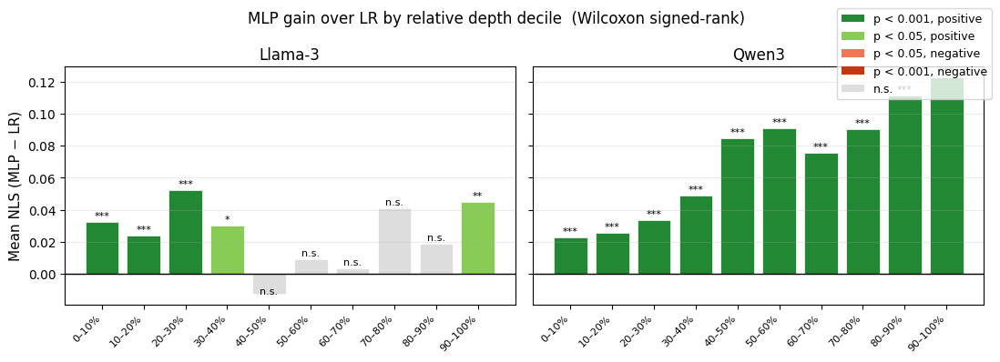

In [33]:
# ── L8: Visualise significance across relative depth (Level 2) ───────────────
# Bar chart of mean_diff per decile, coloured by significance level,
# one subplot per family.  Makes the "non-linearity emerges progressively"
# narrative immediately visible.

def plot_decile_significance(
    w_decile: pd.DataFrame,
    alpha: float = 0.05,
    figsize=(11, 4),
    save_path: str = None,
):
    families = sorted(w_decile["family"].unique())
    fig, axes = plt.subplots(1, len(families), figsize=figsize, sharey=True)
    if len(families) == 1:
        axes = [axes]

    decile_labels = [f"{d*10}–{d*10+10}%" for d in range(10)]

    for ax, family in zip(axes, families):
        fdf = (
            w_decile[w_decile["family"] == family]
            .sort_values("decile")
            .set_index("decile")
            .reindex(range(10))
        )

        mean_diffs = fdf["median"].fillna(0).values
        p_vals     = fdf["p_value"].values

        # Color bars by significance
        bar_colors = []
        for p, d in zip(p_vals, mean_diffs):
            if np.isnan(p):
                bar_colors.append("#BBBBBB")
            elif p < 0.001:
                bar_colors.append("#228833" if d > 0 else "#CC3311")
            elif p < alpha:
                bar_colors.append("#88CC55" if d > 0 else "#EE7755")
            else:
                bar_colors.append("#DDDDDD")

        bars = ax.bar(range(10), mean_diffs, color=bar_colors, edgecolor="white",
                      linewidth=0.5, width=0.8)
        ax.axhline(0, color="black", linewidth=1)

        # Annotate p-values
        for i, (bar, p) in enumerate(zip(bars, p_vals)):
            if not np.isnan(p):
                sig = "***" if p < 0.001 else ("**" if p < 0.01
                        else ("*" if p < alpha else "n.s."))
                ax.text(bar.get_x() + bar.get_width() / 2,
                        bar.get_height() + 0.001 * np.sign(bar.get_height()),
                        sig, ha="center", va="bottom", fontsize=8)

        ax.set_xticks(range(10))
        ax.set_xticklabels(decile_labels, rotation=45, ha="right", fontsize=8)
        ax.set_title(family, fontsize=12)
        ax.grid(True, axis="y", alpha=0.25)

    axes[0].set_ylabel("Mean NLS (MLP − LR)", fontsize=11)

    # Legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor="#228833", label="p < 0.001, positive"),
        Patch(facecolor="#88CC55", label=f"p < {alpha}, positive"),
        Patch(facecolor="#EE7755", label=f"p < {alpha}, negative"),
        Patch(facecolor="#CC3311", label="p < 0.001, negative"),
        Patch(facecolor="#DDDDDD", label="n.s."),
    ]
    fig.legend(handles=legend_elements, loc="upper right",
               fontsize=9, frameon=True, bbox_to_anchor=(1.0, 1.0))

    fig.suptitle("MLP gain over LR by relative depth decile  (Wilcoxon signed-rank)",
                 fontsize=12)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_decile_significance(cw_decile) #save_path="figures/wilcoxon_decile_significance.pdf"

In [ ]:
# ── N7: End-to-end CWIA analysis ─────────────────────────────────────────────

def run_cwia_analysis(
    results_file=LAYERWISE_FILE,
    figures_dir: str = "figures",
    families: list = None,
):
    """
    Full CWIA pipeline: load → compute → test → visualise → table.
    """
    import pathlib
    pathlib.Path(figures_dir).mkdir(parents=True, exist_ok=True)

    print("Loading results...")
    ldf = load_layerwise_results(results_file)
    if families:
        ldf = ldf[ldf["family"].isin(families)]

    print("Computing CWIA...")
    cwia_df = compute_layerwise_cwia(ldf)

    print("Running Wilcoxon tests on CWIA...")
    cw_model  = cwia_wilcoxon_per_model(cwia_df)
    cw_decile = cwia_wilcoxon_per_decile(cwia_df)
    cw_group  = cwia_wilcoxon_per_group(cwia_df)

    print("\n=== Level 1: per model ===")
    print(cw_model.to_string(index=False))
    print("\n=== Level 2: per decile ===")
    print(cw_decile.to_string(index=False))
    print("\n=== Level 3: per group ===")
    print(cw_group.to_string(index=False))

    print("\nGenerating figures...")
    plot_cwia_vs_raw_nls(cwia_df,
        save_path=f"{figures_dir}/cwia_vs_raw_nls.pdf")
    plot_cwia_by_relative_depth(cwia_df,
        save_path=f"{figures_dir}/cwia_relative_depth.pdf")
    plot_decile_significance(cw_decile,
        save_path=f"{figures_dir}/cwia_decile_significance.pdf")
    for fam in cwia_df["family"].unique():
        for model in cwia_df[cwia_df["family"]==fam]["model"].unique():
            plot_cwia_decomposition(ldf, cwia_df, model,
                save_path=f"{figures_dir}/cwia_{model.replace('/','_')}.pdf")

    return ldf, cwia_df, cw_model, cw_decile, cw_group


# ldf, cwia_df, cw_model, cw_decile, cw_group = run_cwia_analysis()


---
## Revised Non-Linearity Score: $(G, \mathcal{C})$ framework

The simple mean NLS weights all hidden dims equally. This section replaces it
with a two-dimensional characterisation:

- **$G = \tilde{\Delta}(h_K)$** — asymptotic gain (magnitude of non-linearity).
  The accuracy improvement available at maximum MLP capacity, computed on the
  isotonic (monotone) envelope of the raw delta curve.

- **$\mathcal{C}$** — Complexity AUC. The area under the normalised capacity-gain
  curve plotted on a log-capacity x-axis.  High $\mathcal{C} \to 1$: gain is
  captured by small MLPs (mild non-linearity).  Low $\mathcal{C} \to 0$: only large
  MLPs help (complex non-linearity).

  Formally: $\mathcal{C} = \int_0^1 y(x)\,dx$ where
  $x = (\log_2 h - \log_2 h_{\min})/(\log_2 h_{\max} - \log_2 h_{\min})$ and
  $y = \tilde{\Delta}(h)/G$.

  The Gini complexity coefficient is $\text{Gini} = 1 - 2\mathcal{C}$.

The old `compute_nls` / `compute_layerwise_nls` functions are superseded by
`compute_gc` below, which returns both dimensions.

In [20]:
# ── N1: Core (G, C) computation ──────────────────────────────────────────────

from scipy.stats import wilcoxon as _wilcoxon_sc

def _isotonic_envelope(values: np.ndarray) -> np.ndarray:
    """
    Non-decreasing isotonic envelope via the Pool Adjacent Violators algorithm.
    For each position k, returns max(values[:k+1]).
    """
    # iso = IsotonicRegression(increasing=True, out_of_bounds="clip")
    # g_iso = iso.fit_transform(np.arange(len(values), dtype=float), values)
    # print(f"Values: {values}")
    # print(f"g_iso: {g_iso}")
    # return g_iso
    out = np.empty_like(values)
    running_max = -np.inf
    for i, v in enumerate(values):
        running_max = max(running_max, v)
        out[i] = running_max
    return out


def _complexity_auc(
    x: np.ndarray,      # normalised log-capacity ∈ [0,1], sorted ascending
    y: np.ndarray,      # normalised gain ∈ [0,1], non-decreasing
) -> float:
    """
    Trapezoidal AUC of the (x, y) capacity-gain curve.

    Returns a value in [0, 1]:
      → 1  : gain is fully present even at minimum capacity (mildly non-linear)
      → 0  : gain only emerges at maximum capacity (complexly non-linear)
    """
    return float(np.trapezoid(y, x))


def compute_gc(
    df: pd.DataFrame,
    groupby: list = None,
) -> pd.DataFrame:
    """
    Compute (G, C) for every (model, layer [or layer_group], val_dataset, medley)
    combination, averaged over val_datasets and medleys as specified.

    Parameters
    ----------
    df       : results DataFrame from load_results() or load_layerwise_results().
               Must have columns: model, family, layer (or layer_group),
               hidden_dim, probe, accuracy.
    groupby  : grouping columns (default: ["model","family","layer"]).
               Use ["model","family","layer_group"] for group-level analysis.

    Returns
    -------
    DataFrame with one row per group, columns:
      G             : asymptotic gain  Δ̃(h_max)
      C             : complexity AUC   ∫ ỹ dx
      gini          : 1 − 2C
      lr_acc        : mean LR accuracy (baseline)
      n_hidden_dims : number of MLP capacity levels used
      hd_min / hd_max : min/max hidden dim seen
      G_raw         : mean of raw (non-isotonic) deltas [old NLS, for comparison]
    """
    if groupby is None:
        layer_col = "layer" if "layer" in df.columns else "layer_group"
        groupby = ["model", "family", layer_col]

    records = []

    # LR baseline index
    lr_idx = (
        df[df["probe"] == "LRProbe"]
        .groupby(groupby + ["val_dataset", "medley"])["accuracy"]
        .mean()
    )

    # MLP groups
    mlp_df = df[df["hidden_dim"] > 0].copy()

    for keys, grp in mlp_df.groupby(groupby):
        key_dict = dict(zip(groupby, keys if isinstance(keys, tuple) else [keys]))

        # Mean accuracy per hidden_dim (averaged over val_datasets & medleys)
        hd_means = (
            grp.groupby("hidden_dim")["accuracy"].mean()
            .sort_index()
        )
        hidden_dims = hd_means.index.values.astype(float)

        # LR baseline: mean over matching val_datasets & medleys
        lr_keys = [key_dict.get(c) for c in groupby]
        try:
            # Attempt exact match with all matching val/medley entries
            lr_sub = lr_idx[tuple(lr_keys)]
            # lr_sub might be a Series (multiple val/medley) or scalar
            if hasattr(lr_sub, "mean"):
                lr_acc = float(lr_sub.mean())
            else:
                lr_acc = float(lr_sub)
        except KeyError:
            # Fall back: match on model + layer only
            lr_acc_all = df[
                (df["probe"] == "LRProbe") &
                np.all([df[c] == key_dict[c] for c in groupby if c in df.columns],
                       axis=0)
            ]["accuracy"]
            if lr_acc_all.empty:
                continue
            lr_acc = float(lr_acc_all.mean())

        raw_deltas = hd_means.values - lr_acc

        # ── Isotonic envelope ────────────────────────────────────────────────
        iso_deltas = _isotonic_envelope(raw_deltas)

        # ── G: asymptotic gain ───────────────────────────────────────────────
        G = float(iso_deltas[-1])

        # ── Normalised log-capacity x ────────────────────────────────────────
        log_hd   = np.log2(hidden_dims)
        x_norm   = (log_hd - log_hd[0]) / (log_hd[-1] - log_hd[0])

        # ── Complexity AUC C ─────────────────────────────────────────────────
        if G > 1e-6:
            y_norm = np.clip(iso_deltas / G, 0, 1)
        else:
            # G ≈ 0: representation is essentially linear; C is undefined.
            # Set C = 1.0 (trivially captured, i.e. no complexity needed)
            # and flag via G ≈ 0.
            y_norm = np.ones_like(iso_deltas)

        C    = _complexity_auc(x_norm, y_norm)
        gini = 1.0 - 2.0 * C

        records.append({
            **key_dict,
            "G":             G,
            "C":             C,
            "gini":          gini,
            "lr_acc":        lr_acc,
            "n_hidden_dims": len(hidden_dims),
            "hd_min":        int(hidden_dims[0]),
            "hd_max":        int(hidden_dims[-1]),
            "G_raw":         float(raw_deltas.mean()),  # old NLS for comparison
        })

    return pd.DataFrame(records)


# ── Quick sanity check (runs without data, just tests the math) ──────────────
def _sanity_check_gc():
    # Layer A: uniform gain c=0.03 → G=0.03, C=1.0, Gini=−1 (mild)
    # Layer B: gain only at last h  → G=0.21, C≈0,  Gini≈1  (complex)
    hd   = np.array([8., 16., 32., 64., 128., 256., 512.])
    log_hd = np.log2(hd)
    x    = (log_hd - log_hd[0]) / (log_hd[-1] - log_hd[0])

    delta_A = np.full(7, 0.03)
    delta_B = np.array([0.]*6 + [0.21])

    iso_A, iso_B = _isotonic_envelope(delta_A), _isotonic_envelope(delta_B)

    G_A, G_B   = iso_A[-1], iso_B[-1]
    C_A = _complexity_auc(x, iso_A / G_A)
    C_B = _complexity_auc(x, iso_B / G_B)

    assert abs(G_A - 0.03) < 1e-9,   f"G_A wrong: {G_A}"
    assert abs(G_B - 0.21) < 1e-9,   f"G_B wrong: {G_B}"
    assert abs(C_A - 1.0)  < 1e-6,   f"C_A should be 1, got {C_A:.4f}"
    assert C_B < 0.1,                  f"C_B should be near 0, got {C_B:.4f}"
    assert C_A > C_B,                  "Layer A should have higher C (milder) than B"

    print("Sanity check passed:")
    print(f"  Layer A  G={G_A:.3f}  C={C_A:.3f}  Gini={1-2*C_A:.3f}  [mild, uniform gain]")
    print(f"  Layer B  G={G_B:.3f}  C={C_B:.3f}  Gini={1-2*C_B:.3f}  [complex, gain only at h=512]")
    print(f"  Old NLS (mean delta): A={delta_A.mean():.3f}  B={delta_B.mean():.3f}  [identical — the failure mode]")

_sanity_check_gc()


Sanity check passed:
  Layer A  G=0.030  C=1.000  Gini=-1.000  [mild, uniform gain]
  Layer B  G=0.210  C=0.083  Gini=0.833  [complex, gain only at h=512]
  Old NLS (mean delta): A=0.030  B=0.030  [identical — the failure mode]


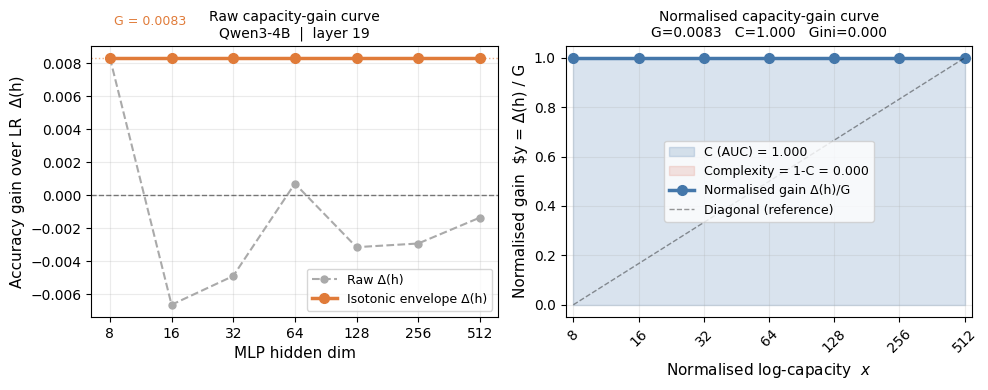

{'G': np.float64(0.008332716567175713),
 'C': 1.0,
 'gini': 0.0,
 'lr_acc': np.float64(0.6340098423617226)}

In [21]:
# ── N2: Capacity-gain curve visualisation (normalised and raw) ───────────────
# For a single (model, layer), show:
#   Left  — raw delta curve with isotonic envelope overlay
#   Right — normalised (x, y) curve with C shaded, Gini annotated

def plot_capacity_gain_curve(
    df: pd.DataFrame,
    model: str,
    layer,                          # int (absolute) or str (group label)
    val_datasets_filter: list = None,
    medley_filter: str = None,
    figsize=(10, 4),
    save_path: str = None,
):
    """
    Diagnostic plot for a single (model, layer) showing the raw and normalised
    capacity-gain curves.  Useful for inspecting individual layers.
    """
    layer_col = "layer_group" if isinstance(layer, str) else "layer"
    mdf = df[(df["model"] == model) & (df[layer_col] == layer)].copy()
    if val_datasets_filter:
        mdf = mdf[mdf["val_dataset"].isin(val_datasets_filter)]
    if medley_filter:
        mdf = mdf[mdf["medley"] == medley_filter]

    lr_acc = mdf[mdf["probe"] == "LRProbe"]["accuracy"].mean()
    hd_means = (
        mdf[mdf["hidden_dim"] > 0]
        .groupby("hidden_dim")["accuracy"].mean()
        .sort_index()
    )
    hidden_dims = hd_means.index.values.astype(float)
    raw_delta   = hd_means.values - lr_acc
    iso_delta   = _isotonic_envelope(raw_delta)

    log_hd = np.log2(hidden_dims)
    x_norm = (log_hd - log_hd[0]) / (log_hd[-1] - log_hd[0])
    G      = iso_delta[-1]
    y_norm = np.clip(iso_delta / G, 0, 1) if G > 1e-6 else np.zeros_like(iso_delta)
    C      = _complexity_auc(x_norm, y_norm)
    gini   = 1 - C

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # ── Left: raw delta ───────────────────────────────────────────────────────
    ax1.axhline(0, color="black", linewidth=1, linestyle="--", alpha=0.5)
    ax1.plot(log_hd, raw_delta, "o--", color="#AAAAAA", linewidth=1.5,
             markersize=5, label="Raw Δ(h)")
    ax1.plot(log_hd, iso_delta, "o-",  color="#E07B39", linewidth=2.5,
             markersize=7, label="Isotonic envelope Δ(h)")
    ax1.axhline(G, color="#E07B39", linewidth=1, linestyle=":", alpha=0.6)
    ax1.text(log_hd[0], G + 0.002, f" G = {G:.4f}", color="#E07B39", fontsize=9)

    ax1.set_xticks(log_hd)
    ax1.set_xticklabels([int(h) for h in hidden_dims])
    ax1.set_xlabel("MLP hidden dim", fontsize=11)
    ax1.set_ylabel("Accuracy gain over LR  Δ(h)", fontsize=11)
    ax1.set_title(f"Raw capacity-gain curve\n{model}  |  layer {layer}", fontsize=10)
    ax1.legend(fontsize=9)
    ax1.grid(True, alpha=0.25)

    # ── Right: normalised curve with C shaded ────────────────────────────────
    ax2.fill_between(x_norm, y_norm, alpha=0.20, color="#4477AA",
                     label=f"C (AUC) = {C:.3f}")
    ax2.fill_between(x_norm, y_norm, 1.0, alpha=0.12, color="#CC3311",
                     label=f"Complexity = 1-C = {1-C:.3f}")
    ax2.plot(x_norm, y_norm, "o-", color="#4477AA", linewidth=2.5, markersize=7,
             label=f"Normalised gain Δ(h)/G")
    ax2.plot([0, 1], [0, 1], "k--", linewidth=1, alpha=0.4, label="Diagonal (reference)")

    ax2.set_xticks(x_norm)
    ax2.set_xticklabels([int(h) for h in hidden_dims], rotation=45)
    ax2.set_xlabel("Normalised log-capacity  $x$", fontsize=11)
    ax2.set_ylabel("Normalised gain  $y = Δ(h) / G", fontsize=11)
    ax2.set_title(
        f"Normalised capacity-gain curve\n"
        f"G={G:.4f}   C={C:.3f}   Gini={gini:.3f}",
        fontsize=10,
    )
    ax2.legend(fontsize=9)
    ax2.set_xlim(-0.02, 1.02)
    ax2.set_ylim(-0.05, 1.05)
    ax2.grid(True, alpha=0.25)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()
    return {"G": G, "C": C, "gini": gini, "lr_acc": lr_acc}


plot_capacity_gain_curve(ldf, "Qwen3-4B", 19)
# plot_capacity_gain_curve(df, "gemma-3-4b-it", "c")


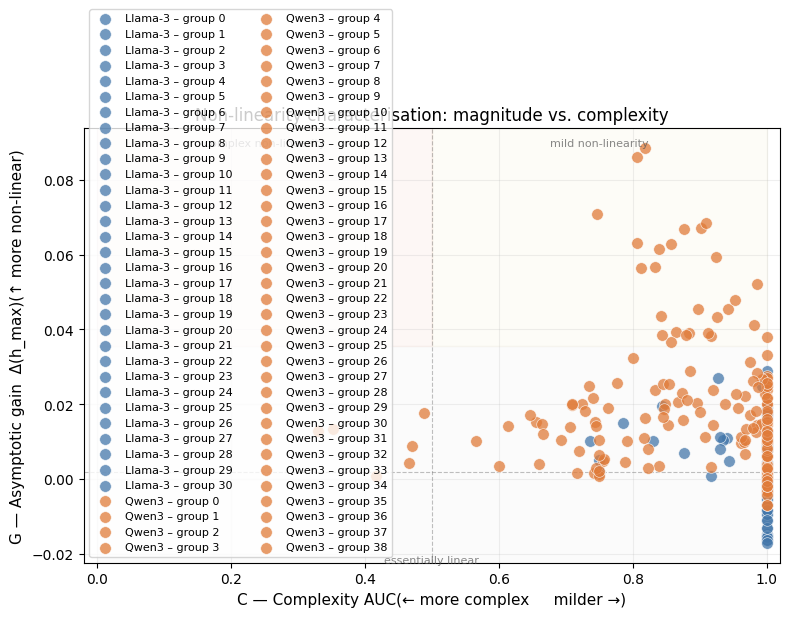

In [22]:
# ── N3: G–C scatter plot (the main characterisation figure) ─────────────────
# Each point is a (model, layer_group) pair.
# x-axis: C (complexity AUC, higher = simpler/milder)
# y-axis: G (asymptotic gain, higher = more non-linear)
# Colour: family.  Marker: layer group.
# The bottom-right quadrant (high G, low C) = strongly and complexly non-linear.

def plot_gc_scatter(
    gc_df: pd.DataFrame,
    figsize=(8, 6),
    save_path: str = None,
):
    """
    G–C scatter: each point is a (model, layer_group) with G > threshold.

    Quadrant interpretation:
      Top-right   (G↑, C↑) : large gain, captured by small MLP  — mild but real
      Top-left    (G↑, C↓) : large gain, requires large MLP     — complex non-linearity
      Bottom-right(G↓, C↑) : small gain, small MLP sufficient   — essentially linear
      Bottom-left (G↓, C↓) : small gain, large MLP needed       — noise / artefact
    """
    family_colors = {
        "Qwen3":   "#E07B39",
        "Llama-3": "#4477AA",
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }
    group_markers = {"a": "o", "b": "s", "c": "^", "d": "D"}

    fig, ax = plt.subplots(figsize=figsize)

    # Quadrant shading
    ax.axvspan(0.0, 0.5, ymin=0.5, ymax=1.0, alpha=0.04, color="#CC3311")   # top-left
    ax.axvspan(0.5, 1.0, ymin=0.5, ymax=1.0, alpha=0.04, color="#CCBB44")   # top-right
    ax.axvspan(0.0, 1.0, ymin=0.0, ymax=0.5, alpha=0.04, color="#AAAAAA")   # bottom

    ax.axvline(0.5, color="gray", linewidth=0.8, linestyle="--", alpha=0.5)
    ax.axhline(gc_df["G"].quantile(0.25), color="gray", linewidth=0.8,
               linestyle="--", alpha=0.5)

    for (family, group), grp in gc_df.groupby(
        ["family", "layer_group"] if "layer_group" in gc_df.columns else ["family"]
    ):
        color  = family_colors.get(family, "#888888")
        marker = group_markers.get(group, "o") if "layer_group" in gc_df.columns else "o"
        ax.scatter(
            grp["C"], grp["G"],
            c=color, marker=marker, s=70, alpha=0.75, edgecolors="white",
            linewidths=0.5, label=f"{family} – group {group}",
            zorder=3,
        )

    # Quadrant labels
    ylim = ax.get_ylim()
    xlim = ax.get_xlim()
    kw = dict(fontsize=8, color="#555555", alpha=0.7)
    ax.text(0.25, ylim[1]*0.97, "complex non-linearity", ha="center", va="top", **kw)
    ax.text(0.75, ylim[1]*0.97, "mild non-linearity", ha="center", va="top", **kw)
    ax.text(0.5,  ylim[0]*1.03, "essentially linear", ha="center", va="bottom", **kw)

    ax.set_xlabel(
        "C — Complexity AUC"
        "(← more complex     milder →)",
        fontsize=11,
    )
    ax.set_ylabel(
        "G — Asymptotic gain  Δ(h_max)"
        "(↑ more non-linear)",
        fontsize=11,
    )
    ax.set_title("Non-linearity characterisation: magnitude vs. complexity",
                 fontsize=12)
    ax.legend(fontsize=8, ncol=2, loc="lower left")
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.02, 1.02)

    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


gc_group = compute_gc(ldf, groupby=["model","family","layer_group"])
plot_gc_scatter(gc_group, save_path="figures/gc_scatter.pdf")


<>:108: SyntaxWarning: invalid escape sequence '\m'
<>:114: SyntaxWarning: invalid escape sequence '\m'
<>:108: SyntaxWarning: invalid escape sequence '\m'
<>:114: SyntaxWarning: invalid escape sequence '\m'
/var/folders/md/2vgg7gfx5d91wf0z6x5m43nc0000gn/T/ipykernel_2857/2814196838.py:108: SyntaxWarning: invalid escape sequence '\m'
  plt.colorbar(im_C, ax=ax_C, shrink=0.8, label="$\mathcal{C}$")
/var/folders/md/2vgg7gfx5d91wf0z6x5m43nc0000gn/T/ipykernel_2857/2814196838.py:114: SyntaxWarning: invalid escape sequence '\m'
  fig.suptitle(f"{model}  —  $(G, \mathcal{{C}})$ across all layers",


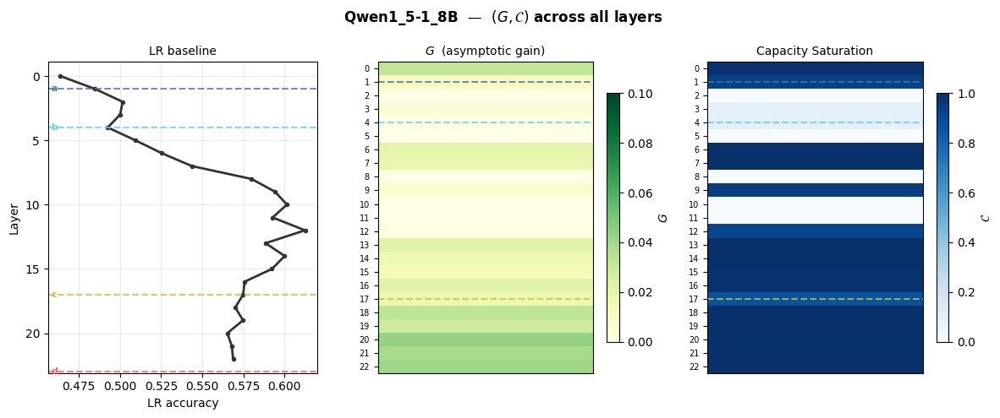

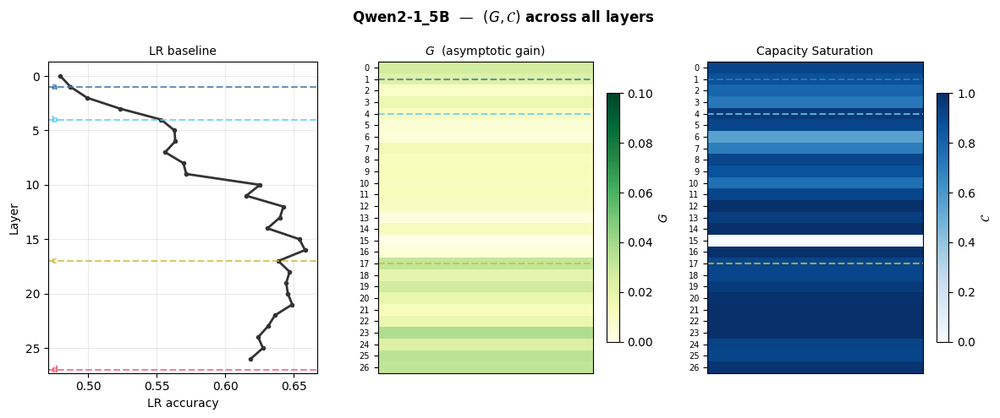

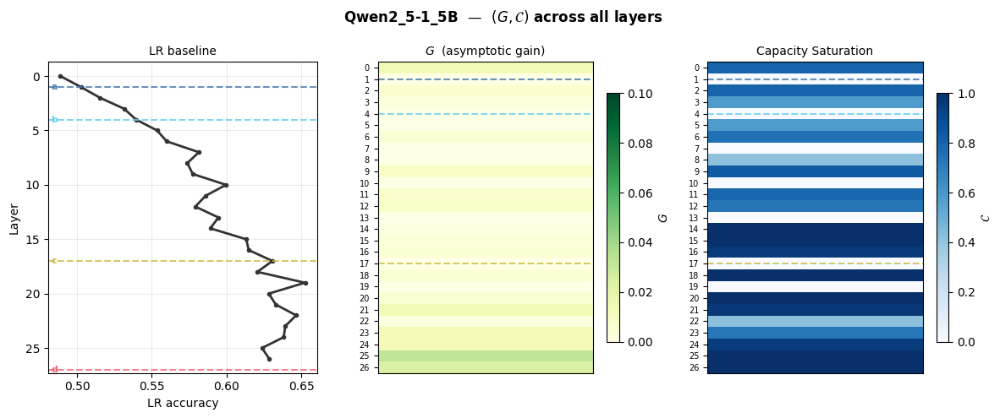

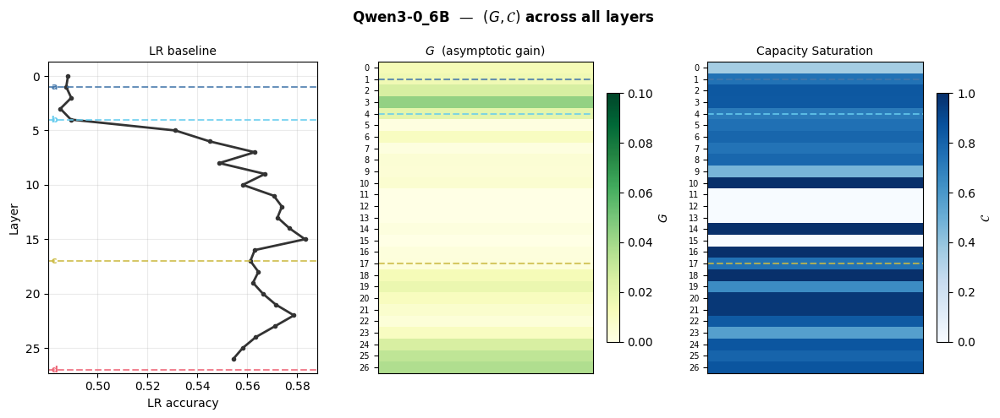

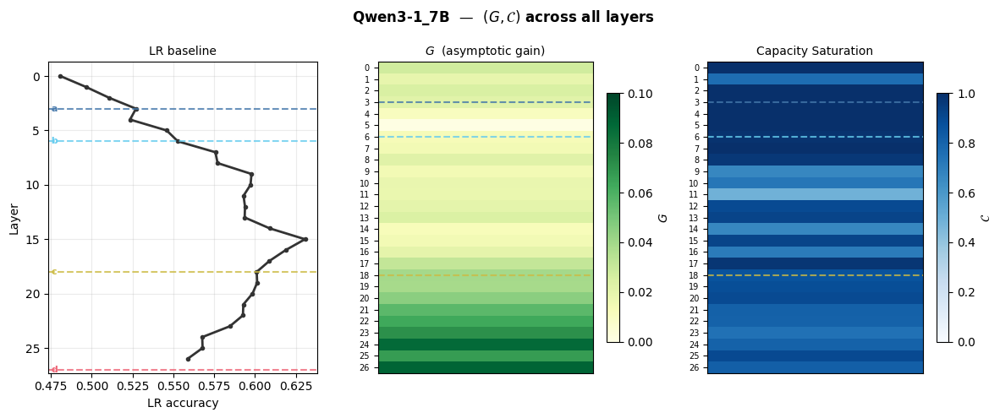

...

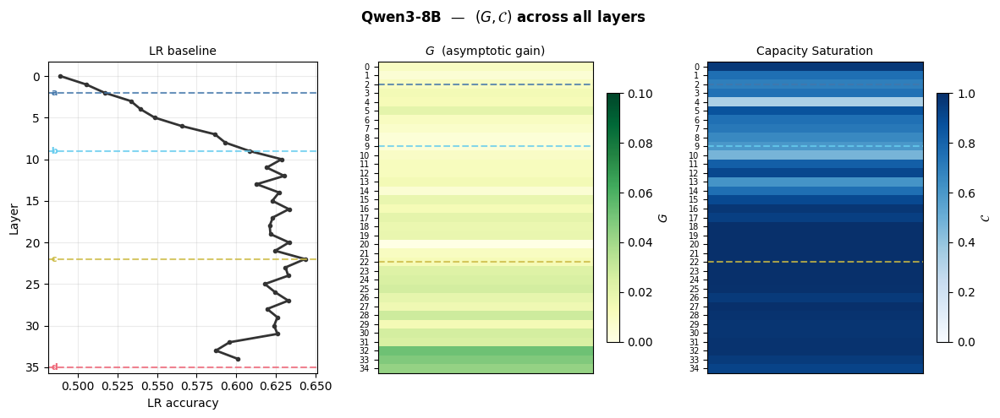

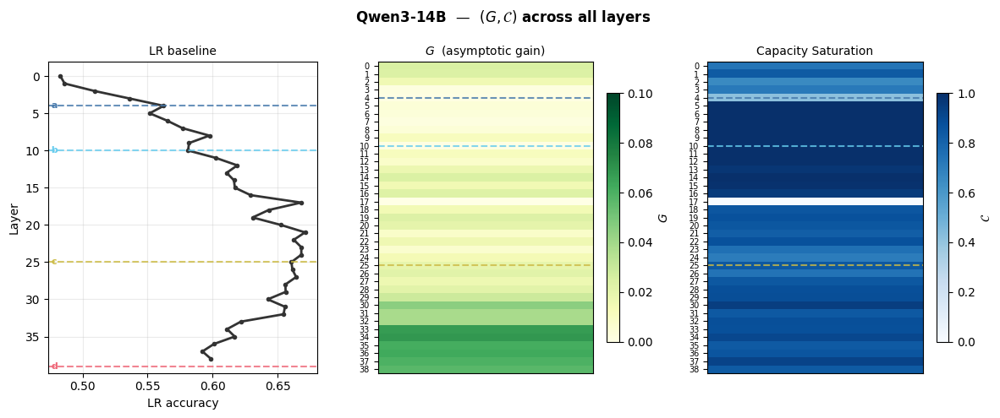

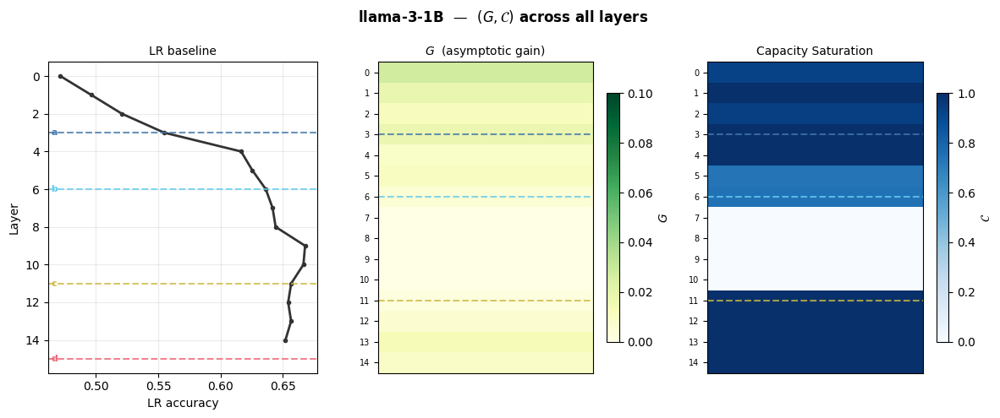

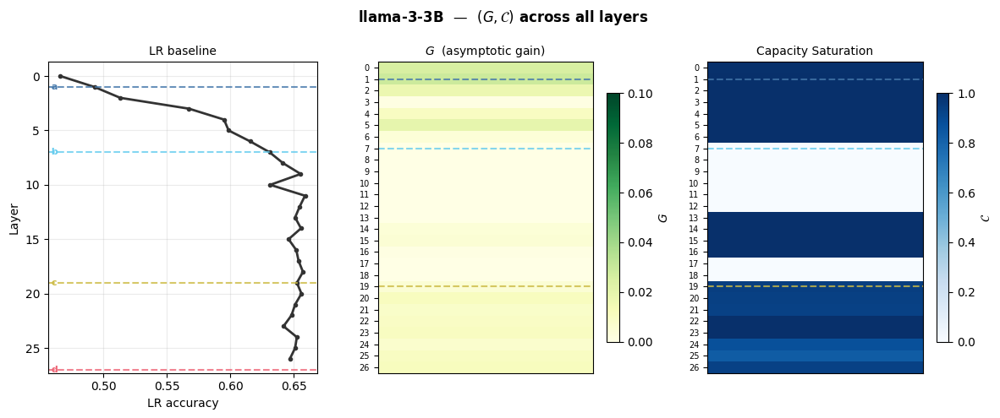

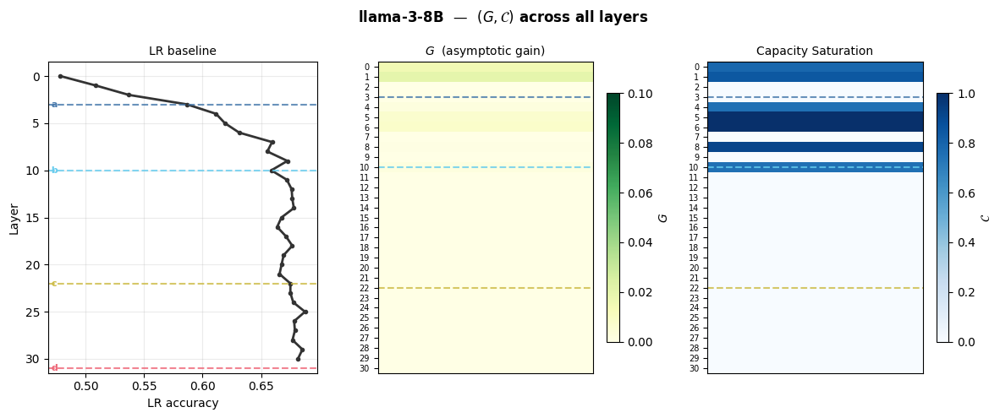

In [28]:
# ── N4: G and C side-by-side heatmaps across all layers (full-layer data) ────
# Two-panel per model: left = G heatmap (layers × hidden_dim aggregated),
# right = C heatmap.  Diverging colormap for C (centred at 0.5).

def plot_gc_heatmaps(
    ldf: pd.DataFrame,
    model: str,
    figsize=(12, 5),
    save_path: str = None,
):
    """
    For a single model, compute (G, C) at every layer and plot as a
    two-panel heatmap: G (magnitude) and C (complexity) vs layer depth.
    This is the full-layer analogue of the G-C scatter.
    """
    mdf   = ldf[ldf["model"] == model]
    layers = sorted(mdf["layer"].unique())

    G_vals, C_vals, lr_vals, gini_vals = [], [], [], []

    for layer in layers:
        lsub = mdf[mdf["layer"] == layer]
        lr_acc = lsub[lsub["probe"] == "LRProbe"]["accuracy"].mean()
        #print(lsub[lsub["probe"] == "LRProbe"]["accuracy"])
        #print(lsub[lsub["probe"] == "LRProbe"]["accuracy"].mean())
        #print()
        hd_means = (
            lsub[lsub["hidden_dim"] > 0]
            .groupby("hidden_dim")["accuracy"].mean()
            .sort_index()
        )
        if hd_means.empty or np.isnan(lr_acc):
            G_vals.append(np.nan); C_vals.append(np.nan); lr_vals.append(lr_acc)
            continue

        hidden_dims = hd_means.index.values.astype(float)
        raw_delta   = hd_means.values - lr_acc
        #print(hd_means)
        #print(raw_delta)
        #print()
        iso_delta   = _isotonic_envelope(raw_delta)

        log_hd = np.log2(hidden_dims)
        x_norm = (log_hd - log_hd[0]) / (log_hd[-1] - log_hd[0])
        G      = float(iso_delta[-1])
        y_norm = np.clip(iso_delta / G, 0, 1) if G > 1e-6 else np.zeros_like(iso_delta)
        C      = _complexity_auc(x_norm, y_norm)
        gini   = 1 - C

        G_vals.append(G)
        C_vals.append(C)
        lr_vals.append(lr_acc)
        gini_vals.append(gini)

    G_arr  = np.array(G_vals)
    C_arr  = np.array(C_vals)
    lr_arr = np.array(lr_vals)
    gini_arr = np.array(gini_vals)

    # Layer group annotations
    group_layers = {}
    colors_g = {"a": "#4477AA", "b": "#66CCEE", "c": "#CCBB44", "d": "#EE6677"}
    for g in ["a","b","c","d"]:
        try:
            group_layers[g] = get_layer(model, g)
        except Exception:
            pass

    fig, axes = plt.subplots(1, 3, figsize=figsize,
                             gridspec_kw={"width_ratios": [1, 1, 1]})
    ax_lr, ax_G, ax_C = axes

    # ── LR baseline curve ────────────────────────────────────────────────────
    ax_lr.plot(lr_arr, layers, color="#333333", linewidth=2, marker="o", markersize=3)
    ax_lr.set_xlabel("LR accuracy", fontsize=10)
    ax_lr.set_ylabel("Layer", fontsize=10)
    ax_lr.invert_yaxis()
    ax_lr.grid(True, alpha=0.25)
    ax_lr.set_title("LR baseline", fontsize=10)
    for g, gl in group_layers.items():
        ax_lr.axhline(gl, color=colors_g[g], linewidth=1.5, linestyle="--", alpha=0.8)
        ax_lr.text(ax_lr.get_xlim()[0], gl, f" {g}", va="center",
                   color=colors_g[g], fontsize=8, fontweight="bold")

    # ── G (magnitude) ────────────────────────────────────────────────────────
    g_max = np.nanmax(np.abs(G_arr)) if not np.all(np.isnan(G_arr)) else 0.05
    im_G = ax_G.imshow(
        G_arr.reshape(-1, 1), aspect="auto", cmap="YlGn",
        vmin=0, vmax=0.1, interpolation="nearest",
    )
    ax_G.set_xticks([]); ax_G.set_xlabel("")
    ax_G.set_yticks(range(len(layers))); ax_G.set_yticklabels(layers, fontsize=7)
    ax_G.set_title("$G$  (asymptotic gain)", fontsize=10)
    plt.colorbar(im_G, ax=ax_G, shrink=0.8, label="$G$")
    for g, gl in group_layers.items():
        if gl in layers:
            ax_G.axhline(layers.index(gl), color=colors_g[g],
                         linewidth=1.5, linestyle="--", alpha=0.8)

    # ── C (complexity AUC) ───────────────────────────────────────────────────
    im_C = ax_C.imshow(
        C_arr.reshape(-1, 1), aspect="auto", cmap="Blues",
        vmin=0, vmax=1, interpolation="nearest",#vmin=vmin_delta, vmax=vmax_delta,
    )
    ax_C.set_xticks([]); ax_C.set_xlabel("")
    ax_C.set_yticks(range(len(layers))); ax_C.set_yticklabels(layers, fontsize=7)
    ax_C.set_title("Capacity Saturation", fontsize=10)
    plt.colorbar(im_C, ax=ax_C, shrink=0.8, label="$\mathcal{C}$")
    for g, gl in group_layers.items():
        if gl in layers:
            ax_C.axhline(layers.index(gl), color=colors_g[g],
                         linewidth=1.5, linestyle="--", alpha=0.8)

    fig.suptitle(f"{model}  —  $(G, \mathcal{{C}})$ across all layers",
                 fontsize=12, fontweight="bold")
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


ldf = load_layerwise_results(medleys=medleys, val_datasets=val_datasets)
for model in ALL_MODELS:
    plot_gc_heatmaps(ldf, model, save_path=f"figures/gc_heatmap_{model}.pdf")


<>:60: SyntaxWarning: invalid escape sequence '\m'
<>:60: SyntaxWarning: invalid escape sequence '\m'
<>:74: SyntaxWarning: invalid escape sequence '\m'
<>:74: SyntaxWarning: invalid escape sequence '\m'
<>:84: SyntaxWarning: invalid escape sequence '\m'
<>:60: SyntaxWarning: invalid escape sequence '\m'
<>:60: SyntaxWarning: invalid escape sequence '\m'
<>:74: SyntaxWarning: invalid escape sequence '\m'
<>:74: SyntaxWarning: invalid escape sequence '\m'
<>:84: SyntaxWarning: invalid escape sequence '\m'
/var/folders/l_/qy6xpxn531ngvxwsvs64x62h0000gn/T/ipykernel_36750/770440776.py:60: SyntaxWarning: invalid escape sequence '\m'
  "$\mathcal{C}$  (complexity AUC)", "$\mathcal{C}$ vs. relative depth"),
/var/folders/l_/qy6xpxn531ngvxwsvs64x62h0000gn/T/ipykernel_36750/770440776.py:60: SyntaxWarning: invalid escape sequence '\m'
  "$\mathcal{C}$  (complexity AUC)", "$\mathcal{C}$ vs. relative depth"),
/var/folders/l_/qy6xpxn531ngvxwsvs64x62h0000gn/T/ipykernel_36750/770440776.py:74: SyntaxWa

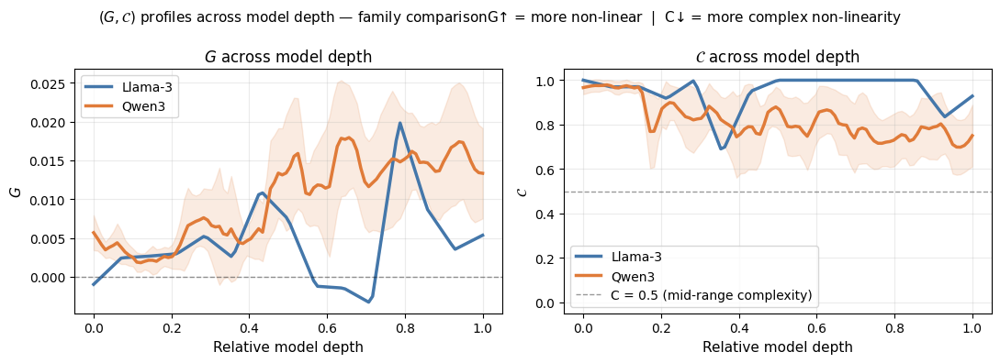

In [36]:
# ── N5: G and C vs. relative depth — cross-family comparison ────────────────
# Two-panel figure: G-curve and C-curve side by side, one line per family.
# Directly shows whether non-linearity (G) and its complexity (C) co-emerge.

def plot_gc_by_depth(
    ldf: pd.DataFrame,
    families: list = None,
    n_interp: int = 100,
    figsize=(11, 4),
    save_path: str = None,
):
    from scipy.interpolate import interp1d as _interp1d

    if families is None:
        families = sorted(ldf["family"].unique())

    family_colors = {
        "Qwen3":   "#E07B39",
        "Llama-3": "#4477AA",
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }
    xs = np.linspace(0, 1, n_interp)

    # Pre-compute per-layer (G, C) for the full dataframe
    layer_col = "layer" if "layer" in ldf.columns else "layer_group"
    gc_all = compute_gc(ldf, groupby=["model", "family", layer_col])
    if "rel_depth" not in gc_all.columns:
        n_layers_map = ldf.groupby("model")["n_layers"].first()
        layer_max    = ldf.groupby(["model", layer_col])[layer_col].first()
        gc_all["n_layers"]  = gc_all["model"].map(n_layers_map)
        gc_all["rel_depth"] = gc_all[layer_col] / (gc_all["n_layers"] - 1)

    fig, (ax_G, ax_C) = plt.subplots(1, 2, figsize=figsize, sharey=False)

    for family in families:
        fdf    = gc_all[gc_all["family"] == family]
        models = fdf["model"].unique()
        G_curves, C_curves = [], []

        for model in models:
            mdf = fdf[fdf["model"] == model].sort_values("rel_depth")
            if len(mdf) < 3:
                continue
            fG = _interp1d(mdf["rel_depth"], mdf["G"],
                           kind="linear", bounds_error=False, fill_value="extrapolate")
            fC = _interp1d(mdf["rel_depth"], mdf["C"],
                           kind="linear", bounds_error=False, fill_value="extrapolate")
            G_curves.append(fG(xs))
            C_curves.append(fC(xs))

        if not G_curves:
            continue
        color = family_colors.get(family, "#888888")

        for arr, ax, ylabel, title in [
            (np.array(G_curves), ax_G,
             "$G$  (asymptotic gain)", "$G$ vs. relative depth"),
            (np.array(C_curves), ax_C,
             "$\mathcal{C}$  (complexity AUC)", "$\mathcal{C}$ vs. relative depth"),
        ]:
            mean = arr.mean(axis=0)
            sem  = arr.std(axis=0) / np.sqrt(len(arr))
            ax.plot(xs, mean, color=color, linewidth=2.5, label=family)
            ax.fill_between(xs, mean - 1.96*sem, mean + 1.96*sem,
                            color=color, alpha=0.15)

    ax_G.axhline(0, color="black", linewidth=1, linestyle="--", alpha=0.4)
    ax_C.axhline(0.5, color="black", linewidth=1, linestyle="--", alpha=0.4,
                 label="C = 0.5 (mid-range complexity)")

    for ax, ylabel, title in [
        (ax_G, "$G$", "$G$ across model depth"),
        (ax_C, "$\mathcal{C}$", "$\mathcal{C}$ across model depth"),
    ]:
        ax.set_xlabel("Relative model depth", fontsize=11)
        ax.set_ylabel(ylabel, fontsize=11)
        ax.set_title(title, fontsize=12)
        ax.legend(fontsize=10)
        ax.grid(True, alpha=0.25)

    ax_C.set_ylim(-0.05, 1.05)
    plt.suptitle(
        "$(G, \mathcal{C})$ profiles across model depth — family comparison" \
        ""
        "G↑ = more non-linear  |  C↓ = more complex non-linearity",
        fontsize=11,
    )
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_gc_by_depth(ldf, save_path="figures/gc_by_depth.pdf")


<>:27: SyntaxWarning: invalid escape sequence '\m'
<>:28: SyntaxWarning: invalid escape sequence '\D'
<>:27: SyntaxWarning: invalid escape sequence '\m'
<>:28: SyntaxWarning: invalid escape sequence '\D'
/var/folders/l_/qy6xpxn531ngvxwsvs64x62h0000gn/T/ipykernel_36750/94360472.py:27: SyntaxWarning: invalid escape sequence '\m'
  ax.set_xlabel("$G_{\mathrm{raw}}$ — old mean NLS", fontsize=11)
/var/folders/l_/qy6xpxn531ngvxwsvs64x62h0000gn/T/ipykernel_36750/94360472.py:28: SyntaxWarning: invalid escape sequence '\D'
  ax.set_ylabel("$G$ — new asymptotic gain  $\tilde{\Delta}(h_{\max})$", fontsize=11)


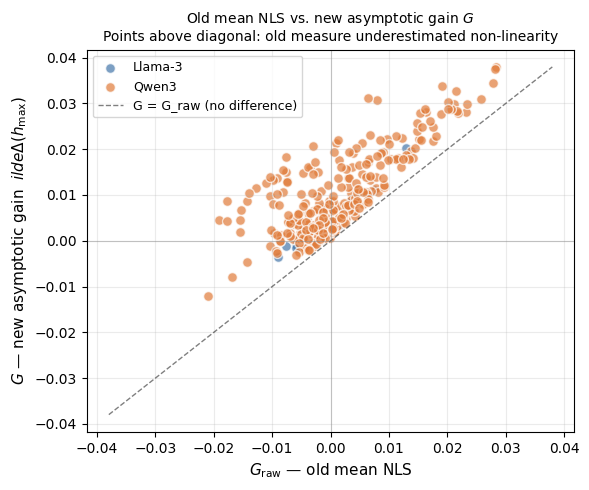

In [37]:
# ── N6: Old NLS vs G — diagnostic comparison ─────────────────────────────────
# Scatter of G_raw (old mean-based NLS) against G (new asymptotic gain).
# Points far from the diagonal are cases where the old measure was misleading.

def plot_old_vs_new_nls(
    gc_df: pd.DataFrame,
    figsize=(6, 5),
    save_path: str = None,
):
    family_colors = {
        "Qwen3": "#E07B39", "Llama-3": "#4477AA",
        "Gemma3": "#228833", "Qwen3-VL": "#AA3377",
    }
    fig, ax = plt.subplots(figsize=figsize)

    for family, grp in gc_df.groupby("family"):
        ax.scatter(grp["G_raw"], grp["G"],
                   c=family_colors.get(family, "#888888"),
                   s=50, alpha=0.7, label=family, edgecolors="white")

    lim = max(gc_df[["G_raw","G"]].abs().max().max(), 0.01)
    ax.plot([-lim, lim], [-lim, lim], "k--", linewidth=1, alpha=0.5,
            label="G = G_raw (no difference)")
    ax.axhline(0, color="gray", linewidth=0.8, alpha=0.4)
    ax.axvline(0, color="gray", linewidth=0.8, alpha=0.4)

    ax.set_xlabel("$G_{\mathrm{raw}}$ — old mean NLS", fontsize=11)
    ax.set_ylabel("$G$ — new asymptotic gain  $\tilde{\Delta}(h_{\max})$", fontsize=11)
    ax.set_title("Old mean NLS vs. new asymptotic gain $G$\n"
                 "Points above diagonal: old measure underestimated non-linearity",
                 fontsize=10)
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.25)
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


gc_group = compute_gc(ldf, groupby=["model","family","layer_group"])
plot_old_vs_new_nls(gc_group, save_path="figures/old_vs_new_nls.pdf")


---
## Non-Linearity Scorer Framework

Three candidate scorers, each measuring a different aspect of the
capacity-gain curve $h \mapsto \Delta(h_k) = \text{acc}_{\text{MLP}}(h_k) - \text{acc}_{\text{LR}}$:

| ID | Name | Formula | Measures |
|---|---|---|---|
| `S1` | Relative gain | $G\,/\,(1-\text{acc}_{LR})$ | Magnitude relative to headroom |
| `S2` | Signal-to-noise | $G\,/\,\sigma(\Delta)$ | Gain relative to sweep variance |
| `S3` | Consistency (recommended) | $G \cdot \tilde{\rho}$ | Peak gain × fraction of capacity levels that beat LR |

**Swap scorers** by changing `ACTIVE_SCORER` in cell S1.  All downstream cells read from that variable automatically.

The `S3` scorer returns the full $(G,\,\tilde{\rho})$ pair alongside the
scalar $\tilde{S} = G \cdot \tilde{\rho}$, enabling the 2-D characterisation
plots in cells S5–S6.

In [6]:
# ── S1: Scorer definitions and active-scorer selector ───────────────────────
#
# Each scorer is a plain function with the signature:
#   scorer(deltas: np.ndarray, lr_acc: float) -> dict
#
# It receives the raw (non-isotonic) delta array, sorted by ascending hidden_dim,
# and the scalar LR accuracy, and must return a dict that always contains
# at least the key "score".  Extra keys are scorer-specific and flow through
# to all downstream DataFrames and plots transparently.
#
# ── Change this one line to swap scorers everywhere ──────────────────────────
ACTIVE_SCORER = "S3_clip"   # "S1" | "S2" | "S3"
# ─────────────────────────────────────────────────────────────────────────────

import warnings


def _G(deltas: np.ndarray) -> float:
    """Asymptotic gain: maximum observed delta across all capacity levels."""
    
    return float(np.max(deltas))

# ── S1: Relative improvement over linear baseline ────────────────────────────
def scorer_S0(deltas: np.ndarray, lr_acc: float) -> dict:
    """
    S1 = G / (1 - acc_LR)

    Normalises the peak gain by the headroom available above the linear
    baseline.  Penalises cases where LR is already near-perfect (small
    headroom → large S1 even for tiny absolute gains).

    Range: [0, ∞)  (can exceed 1 if G > 1 - acc_LR, e.g. near-chance LR)
    Limitation: does not depend on the shape of the capacity-gain curve;
    two curves with identical G but different consistency get the same score.
    """

    return {"score": deltas.mean(), "G": deltas.mean(), "std": deltas.std()}


# ── S1: Relative improvement over linear baseline ────────────────────────────
def scorer_S1(deltas: np.ndarray, lr_acc: float) -> dict:
    """
    S1 = G / (1 - acc_LR)

    Normalises the peak gain by the headroom available above the linear
    baseline.  Penalises cases where LR is already near-perfect (small
    headroom → large S1 even for tiny absolute gains).

    Range: [0, ∞)  (can exceed 1 if G > 1 - acc_LR, e.g. near-chance LR)
    Limitation: does not depend on the shape of the capacity-gain curve;
    two curves with identical G but different consistency get the same score.
    """
    G        = _G(deltas)
    headroom = 1.0 - lr_acc
    if headroom < 1e-6:
        score = 0.0
    else:
        score = G / headroom
    return {"score": score, "G": G, "headroom": headroom}


# ── S2: Signal-to-noise ratio ─────────────────────────────────────────────────
def scorer_S2(deltas: np.ndarray, lr_acc: float) -> dict:
    """
    S2 = G / σ(Δ)

    Rewards a large peak gain relative to the variance across the sweep.
    A flat curve where all MLPs improve equally gets a high score; a noisy
    curve where one capacity level stands out gets a low score.

    Range: [0, ∞)
    Limitation: rewards flat curves regardless of whether gains are large or
    small; penalises the theoretically-expected monotone rise with capacity.
    Sensitive to training-seed noise.
    """
    G   = _G(deltas)
    std = float(np.std(deltas))
    if std < 1e-9:
        # All deltas identical → perfectly flat curve
        score = G / 1e-9 if G > 0 else 0.0
        warnings.warn("S2: zero variance in deltas; score is ill-defined.")
    else:
        score = G / std
    return {"score": score, "G": G, "delta_std": std}


# ── S3: Capacity-weighted consistency (recommended) ───────────────────────────
def scorer_S3_simple(deltas: np.ndarray, lr_acc: float) -> dict:
    """
    S3 = G · ρ̃    where    ρ̃ = (1/K) Σ_k clip(Δ(h_k) / G, 0, 1)

    G    : peak gain — how much non-linearity helps at maximum capacity
    ρ̃    : mean normalised gain — fraction of G achieved on average across
           capacity levels (negative deltas clipped to 0, not penalised)

    ρ̃ = 1  →  every capacity level achieves the full gain (mild non-linearity
               is present and captured even by the smallest MLP)
    ρ̃ = 1/K → only one capacity level achieves G, the rest are ≤ 0
               (gain is fragile / present only at maximum capacity)

    Score is permutation-invariant in k: does not distinguish whether the
    consistent gain is at h=8 or h=512.  Pair with saturation_dim for that.

    Range: [0, G]    (= G when ρ̃ = 1,  = 0 when G = 0)
    """
    G = _G(deltas)
    # if G < 1e-9:
    #     rho_tilde = 0.0
    #     score     = 0.0
    #else:
    #normalised = np.clip(deltas / G, 0.0, 1.0)
    #print(deltas)
    normalised = np.asarray([1 if deltas[i] > 0.0 else 0 for i in range(len(deltas))], dtype=np.float32)
    #print(normalised)
    rho_tilde  = float(normalised.mean())
    score      = G * rho_tilde
    # Saturation dim: smallest capacity achieving ≥ 90% of G
    # (returned as supplementary info, not part of the scalar score)
    return {"score": score, "G": G, "rho_tilde": rho_tilde}

def scorer_S3_with_clip(deltas: np.ndarray, lr_acc: float) -> dict:
    """
    S3 = G · ρ̃    where    ρ̃ = (1/K) Σ_k clip(Δ(h_k) / G, 0, 1)

    G    : peak gain — how much non-linearity helps at maximum capacity
    ρ̃    : mean normalised gain — fraction of G achieved on average across
           capacity levels (negative deltas clipped to 0, not penalised)

    ρ̃ = 1  →  every capacity level achieves the full gain (mild non-linearity
               is present and captured even by the smallest MLP)
    ρ̃ = 1/K → only one capacity level achieves G, the rest are ≤ 0
               (gain is fragile / present only at maximum capacity)

    Score is permutation-invariant in k: does not distinguish whether the
    consistent gain is at h=8 or h=512.  Pair with saturation_dim for that.

    Range: [0, G]    (= G when ρ̃ = 1,  = 0 when G = 0)
    """
    G = _G(deltas)
    # if G < 1e-9:
    #     rho_tilde = 0.0
    #     score     = 0.0
    #else:
    normalised = np.clip(deltas / G, 0.0, 1.0)
    #print(deltas)
    #normalised = np.asarray([1 if deltas[i] > 0.0 else 0 for i in range(len(deltas))], dtype=np.float32)
    #print(normalised)
    rho_tilde  = float(normalised.mean())
    score      = G * rho_tilde
    # Saturation dim: smallest capacity achieving ≥ 90% of G
    # (returned as supplementary info, not part of the scalar score)
    return {"score": score, "G": G, "rho_tilde": rho_tilde}

def scorer_S3_with_clip_and_headroom(deltas: np.ndarray, lr_acc: float) -> dict:
    """
    S3 = G · ρ̃    where    ρ̃ = (1/K) Σ_k clip(Δ(h_k) / G, 0, 1)

    G    : peak gain — how much non-linearity helps at maximum capacity
    ρ̃    : mean normalised gain — fraction of G achieved on average across
           capacity levels (negative deltas clipped to 0, not penalised)

    ρ̃ = 1  →  every capacity level achieves the full gain (mild non-linearity
               is present and captured even by the smallest MLP)
    ρ̃ = 1/K → only one capacity level achieves G, the rest are ≤ 0
               (gain is fragile / present only at maximum capacity)

    Score is permutation-invariant in k: does not distinguish whether the
    consistent gain is at h=8 or h=512.  Pair with saturation_dim for that.

    Range: [0, G]    (= G when ρ̃ = 1,  = 0 when G = 0)
    """
    G = _G(deltas)
    headroom = 1.0 - lr_acc
    G_normalized = G / headroom
    if G_normalized < 1e-9:
        rho_tilde = 0.0
        score     = 0.0
    else:
        normalised = np.clip(deltas / G, 0.0, 1.0)
        #print(deltas)
        #normalised = np.asarray([1 if deltas[i] > 0.0 else 0 for i in range(len(deltas))], dtype=np.float32)
        #print(normalised)
        rho_tilde  = float(normalised.mean())
        score      = G_normalized * rho_tilde
    # Saturation dim: smallest capacity achieving ≥ 90% of G
    # (returned as supplementary info, not part of the scalar score)
    return {"score": score, "G": G_normalized, "G_max": G, "headroom": headroom, "rho_tilde": rho_tilde}

def scorer_S4(deltas: np.ndarray, lr_acc: float) -> dict:
    """
    S3 = G · ρ̃    where    ρ̃ = (1/K) Σ_k clip(Δ(h_k) / G, 0, 1)

    G    : peak gain — how much non-linearity helps at maximum capacity
    ρ̃    : mean normalised gain — fraction of G achieved on average across
           capacity levels (negative deltas clipped to 0, not penalised)

    ρ̃ = 1  →  every capacity level achieves the full gain (mild non-linearity
               is present and captured even by the smallest MLP)
    ρ̃ = 1/K → only one capacity level achieves G, the rest are ≤ 0
               (gain is fragile / present only at maximum capacity)

    Score is permutation-invariant in k: does not distinguish whether the
    consistent gain is at h=8 or h=512.  Pair with saturation_dim for that.

    Range: [0, G]    (= G when ρ̃ = 1,  = 0 when G = 0)
    """
    hidden_dims = [8, 16, 32, 64, 128, 256, 512]
    cwia = compute_cwia(g=deltas, hidden_dims=np.array(hidden_dims, dtype=float), lr_acc=lr_acc, return_diagnostics=True)
    # Saturation dim: smallest capacity achieving ≥ 90% of G
    # (returned as supplementary info, not part of the scalar score)
    return {"score": cwia["cwia"], "G": cwia["max_iso_gain"], "saturation_dim": cwia["saturation_dim"]}


# ── Registry ──────────────────────────────────────────────────────────────────
SCORERS = {
    "S0": scorer_S0,
    "S1": scorer_S1,
    #"S2": scorer_S2,
    "S3_tau": scorer_S3_simple,
    "S3_clip": scorer_S3_with_clip,
    "S3_headroom": scorer_S3_with_clip_and_headroom,
    #"S4": scorer_S4
}

SCORER_LABELS = {
    "S0": r"NLS_{mean}",
    "S1": r"$S_1 = G\,/\,(1 - \mathrm{acc}_{LR})$",
    #"S2": r"$S_2 = G\,/\,\sigma(\Delta)$",
    "S3_tau": r"${NL_{C}} = G \cdot \rho$",
    "S3_clip": r"$\tilde{NL_{C}} = G \cdot \tilde{\rho}$",
    "S3_headroom": r"$\tilde{NL_{C,N}} = G \cdot \tilde{\rho}$",
    #"S4": r"${NL_{CWIA}} Capacity-weighted improvement aggregate of non-linearity"
}

print(f"Active scorer: {ACTIVE_SCORER}  —  {SCORER_LABELS[ACTIVE_SCORER]}")
print(f"Available scorers: {list(SCORERS.keys())}")


Active scorer: S3_clip  —  $\tilde{NL_{C}} = G \cdot \tilde{\rho}$
Available scorers: ['S0', 'S1', 'S3_tau', 'S3_clip', 'S3_headroom']


In [16]:
a = [0.05, -0.05, 0.02, 1, -0.5]
b = [1 if a[i] > 0.0 else 0 for i in range(len(a))]
print(b)

[1, 0, 1, 1, 0]


In [7]:
# ── S2: Sanity checks — verify all three scorers on constructed examples ──────
#
# Three contrived layers document what each scorer sees:
#   Layer A — uniform gain c at every capacity (mild, consistent non-linearity)
#   Layer B — gain only at h_max (fragile, high-capacity-only non-linearity)
#   Layer C — monotone rise from 0 to c (realistic saturation curve)

def _check_all_scorers(label, deltas, lr_acc=0.60):
    print(f"\n  {label}:  Δ = {np.round(deltas, 3).tolist()}")
    for name, fn in SCORERS.items():
        out = fn(deltas, lr_acc)
        print(f"    {name}: " + "  ".join(f"{k}={v:.4f}" for k, v in out.items()))

K   = 7
c   = 0.04
LR  = 0.70

deltas_A = np.full(K, c)                              # uniform gain
deltas_B = np.array([0.]*6 + [K * c])                # gain only at h_max
deltas_C = np.linspace(0, c, K)                      # linear rise
deltas_D = np.array([-0.01, -0.005, 0., 0.01, 0.02, 0.03, c])  # starts negative
deltas_E = np.array([-0.08, -0.05, -0.01, -0.01, -0.02, -0.03, -c])  # starts negative, stays negative
deltas_F = np.array([-0.08, -0.05, -0.01, 0.01, 0.025, 0.01, 0.005]) 

print("=" * 60)
print("Sanity checks — LR acc =", LR)
_check_all_scorers("Layer A (uniform gain)", deltas_A, LR)
_check_all_scorers("Layer B (gain only at h_max)", deltas_B, LR)
_check_all_scorers("Layer C (linear rise 0→c)", deltas_C, LR)
_check_all_scorers("Layer D (starts negative, rises to c)", deltas_D, LR)
_check_all_scorers("Layer E (starts negative, stays negative)", deltas_E, LR)
_check_all_scorers("Layer F (starts negative, rises and reaches peak at k=5)", deltas_F, LR)
print()
print("Expected behaviour:")
print("  S3.G(A) == S3.G(C) == c  [same peak]")
print("  S3.rho_tilde(A) == 1.0   [all caps achieve full gain]")
print("  S3.rho_tilde(B) == 1/K   [only last cap achieves gain]")
print("  S3.rho_tilde(C) > S3.rho_tilde(B)  [partial but not full]")
print("  S1 and S2 give same score for A and B (can't distinguish them)")


Sanity checks — LR acc = 0.7

  Layer A (uniform gain):  Δ = [0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04]
    S0: score=0.0400  G=0.0400  std=0.0000
    S1: score=0.1333  G=0.0400  headroom=0.3000
    S3_tau: score=0.0400  G=0.0400  rho_tilde=1.0000
    S3_clip: score=0.0400  G=0.0400  rho_tilde=1.0000
    S3_headroom: score=0.1333  G=0.1333  G_max=0.0400  headroom=0.3000  rho_tilde=1.0000

  Layer B (gain only at h_max):  Δ = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.28]
    S0: score=0.0400  G=0.0400  std=0.0980
    S1: score=0.9333  G=0.2800  headroom=0.3000
    S3_tau: score=0.0400  G=0.2800  rho_tilde=0.1429
    S3_clip: score=0.0400  G=0.2800  rho_tilde=0.1429
    S3_headroom: score=0.1333  G=0.9333  G_max=0.2800  headroom=0.3000  rho_tilde=0.1429

  Layer C (linear rise 0→c):  Δ = [0.0, 0.007, 0.013, 0.02, 0.027, 0.033, 0.04]
    S0: score=0.0200  G=0.0200  std=0.0133
    S1: score=0.1333  G=0.0400  headroom=0.3000
    S3_tau: score=0.0343  G=0.0400  rho_tilde=0.8571
    S3_clip: score=0.0

In [16]:
# ── V2: Discriminant validity — constructed gain curves ──────────────────────
#
# Four cases with known structural properties.  A valid measure should
# distinguish A from B (uniform vs. fragile gain) and C from D (consistent
# rise vs. starting negative).  Mean NL collapses A and B; CWIA + (G, ρ̃)
# separate them.

import numpy as np
import pandas as pd
from probes_with_dynamic_hidden import NL_HIDDEN_DIMS  # whatever the canonical sweep is

def validate_discriminant() -> pd.DataFrame:
    """
    Run all available scorers on four constructed gain curves and return a
    table comparing their outputs.  Paper-ready: drop directly into Appendix.
    """
    hidden_dims = np.array(NL_HIDDEN_DIMS, dtype=float)
    K = len(hidden_dims)
    c = 0.04

    cases = {
        "Layer A (uniform gain)" : np.full(K, c),  
        "Layer B (gain only at h_max)": np.array([0.]*6 + [K * c]),
        "Layer C (linear rise 0→c)" : np.linspace(0, c, K) ,
        "Layer D (starts negative, rises to c)" : np.array([-0.01, -0.005, 0., 0.01, 0.02, 0.03, c]),
        "Layer E (starts negative, stays negative)" : np.array([-0.08, -0.05, -0.01, -0.01, -0.02, -0.03, -c]),
        "Layer F (starts negative, rises and reaches peak at k=5)" : np.array([-0.08, -0.05, -0.01, 0.01, 0.025, 0.01, 0.005]) 
    }
    lr_acc = 0.65  # arbitrary baseline used uniformly

    rows = []
    for label, g in cases.items():
        # Compute outputs from each scorer if available
        row = {"case": label, "g_min": float(g.min()), "g_max": float(g.max()),
               "g_mean": float(g.mean())}
        for scorer_name, scorer_fn in SCORERS.items():
            try:
                out = scorer_fn(g, lr_acc)
                row[f"{scorer_name}_score"] = round(out["score"], 4)
                if "G" in out:        row[f"{scorer_name}_G"]   = round(out["G"], 4)
                if "rho_tilde" in out: row[f"{scorer_name}_rho"] = round(out["rho_tilde"], 4)
            except Exception:
                pass

        # CWIA if available (uses compute_cwia directly)
        # try:
        #     cwia_diag = compute_cwia(g, hidden_dims, lr_acc, return_diagnostics=True)
        #     row["CWIA"]          = round(cwia_diag["cwia"], 4)
        #     row["raw_NLS"]       = round(cwia_diag["raw_nls"], 4)
        #     row["saturation_d"]  = int(cwia_diag["saturation_dim"])
        #     row["mono_index"]    = round(cwia_diag["monotonicity_index"], 3)
        # except Exception:
        #     pass

        rows.append(row)
    return pd.DataFrame(rows)


# Usage:
disc_df = validate_discriminant()
disc_df.head()
# disc_df.to_csv("validation_discriminant.csv", index=False)


,case,g_min,g_max,g_mean,S0_score,S0_G,S1_score,S1_G,S3_tau_score,S3_tau_G,S3_tau_rho,S3_clip_score,S3_clip_G,S3_clip_rho,S3_headroom_score,S3_headroom_G,S3_headroom_rho
0,Layer A (uniform gain),0.04,0.04,0.040000,0.0400,0.0400,0.1143,0.04,0.0400,0.04,1.0000,0.0400,0.04,1.0000,0.1143,0.1143,1.0000
1,Layer B (gain only at h_max),0.00,0.28,0.040000,0.0400,0.0400,0.8000,0.28,0.0400,0.28,0.1429,0.0400,0.28,0.1429,0.1143,0.8000,0.1429
2,Layer C (linear rise 0→c),0.00,0.04,0.020000,0.0200,0.0200,0.1143,0.04,0.0343,0.04,0.8571,0.0200,0.04,0.5000,0.0571,0.1143,0.5000
3,"Layer D (starts negative, rises to c)",-0.01,0.04,0.012143,0.0121,0.0121,0.1143,0.04,0.0229,0.04,0.5714,0.0143,0.04,0.3571,0.0408,0.1143,0.3571
4,"Layer E (starts negative, stays negative)",-0.08,-0.01,-0.034286,-0.0343,-0.0343,-0.0286,-0.01,-0.0000,-0.01,0.0000,0.0000,-0.01,0.0000,0.0000,-0.0286,0.0000


In [20]:
# ── S3: compute_scores — unified scoring function (all three candidates) ──────
#
# Operates on either group-level or layer-wise results DataFrames.
# Returns one row per (model, <layer_col>) with scores from the active scorer
# plus supplementary columns G, and scorer-specific extras (rho_tilde, etc.).

def compute_scores(
    df: pd.DataFrame,
    scorer_name: str = None,
    groupby: list = None,
) -> pd.DataFrame:
    """
    Compute the active (or specified) non-linearity score for every
    (model, layer/layer_group) combination.

    Parameters
    ----------
    df          : results DataFrame with columns model, family, hidden_dim,
                  probe, accuracy, and a layer column.
    scorer_name : one of "S1", "S2", "S3" (default: ACTIVE_SCORER).
    groupby     : grouping columns. Default: ["model","family","layer"] or
                  ["model","family","layer_group"] if layer absent.

    Returns
    -------
    DataFrame with one row per group.  Always contains:
      model | family | <layer_col> | score | G | scorer
    Plus scorer-specific extras (rho_tilde for S3; headroom for S1; etc.)
    Also always includes:
      lr_acc       : mean LR accuracy at that (model, layer)
      G_raw_mean   : old mean-delta NLS (kept for backward comparison)
      n_hd         : number of hidden-dim levels used
      saturation_dim : smallest h achieving ≥ 90% of G  (or NaN)
    """
    if scorer_name is None:
        scorer_name = ACTIVE_SCORER
    scorer_fn = SCORERS[scorer_name]

    if groupby is None:
        groupby = ["model", "family", "layer"]

    # Compute mean accuracy per (group_keys, hidden_dim), averaged over
    # val_datasets and medleys
    mlp_df = df[df["hidden_dim"] > 0].copy()
    lr_df  = df[df["probe"] == "LRProbe"].copy()

    records = []
    for keys, grp in mlp_df.groupby(groupby):
        key_dict = dict(zip(groupby, keys if isinstance(keys, tuple) else [keys]))

        hd_means = (
            grp.groupby("hidden_dim")["accuracy"]
            .mean()
            .sort_index()
        )
        hidden_dims = hd_means.index.values.astype(float)
        deltas_raw  = hd_means.values  # absolute acc, not yet delta

        # LR baseline
        lr_mask = np.ones(len(lr_df), dtype=bool)
        for col, val in key_dict.items():
            if col in lr_df.columns:
                lr_mask &= (lr_df[col] == val)
        lr_sub  = lr_df[lr_mask]["accuracy"]
        if lr_sub.empty:
            continue
        lr_acc  = float(lr_sub.mean())

        deltas = deltas_raw - lr_acc   # Δ(h_k) = acc_MLP(h_k) - acc_LR

        # ── Run scorer ────────────────────────────────────────────────────────
        result = scorer_fn(deltas, lr_acc)

        # ── Supplementary stats (scorer-independent) ─────────────────────────
        G_raw_mean = float(deltas.mean())

        # Saturation dim: smallest h_k where Δ(h_k) ≥ 0.9 * G
        #print(result)
        G = result["G"]
        threshold = 0.9 * G
        sat_candidates = np.where(deltas >= threshold)[0]
        sat_dim = int(hidden_dims[sat_candidates[0]]) if len(sat_candidates) else int(hidden_dims[-1])

        records.append({
            **key_dict,
            "score":        result["score"],
            "G":            G,
            "lr_acc":       lr_acc,
            "G_raw_mean":   G_raw_mean,
            "n_hd":         len(hidden_dims),
            "hd_min":       int(hidden_dims[0]),
            "hd_max":       int(hidden_dims[-1]),
            "saturation_dim": sat_dim,
            "scorer":       scorer_name,
            # Pass through all scorer-specific extras
            **{k: v for k, v in result.items() if k not in ("score", "G")},
        })

    out = pd.DataFrame(records)

    # Attach relative depth if layer column is absolute
    layer_col = [c for c in groupby if c not in ("model", "family")][0]
    if layer_col == "layer" and "n_layers" in df.columns:
        n_layers_map = df.groupby("model")["n_layers"].first()
        out["n_layers"]  = out["model"].map(n_layers_map)
        out["rel_depth"] = out["layer"] / (out["n_layers"] - 1)
        out["decile"]    = (out["rel_depth"] * 10).clip(upper=9.999).astype(int)

    return out


# ── Convenience wrapper that runs all three scorers and stacks results ─────────
def compute_all_scorers(df: pd.DataFrame, groupby: list = None) -> pd.DataFrame:
    """Run S1, S2, S3 and return a single DataFrame with a 'scorer' column."""
    return pd.concat(
        [compute_scores(df, scorer_name=s, groupby=groupby) for s in SCORERS],
        ignore_index=True,
    )


# Quick demo (runs without data):
scores = compute_scores(ldf)                    # uses ACTIVE_SCORER
scores = compute_scores(ldf, scorer_name="S3_headroom")  # override
all_s  = compute_all_scorers(ldf)              # all three stacked


In [57]:
all_s.head()

,model,family,layer,score,G,lr_acc,G_raw_mean,n_hd,hd_min,hd_max,saturation_dim,scorer,std,n_layers,rel_depth,decile,headroom,delta_std,rho_tilde,G_max
0,Qwen3-0_6B,Qwen3,0,0.007329,0.007329,0.566861,0.007329,7,8,512,32,S0,0.011358,27,0.000000,0,NaN,NaN,NaN,NaN
1,Qwen3-0_6B,Qwen3,1,0.012181,0.012181,0.571278,0.012181,7,8,512,16,S0,0.013001,27,0.038462,0,NaN,NaN,NaN,NaN
2,Qwen3-0_6B,Qwen3,2,0.012304,0.012304,0.581375,0.012304,7,8,512,32,S0,0.004884,27,0.076923,0,NaN,NaN,NaN,NaN
3,Qwen3-0_6B,Qwen3,3,0.019722,0.019722,0.582431,0.019722,7,8,512,8,S0,0.005998,27,0.115385,1,NaN,NaN,NaN,NaN
4,Qwen3-0_6B,Qwen3,4,0.017944,0.017944,0.588653,0.017944,7,8,512,32,S0,0.006600,27,0.153846,1,NaN,NaN,NaN,NaN


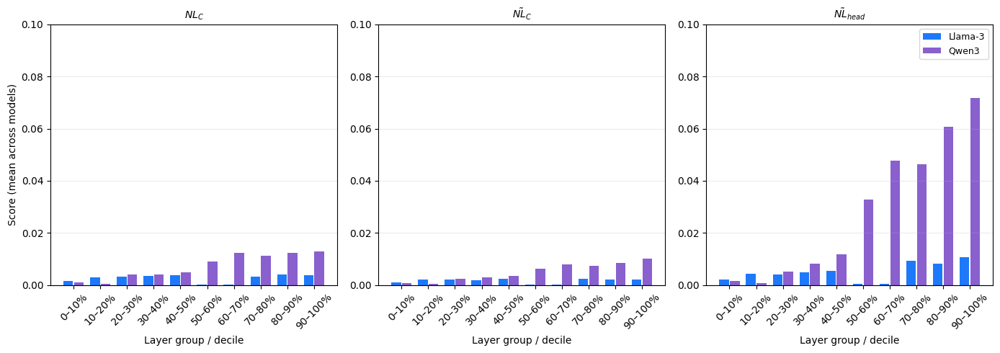

In [39]:
# ── S4: Scorer comparison — all three on the same data ───────────────────────
# Faceted bar chart: one column per scorer, rows = family × layer_group.
# Useful for sanity-checking that the scorers agree on the extremes and
# diverge in the middle — which is where the theoretical differences matter.

def plot_scorer_comparison_families(
    df: pd.DataFrame,
    #model: str,
    figsize=(14, 5),
    save_path: str = None,
):
    """
    Run all three scorers on df and produce a side-by-side bar chart.

    One subplot per scorer (S1 / S2 / S3), bars grouped by family,
    x-axis = layer group or decile.
    """
    
    gby = ["model", "family", "decile"]
    all_scores = compute_all_scorers(df, groupby=gby)
    layer_order   = sorted(df["decile"].unique())

    decile_labels = [f"{d*10}–{d*10+10}%" for d in range(10)]

    # Mean score per (family, layer_group, scorer)
    pivot = (
        all_scores
        .groupby(["family", "decile", "scorer"])["score"]
        .mean()
        .reset_index()
    )

    families = sorted(pivot["family"].unique())
    family_colors = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }
    # scorer_titles = {
    #     "S1": "S1 — Relative gain G = 1-accLR",
    #     "S2": "S2 — Signal-to-noise G = sigma(Delta)",
    #     "S3": "S3 — Consistency (rec.) G cdot tilde(rho)",
    # }

    scorer_titles = {
        "S3_tau": r"$NL_{C}$",
        "S3_clip": r"$\tilde{NL}_{C}$",
        "S3_headroom": r"$\tilde{NL}_{head}$",
        "S4": r"${NL_{CWIA}} Capacity-weighted improvement aggregate of non-linearity"
    }

    fig, axes = plt.subplots(1, 3, figsize=figsize)
    bar_width = 0.8 / len(families)

    for ax, scorer_id in zip(axes, ["S3_tau", "S3_clip", "S3_headroom"]):
        sub = pivot[pivot["scorer"] == scorer_id]
        for i, family in enumerate(families):
            fsub = sub[sub["family"] == family].set_index("decile")
            heights = [fsub.loc[lg, "score"] if lg in fsub.index else 0.
                       for lg in layer_order]
            offsets = [(j - len(families)/2 + 0.5) * bar_width
                       for j in range(len(families))]
            x = np.arange(len(layer_order))
            ax.bar(
                x + offsets[i], heights,
                width=bar_width * 0.9,
                color=family_colors.get(family, "#888888"),
                label=family, alpha=0.9,
            )

        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_xticks(range(len(decile_labels)))
        ax.set_xticklabels(decile_labels, rotation=45)
        ax.set_xlabel("Layer group / decile", fontsize=10)
        ax.set_title(scorer_titles[scorer_id], fontsize=10)
        ax.grid(True, axis="y", alpha=0.25)
        ax.set_ylim(-0.0, 0.10)
        if ax is axes[0]:
            ax.set_ylabel("Score (mean across models)", fontsize=10)
        if ax is axes[-1]:
            ax.legend(fontsize=9, frameon=True)

    #fig.suptitle("Scorer comparison — all three candidates", fontsize=12,
    #             fontweight="bold")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()



plot_scorer_comparison_families(ldf, save_path="all_toxicity_results/scorer_comparison_truthfulness.pdf")


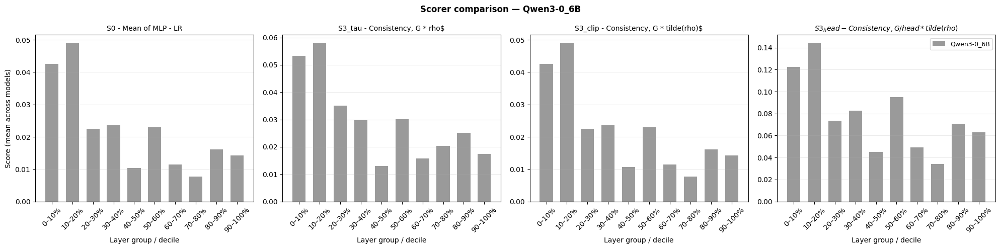

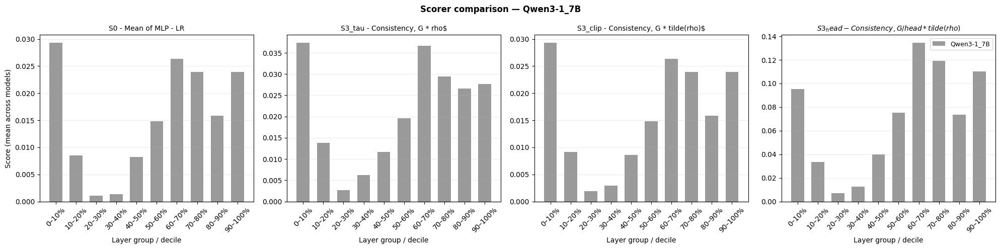

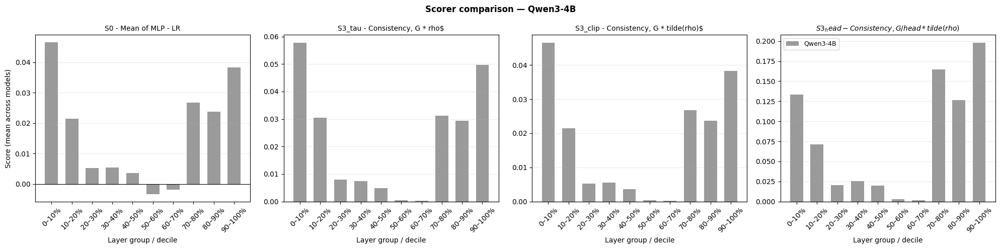

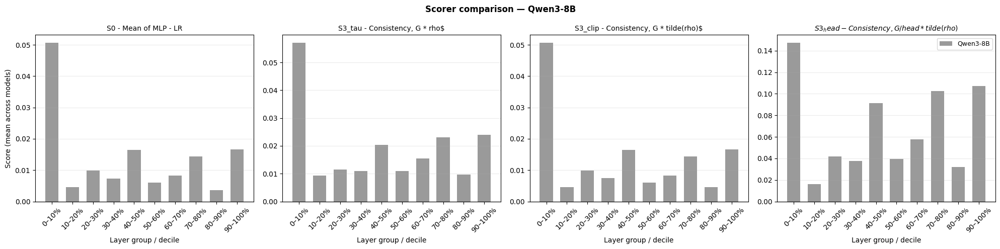

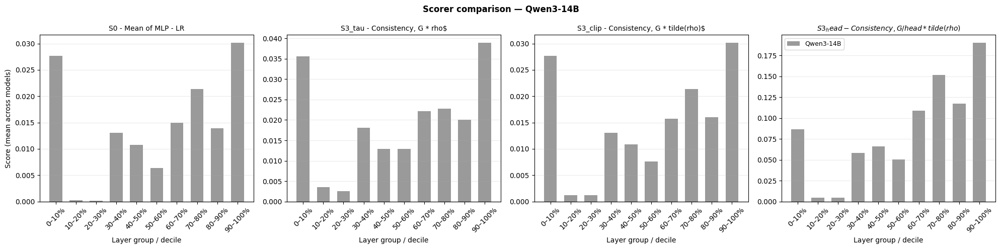

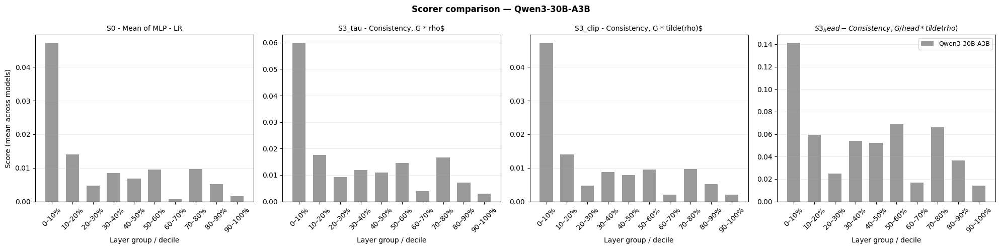

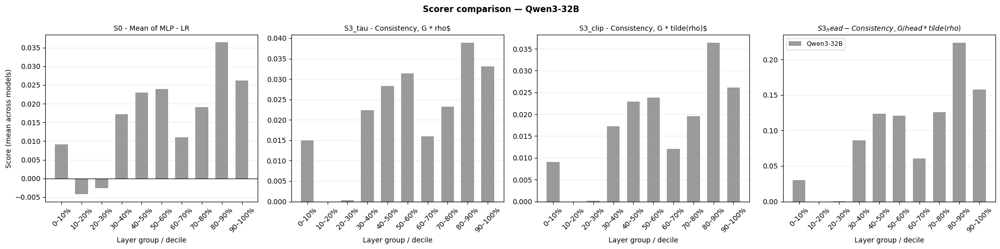

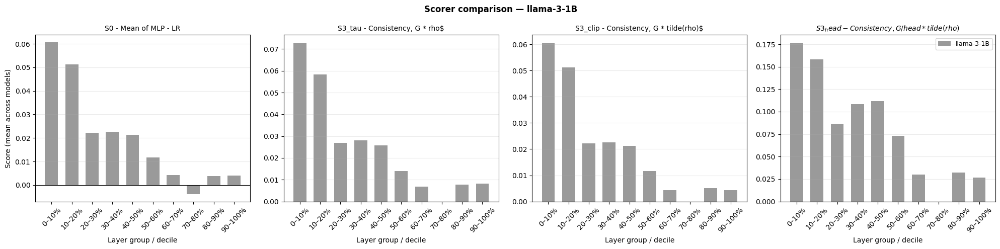

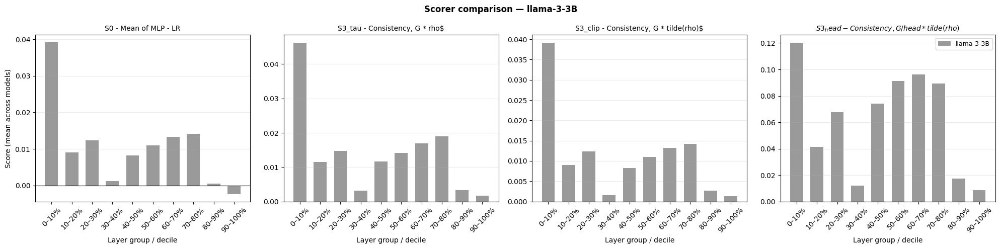

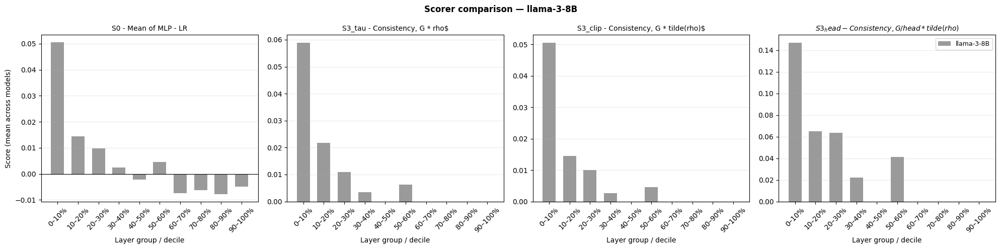

In [ ]:
# ── S4: Scorer comparison — all three on the same data ───────────────────────
# Faceted bar chart: one column per scorer, rows = family × layer_group.
# Useful for sanity-checking that the scorers agree on the extremes and
# diverge in the middle — which is where the theoretical differences matter.

def plot_scorer_comparison_per_model(
    df: pd.DataFrame,
    model: str,
    figsize=(20, 5),
    save_path: str = None,
):
    """
    Run all three scorers on df and produce a side-by-side bar chart.

    One subplot per scorer (S1 / S2 / S3), bars grouped by family,
    x-axis = layer group or decile.
    """
    df = df[df["model"] == model].copy()

    gby = ["model", "family", "decile"]
    all_scores = compute_all_scorers(df, groupby=gby)
    #print(all_scores)
    layer_order   = sorted(df["decile"].unique())
    #print(layer_order)
    decile_labels = [f"{d*10}–{d*10+10}%" for d in range(10)]

    # Mean score per (family, layer_group, scorer)
    pivot = (
        all_scores
        .groupby(["decile", "scorer"])["score"]
        .mean()
        .reset_index()
    )
    #print(pivot)
    #families = sorted(pivot["family"].unique())
    family_colors = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }
    # scorer_titles = {
    #     "S1": "S1 — Relative gain G / 1-accLR",
    #     "S2": "S2 — Signal-to-noise G / sigma(Delta)",
    #     "S3": "S3 — Consistency (rec.) G * tilde(rho)",
    # }

    scorer_titles = {
        "S0": r"S0 - Mean of MLP - LR",
        "S3_tau": r"S3_tau - Consistency, G * rho$",
        "S3_clip": r"S3_clip - Consistency, G * tilde(rho)$",
        "S3_headroom": r"$S3_head - Consistency, G/head * tilde(rho)$",
        "S4": r"${NL_{CWIA}} Capacity-weighted improvement aggregate of non-linearity"
    }

    fig, axes = plt.subplots(1, 4, figsize=figsize)
    bar_width = 0.8

    for ax, scorer_id in zip(axes, ["S0", "S3_tau", "S3_clip", "S3_headroom", "S4"]):
        sub = pivot[pivot["scorer"] == scorer_id].reset_index()
        #print(sub)
        heights = [sub.loc[lg, "score"] for lg in layer_order]
        #print(heights)
        #offsets = [(j - len(families)/2 + 0.5) * bar_width
        #            for j in range(len(families))]
        x = layer_order#np.arange(len(layer_order))
        ax.bar(
            x, heights,
            width=bar_width * 0.8,
            color="#888888",
            label=model, alpha=0.85,
        )

        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_xticks(range(len(decile_labels)))
        ax.set_xticklabels(decile_labels, rotation=45)
        ax.set_xlabel("Layer group / decile", fontsize=10)
        ax.set_title(scorer_titles[scorer_id], fontsize=10)
        ax.grid(True, axis="y", alpha=0.25)
        if ax is axes[0]:
            ax.set_ylabel("Score (mean across models)", fontsize=10)
        if ax is axes[-1]:
            ax.legend(fontsize=9, frameon=True)

    fig.suptitle(f"Scorer comparison — {model}", fontsize=12,
                 fontweight="bold")
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()

for model in ALL_MODELS:
    plot_scorer_comparison_per_model(ldf, model, save_path="figures/scorer_comparison.pdf")


/var/folders/md/2vgg7gfx5d91wf0z6x5m43nc0000gn/T/ipykernel_1254/4133980691.py:135: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=8, ncol=2, loc="best", frameon=True)


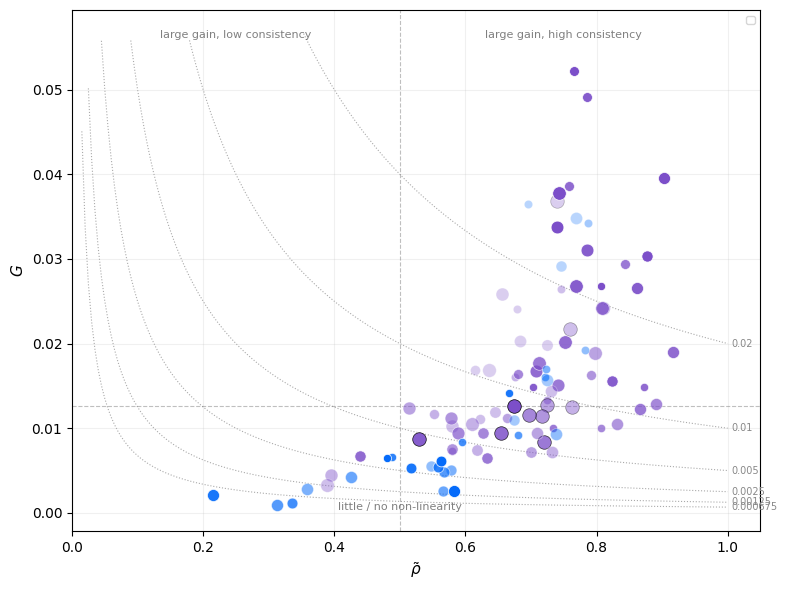

In [11]:
# ── S5: (G, ρ̃) two-dimensional characterisation scatter ─────────────────────
#
# Each point = one (model, layer_group).  Axes:
#   x = ρ̃  (consistency: fraction of capacity levels that beat LR)
#   y = G  (magnitude: peak gain over LR)
#
# Quadrant interpretation:
#   Top-right  (G↑, ρ̃↑) : large gain, consistent across capacities
#                          → non-linearity is real and mild (easy to capture)
#   Top-left   (G↑, ρ̃↓) : large gain, only at high capacity
#                          → non-linearity is real but requires large MLPs
#   Bottom-*   (G↓)      : little or no non-linearity regardless of capacity
#
# Points are coloured by family and shaped by layer group.
# S3 score iso-contours (S = G·ρ̃ = const) are shown as dashed curves.

def plot_G_rho_scatter(
    df: pd.DataFrame,
    groupby_layer: str = "decile",
    min_G: float = 0.0,
    show_contours: bool = True,
    figsize=(8, 6),
    save_path: str = None,
):
    """
    Two-dimensional (G, ρ̃) scatter — only meaningful for scorer S3.

    Parameters
    ----------
    min_G           : filter out points with G < min_G (reduces clutter)
    show_contours   : overlay S = G·ρ̃ iso-curves
    """
    scores = compute_scores(df, scorer_name="S3_clip",
                            groupby=["model", "family", groupby_layer])
    if "rho_tilde" not in scores.columns:
        raise ValueError("rho_tilde column missing — ensure scorer_name='S3'")

    scores = scores[scores["G"] >= min_G].copy()
    #print(scores)
    family_colors  = {
        "Qwen3":   "#7C4FC9",#"#615CED",#"#E07B39", 915CED, #7C4FC9, #633FA1
        "Llama-3": "#056BFA",#"#4477AA", 0457CB
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }

    model_sizes = {
        "Qwen3-0_6B": 35,
        "llama-3-1B": 35,
        "Qwen2-1_5B": 50,
        "Qwen2_5-1_5B": 50,
        "Qwen1_5-1_8B": 50,
        "Qwen3-1_7B": 50,
        "llama-3-3B": 60,
        "Qwen3-4B": 65,
        "Qwen3-8B": 75,
        "llama-3-8B": 75,
        "Qwen3-14B": 85,
        "Qwen3-30B-A3B": 95,
        "Qwen3-32B": 95,
    }

    fig, ax = plt.subplots(figsize=figsize)

    # ── S = G·ρ̃ iso-contours ─────────────────────────────────────────────────
    if show_contours:
        rho_grid = np.linspace(0.01, 1.0, 200)
        contour_levels = [0.000675, 0.00125,0.0025, 0.005, 0.01, 0.02]#, 0.04]#, 0.08, 0.16] #0.000675, 0.00125,
        for S_val in contour_levels:
            G_grid = S_val / rho_grid
            mask   = (G_grid >= 0) & (G_grid <= scores["G"].max() * 1.1)
            ax.plot(rho_grid[mask], G_grid[mask],
                    color="#AAAAAA", linewidth=0.8, linestyle=":",
                    zorder=1)
            # Label contour at right edge
            #print(mask)
            rho_label = rho_grid[mask][-1]
            G_label   = G_grid[mask][-1]
            ax.text(rho_label + 0.005, G_label,
                    f"{S_val}",
                    fontsize=7, color="#888888", va="center")

    # ── Scatter ───────────────────────────────────────────────────────────────
    grouped = scores.groupby(["model", "family", groupby_layer]) if groupby_layer in scores.columns else scores.groupby("model")
    #print(grouped)
    for keys, grp in grouped:
        if isinstance(keys, tuple):
            model, family, group = keys
        else:
            model, family, group = keys, None, None
        color  = family_colors.get(family, "#888888")
        alpha  = 0.2 + (0.8 * (grp["decile"] + 1) / 10.0)
        #print(alpha)
        if model == "Qwen3-30B-A3B":
            edgecolors = "black"
        else:
            edgecolors = "white"
        ax.scatter(
            grp["rho_tilde"], grp["G"],
            c=color, marker="o", s=model_sizes.get(model, 65),
            alpha=alpha, edgecolors=edgecolors, linewidths=0.5,
            #label=f"{model} – {group}" if group else model,
            zorder=3,
        )
        #print(grp["G"])
        #print(grp["rho_tilde"])

    # ── Quadrant shading ──────────────────────────────────────────────────────
    G_mid   = scores["G"].quantile(0.5)
    rho_mid = 0.5
    alpha_q = 0.04
    ax.axvline(rho_mid, color="gray", linewidth=0.8, linestyle="--", alpha=0.5)
    ax.axhline(G_mid,   color="gray", linewidth=0.8, linestyle="--", alpha=0.5)
    # ax.axvspan(0.0,     rho_mid, ymin=0.5, ymax=1.0,
    #            alpha=alpha_q, color="#CC3311", zorder=0)
    # ax.axvspan(rho_mid, 1.0,     ymin=0.5, ymax=1.0,
    #            alpha=alpha_q, color="#CCBB44", zorder=0)
    # ax.axvspan(0.0,     1.0,     ymin=0.0, ymax=0.5,
    #            alpha=alpha_q*0.5, color="#AAAAAA", zorder=0)

    xlim = ax.get_xlim(); ylim = ax.get_ylim()
    kw   = dict(fontsize=8, color="#555555", alpha=0.75)
    ax.text(rho_mid * 0.5,  ylim[1] * 0.96,
            "large gain, low consistency", ha="center", va="top", **kw)
    ax.text(rho_mid * 1.5,  ylim[1] * 0.96, "large gain, high consistency", ha="center", va="top", **kw)
    ax.text(0.5, ylim[0] * 1.02 if ylim[0] > 0 else abs(ylim[0]) * 0.02,
            "little / no non-linearity", ha="center", va="bottom", **kw)

    ax.set_xlabel(r"$\tilde{\rho}$", fontsize=11)
    ax.set_ylabel(r"$G$", fontsize=11) #$\frac{G}{1 - acc_{LR}}$
    # ax.set_title(
    #     "(G, tilde(rho) two-dimensional characterisation Dashed curves = tilde(S) = G cdot tilde(rho) iso-contours",
    #     fontsize=11,
    # )
    ax.legend(fontsize=8, ncol=2, loc="best", frameon=True)
    ax.set_xlim(0, 1.05)
    #ax.set_ylim(-0.005, 0.035)
    ax.grid(True, alpha=0.18)

    plt.tight_layout()
    #if save_path:
    #   plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


#scores_group = compute_scores(ldf, scorer_name="S3_tau")
plot_G_rho_scatter(ldf, save_path="all_toxicity_results/Iso_NL_clip_multilingual_toxicity.png")


In [22]:
import numpy as np
import plotly.graph_objects as go


def plot_G_rho_scatter_plotly(
    df,
    groupby_layer: str = "decile",
    min_G: float = 0.0,
    show_contours: bool = True,
    width: int = 880,
    height: int = 620,
):
    scores = compute_scores(
        df, scorer_name="S3_clip",
        groupby=["model", "family", groupby_layer],
    )
    if "rho_tilde" not in scores.columns:
        raise ValueError("rho_tilde column missing — ensure scorer_name='S3'")
    scores = scores[scores["G"] >= min_G].copy()

    family_colors = {
        "Qwen3":    "#7C4FC9",
        "Llama-3":  "#056BFA",
        "Gemma3":   "#228833",
        "Qwen3-VL": "#AA3377",
    }
    model_sizes = {
        "Qwen3-0_6B": 35, "llama-3-1B": 35,
        "Qwen2-1_5B": 50, "Qwen2_5-1_5B": 50,
        "Qwen1_5-1_8B": 50, "Qwen3-1_7B": 50,
        "llama-3-3B": 60, "Qwen3-4B": 65,
        "Qwen3-8B": 75, "llama-3-8B": 75,
        "Qwen3-14B": 85, "Qwen3-30B-A3B": 95,
        "Qwen3-32B": 95,
    }

    def hex_to_rgba(hex_color, alpha):
        h = hex_color.lstrip("#")
        r, g, b = int(h[0:2], 16), int(h[2:4], 16), int(h[4:6], 16)
        return f"rgba({r},{g},{b},{alpha:.3f})"

    fig = go.Figure()

    # ── S = G·ρ̃ iso-contours ────────────────────────────────────────────
    if show_contours:
        rho_grid = np.linspace(0.01, 1.0, 200)
        contour_levels = [0.000675, 0.00125, 0.0025, 0.005, 0.01, 0.02]
        G_cap = scores["G"].max() * 1.1
        for S_val in contour_levels:
            G_grid = S_val / rho_grid
            mask = (G_grid >= 0) & (G_grid <= G_cap)
            if not mask.any():
                continue
            fig.add_trace(go.Scatter(
                x=rho_grid[mask], y=G_grid[mask],
                mode="lines",
                line=dict(color="#AAAAAA", width=0.8, dash="dot"),
                hoverinfo="skip", showlegend=False,
            ))
            fig.add_annotation(
                x=rho_grid[mask][-1] + 0.005, y=G_grid[mask][-1],
                text=f"{S_val}", showarrow=False,
                font=dict(size=9, color="#888888"),
                xanchor="left", yanchor="middle",
            )

    # ── Scatter ─────────────────────────────────────────────────────────
    if groupby_layer in scores.columns:
        grouped = scores.groupby(["model", "family", groupby_layer])
    else:
        grouped = scores.groupby("model")
    print(grouped.size())
    seen_models = set()
    for keys, grp in grouped:
        if isinstance(keys, tuple):
            model, family, group = keys
        else:
            model, family, group = keys, None, None

        base = family_colors.get(family, "#888888")
        alphas = 0.2 + 0.8 * (grp["decile"].values + 1) / 10.0
        marker_colors = [hex_to_rgba(base, a) for a in alphas]
        edge = "black" if model == "Qwen3-30B-A3B" else "white"
        size_px = np.sqrt(model_sizes.get(model, 65)) * 1.8

        show_in_legend = model not in seen_models
        seen_models.add(model)
        NL = grp["G"] * grp["rho_tilde"]

        fig.add_trace(go.Scatter(
            x=grp["rho_tilde"], y=grp["G"],
            mode="markers",
            marker=dict(
                color=marker_colors, size=size_px,
                line=dict(color=edge, width=0.6),
            ),
            name=str(model),
            legendgroup=str(model),
            showlegend=show_in_legend,
            customdata=np.stack([
                grp["decile"].values,
                [str(model)] * len(grp),
                [str(family) if family is not None else ""] * len(grp),
                [str(group) if group is not None else ""] * len(grp),
                (grp["G"].values * grp["rho_tilde"].values),
            ], axis=-1),
            hovertemplate=(
                "<b>%{customdata[1]}</b><br>"
                "family: %{customdata[2]}<br>"
                f"{groupby_layer}: %{{customdata[3]}}<br>"
                "decile: %{customdata[0]}<br>"
                "ρ̃: %{x:.3f}<br>"
                "G: %{y:.4f}<br>"
                "NL: %{customdata[4]:.5f}"
                "<extra></extra>"
            ),
        ))

    # ── Quadrant lines & labels ─────────────────────────────────────────
    G_mid = scores["G"].quantile(0.5)
    rho_mid = 0.5
    fig.add_vline(x=rho_mid, line=dict(color="gray", width=0.8, dash="dash"),
                  opacity=0.5)
    fig.add_hline(y=G_mid, line=dict(color="gray", width=0.8, dash="dash"),
                  opacity=0.5)

    G_max = scores["G"].max()
    G_min = scores["G"].min()
    label_kw = dict(showarrow=False,
                    font=dict(size=10, color="#555555"), opacity=0.85)
    fig.add_annotation(x=rho_mid * 0.5, y=G_max * 0.98,
                       text="large gain, low consistency",
                       xanchor="center", yanchor="top", **label_kw)
    fig.add_annotation(x=rho_mid * 1.5, y=G_max * 0.98,
                       text="large gain, high consistency",
                       xanchor="center", yanchor="top", **label_kw)
    bottom_y = G_min * 1.02 if G_min > 0 else abs(G_min) * 0.02
    fig.add_annotation(x=0.5, y=bottom_y,
                       text="little / no non-linearity",
                       xanchor="center", yanchor="bottom", **label_kw)

    fig.update_layout(
        width=width, height=height,
        xaxis=dict(title=r"$\tilde{\rho}$", range=[0, 1.05],
                   showgrid=True, gridcolor="rgba(0,0,0,0.1)",
                   zeroline=False),
        yaxis=dict(title=r"$G$",
                   showgrid=True, gridcolor="rgba(0,0,0,0.1)",
                   zeroline=False),
        plot_bgcolor="white",
        legend=dict(font=dict(size=9), itemsizing="constant",
                    bgcolor="rgba(255,255,255,0.8)"),
        margin=dict(l=70, r=40, t=30, b=60),
        hovermode="closest",
    )
    return fig


fig = plot_G_rho_scatter_plotly(ldf)
fig.show()

model       family   decile
Qwen3-0_6B  Qwen3    0         1
                     1         1
                     2         1
                     3         1
                     4         1
                              ..
llama-3-8B  Llama-3  2         1
                     3         1
                     6         1
                     7         1
                     9         1
Length: 89, dtype: int64


In [53]:
# ── V4: Sensitivity analysis — qualitative stability across measure variants ─
#
# Vary two measure design choices independently:
#   ρ̃ variant : clipping  vs  threshold-τ at several τ values
#   G variant : raw G     vs  G / (1 - acc_LR)  (relative improvement)
#
# Report:
#   (a) Spearman rank correlation between scores under each variant pair
#   (b) Top-decile agreement: % of cells flagged as "high non-linearity"
#       (top 20% by score) under variant A that are also top 20% under variant B
#   (c) Whether the per-family ranking (which family is most non-linear) is
#       preserved across all variants

def validate_sensitivity(
    ldf: pd.DataFrame,
    tau_values: list = (0.001, 0.005, 0.01, 0.02),
    top_pct: float = 0.20,
) -> dict:
    """
    Run multiple scorer variants on the same data and quantify rank agreement.

    Requires that SCORERS contains at least "S3_clip" and an "S3_tau_*" entry
    (or that you have scorer factories for thresholded versions).  If only one
    S3 variant exists, the τ comparison is skipped and only the
    raw-vs-relative-G comparison is reported.
    """
    variants_available = list(SCORERS.keys())
    base_scorer = "S3_clip"

    # ── Compute scores under each available variant ──────────────────────────
    variant_scores = {}
    for s in variants_available:
        try:
            df = compute_scores(ldf, scorer_name=s,
                                groupby=["model", "family", "decile"])
            variant_scores[s] = df.set_index(["model", "family", "decile"])["score"]
        except Exception as e:
            print(f"  [skip] {s}: {e}")

    # Pairwise Spearman correlation between variants
    pairwise = {}
    names = list(variant_scores.keys())
    for i, a in enumerate(names):
        for b in names[i+1:]:
            joined = pd.concat([variant_scores[a], variant_scores[b]],
                               axis=1, keys=[a, b]).dropna()
            if len(joined) < 10:
                continue
            corr, p = spearmanr(joined[a], joined[b])
            top_a = set(joined.nlargest(int(top_pct*len(joined)), a).index)
            top_b = set(joined.nlargest(int(top_pct*len(joined)), b).index)
            overlap = len(top_a & top_b) / max(len(top_a), 1)
            pairwise[(a, b)] = {
                "n":           len(joined),
                "spearman":    float(corr),
                "p_value":     float(p),
                "top_overlap": float(overlap),
            }

    # Per-family ordering: is the highest-mean family the same across variants?
    family_orderings = {}
    for s, ser in variant_scores.items():
        ser2 = ser.reset_index()
        order = (ser2.groupby("family")["score"].mean()
                 .sort_values(ascending=False).index.tolist())
        family_orderings[s] = order

    # All orderings identical?
    unique_orderings = {tuple(o) for o in family_orderings.values()}
    orderings_consistent = (len(unique_orderings) == 1)

    return {
        "variants_tested":     names,
        "pairwise_agreement":  pairwise,
        "family_orderings":    family_orderings,
        "orderings_consistent": orderings_consistent,
        "interpretation": (
            "All measure variants agree on family ordering"
            if orderings_consistent else
            "Variants disagree on family ordering — sensitivity is a concern"
        ),
    }


# Usage:
sens = validate_sensitivity(ldf,  top_pct=0.1)
print("Family orderings:")
for s, o in sens["family_orderings"].items():
    print(f"  {s}: {' > '.join(o)}")
print(f"\nConsistent? {sens['orderings_consistent']}")
print("\nPairwise rank correlations:")
for (a,b), v in sens["pairwise_agreement"].items():
    print(f"  {a} vs {b}: ρ={v['spearman']:.3f}  top-20% overlap={v['top_overlap']:.1%}")


Family orderings:
  S0: Qwen3 > Llama-3
  S1: Qwen3 > Llama-3
  S3_tau: Qwen3 > Llama-3
  S3_clip: Qwen3 > Llama-3
  S3_headroom: Qwen3 > Llama-3

Consistent? True

Pairwise rank correlations:
  S0 vs S1: ρ=0.476  top-20% overlap=20.0%
  S0 vs S3_tau: ρ=0.722  top-20% overlap=90.0%
  S0 vs S3_clip: ρ=0.708  top-20% overlap=90.0%
  S0 vs S3_headroom: ρ=0.555  top-20% overlap=40.0%
  S1 vs S3_tau: ρ=0.906  top-20% overlap=20.0%
  S1 vs S3_clip: ρ=0.914  top-20% overlap=30.0%
  S1 vs S3_headroom: ρ=0.984  top-20% overlap=80.0%
  S3_tau vs S3_clip: ρ=0.994  top-20% overlap=90.0%
  S3_tau vs S3_headroom: ρ=0.944  top-20% overlap=40.0%
  S3_clip vs S3_headroom: ρ=0.952  top-20% overlap=50.0%


In [58]:
# ── V5: Internal consistency — (G, ρ̃) jointly explain more than mean NL ─────
#
# Regress mean NL on G alone, on ρ̃ alone, and on both jointly.
# If both coefficients in the joint model are significant and R² of the joint
# model exceeds R² of either marginal model, then (G, ρ̃) is not redundant —
# it carries additional information that the one-dimensional mean NL loses.

from sklearn.linear_model import LinearRegression

def validate_internal_consistency(
    df: pd.DataFrame,
    scorer_name: str = "S3_clip",
) -> dict:
    """
    Quantify how much variance in mean NL is explained by G alone, ρ̃ alone,
    and (G, ρ̃) jointly.

    Returns
    -------
    dict with R² and slope estimates for each regression.
    """
    if scorer_name not in SCORERS:
        scorer_name = next(s for s in SCORERS if "S3" in s)

    scores = compute_scores(df, scorer_name=scorer_name,
                            groupby=["model", "family", "decile"])

    needed = {"G", "rho_tilde", "G_raw_mean"}
    missing = needed - set(scores.columns)
    if missing:
        # Fallback names
        rename_map = {}
        if "rho_tilde" in missing and "rho" in scores.columns:
            rename_map["rho"] = "rho_tilde"
        scores = scores.rename(columns=rename_map)
        missing = needed - set(scores.columns)
        if missing:
            raise KeyError(f"Missing columns: {missing}. Have: {scores.columns.tolist()}")

    Y = scores["G_raw_mean"].values
    X_G   = scores[["G"]].values
    X_rho = scores[["rho_tilde"]].values
    X_joint = scores[["G", "rho_tilde"]].values

    fits = {}
    for name, X in [("G_only", X_G), ("rho_only", X_rho), ("joint", X_joint)]:
        lr = LinearRegression().fit(X, Y)
        fits[name] = {
            "r2":     float(lr.score(X, Y)),
            "coefs":  lr.coef_.tolist(),
            "intercept": float(lr.intercept_),
        }

    incremental_G   = fits["joint"]["r2"] - fits["rho_only"]["r2"]
    incremental_rho = fits["joint"]["r2"] - fits["G_only"]["r2"]

    return {
        "n":                   len(scores),
        "regressions":         fits,
        "incremental_R2_from_G_given_rho":   incremental_G,
        "incremental_R2_from_rho_given_G":   incremental_rho,
        "interpretation": (
            f"Joint model explains {fits['joint']['r2']*100:.1f}% of mean-NL variance. "
            f"Adding G to ρ̃ adds {incremental_G*100:.1f} pp; "
            f"adding ρ̃ to G adds {incremental_rho*100:.1f} pp. "
            "Both dimensions carry non-redundant information."
            if incremental_G > 0.05 and incremental_rho > 0.05 else
            "One of G or ρ̃ contributes little beyond the other — redundancy concern."
        ),
    }


# Usage:
ic = validate_internal_consistency(ldf)
for k, v in ic.items():
    if k == "regressions":
        for model, fit in v.items():
            print(f"  {model}: R²={fit['r2']:.3f}  coefs={fit['coefs']}")
    else:
        print(f"  {k}: {v}")


  n: 100
  G_only: R²=0.411  coefs=[0.9746240949015692]
  rho_only: R²=0.415  coefs=[0.03374099989947193]
  joint: R²=0.462  coefs=[0.5358890661768686, 0.019261417889900476]
  incremental_R2_from_G_given_rho: 0.04772466223189098
  incremental_R2_from_rho_given_G: 0.05197595836374047
  interpretation: One of G or ρ̃ contributes little beyond the other — redundancy concern.


In [60]:
# ── V6: Spearman rank correlation (G vs ρ̃) ──────────────────────────────────
#
# Tests whether G and ρ̃ are positively associated.  Uses Spearman's rank
# correlation (assumption-free, robust to outliers, robust to functional form).
# Permutation-based p-value provided as a robustness check on the asymptotic p.

def compute_G_rho_correlation(
    df: pd.DataFrame,
    scorer_name: str = "S3_clip",
    by: str = None,
    n_permutations: int = 5000,
) -> pd.DataFrame:
    """
    Spearman rank correlation between G and ρ̃, optionally split by `by`
    (e.g. "family", "decile", or None for overall).

    Returns
    -------
    DataFrame with one row per group (or one row total if by=None):
      group | n | spearman | asymptotic_p | permutation_p
    """
    if scorer_name not in SCORERS:
        scorer_name = next(s for s in SCORERS if "S3" in s)

    scores = compute_scores(df, scorer_name=scorer_name,
                            groupby=["model", "family", "decile"])

    if "rho_tilde" not in scores.columns:
        raise KeyError("rho_tilde column missing — use scorer that emits it")

    def _spearman_with_perm(x, y, n_perm):
        rho, asy_p = spearmanr(x, y)
        rng = np.random.default_rng(0)
        null = np.empty(n_perm)
        for i in range(n_perm):
            null[i], _ = spearmanr(rng.permutation(x), y)
        # Two-sided permutation p
        perm_p = float((np.abs(null) >= abs(rho)).mean())
        return float(rho), float(asy_p), perm_p

    rows = []
    if by is None:
        rho, asy_p, perm_p = _spearman_with_perm(
            scores["G"].values, scores["rho_tilde"].values, n_permutations
        )
        rows.append({"group": "all", "n": len(scores),
                     "spearman": rho, "asymptotic_p": asy_p,
                     "permutation_p": perm_p})
    else:
        for grp_val, grp in scores.groupby(by):
            if len(grp) < 6:
                continue
            rho, asy_p, perm_p = _spearman_with_perm(
                grp["G"].values, grp["rho_tilde"].values, n_permutations
            )
            rows.append({"group": grp_val, "n": len(grp),
                         "spearman": rho, "asymptotic_p": asy_p,
                         "permutation_p": perm_p})
    return pd.DataFrame(rows)


# Usage:
overall   = compute_G_rho_correlation(ldf)
by_family = compute_G_rho_correlation(ldf, by="family")
print(overall.to_string(index=False))
print(by_family.to_string(index=False))


group   n  spearman  asymptotic_p  permutation_p
  all 100  0.831978  8.113691e-27            0.0
  group  n  spearman  asymptotic_p  permutation_p
Llama-3 30  0.871011  3.861604e-10            0.0
  Qwen3 70  0.817578  5.860544e-18            0.0


### Results for all toxicity

group   n  spearman  asymptotic_p  permutation_p 

all 100  0.786795  2.947502e-22            0.0


group  n  spearman  asymptotic_p  permutation_p

Llama-3 30  0.887307  6.470616e-11            0.0

Qwen3 70  0.657913  6.079721e-10            0.0

In [62]:
# ── V7: Quantile regression — characterising the wedge shape ─────────────────
#
# Fit conditional quantile lines Q_τ(G | ρ̃) for τ ∈ {0.1, 0.5, 0.9}.  If the
# 0.9-quantile slope exceeds the 0.1-quantile slope, the upper envelope of
# the (G, ρ̃) cloud rises faster than the lower envelope — formally
# characterising the wedge shape.  Bootstrap CIs on the slope contrast give
# a defensible p-value for the difference.

import statsmodels.formula.api as smf

def compute_quantile_regression(
    df: pd.DataFrame,
    scorer_name: str = "S3_headroom",
    taus: tuple = (0.1, 0.5, 0.9),
    n_bootstrap: int = 1000,
) -> dict:
    """
    Fit Q_τ(G | ρ̃) at multiple τ values, return slopes with bootstrap CIs.

    Returns
    -------
    dict with:
      slopes        : {τ: float}   — point estimate of slope at each τ
      intercepts    : {τ: float}
      bootstrap_ci  : {τ: (lo, hi)} — 95% CI on slope at each τ
      slope_contrast:
          β(τ_max) - β(τ_min)  with bootstrap CI and one-sided p-value for
          H0: β(τ_max) ≤ β(τ_min).
    """
    if scorer_name not in SCORERS:
        scorer_name = next(s for s in SCORERS if "S3" in s)

    scores = compute_scores(df, scorer_name=scorer_name,
                            groupby=["model", "family", "decile"])
    if "rho_tilde" not in scores.columns:
        raise KeyError("rho_tilde column missing")

    # Point estimates
    model = smf.quantreg("G ~ rho_tilde", data=scores)
    point_results = {}
    for tau in taus:
        res = model.fit(q=tau, max_iter=5000)
        point_results[tau] = {
            "slope":     float(res.params["rho_tilde"]),
            "intercept": float(res.params["Intercept"]),
            "se":        float(res.bse["rho_tilde"]),
        }

    # Bootstrap for CIs and slope-contrast test
    rng        = np.random.default_rng(0)
    n          = len(scores)
    boot_slopes = {tau: np.empty(n_bootstrap) for tau in taus}
    for b in range(n_bootstrap):
        idx = rng.choice(n, n, replace=True)
        sub = scores.iloc[idx]
        boot_model = smf.quantreg("G ~ rho_tilde", data=sub)
        for tau in taus:
            try:
                br = boot_model.fit(q=tau, max_iter=2000)
                boot_slopes[tau][b] = br.params["rho_tilde"]
            except Exception:
                boot_slopes[tau][b] = np.nan

    boot_ci = {
        tau: (float(np.nanpercentile(boot_slopes[tau], 2.5)),
              float(np.nanpercentile(boot_slopes[tau], 97.5)))
        for tau in taus
    }

    # Slope contrast: max τ minus min τ
    tau_lo, tau_hi = min(taus), max(taus)
    contrast       = boot_slopes[tau_hi] - boot_slopes[tau_lo]
    contrast_ci    = (float(np.nanpercentile(contrast, 2.5)),
                      float(np.nanpercentile(contrast, 97.5)))
    one_sided_p    = float((contrast <= 0).mean())  # H0: β_hi ≤ β_lo

    return {
        "scorer":     scorer_name,
        "n":          n,
        "taus":       list(taus),
        "slopes":     {tau: point_results[tau]["slope"] for tau in taus},
        "intercepts": {tau: point_results[tau]["intercept"] for tau in taus},
        "bootstrap_ci_95": boot_ci,
        "slope_contrast": {
            "tau_lo":             tau_lo,
            "tau_hi":             tau_hi,
            "point_estimate":     float(point_results[tau_hi]["slope"] -
                                        point_results[tau_lo]["slope"]),
            "bootstrap_ci_95":    contrast_ci,
            "one_sided_p_value":  one_sided_p,
        },
        "interpretation": (
            f"Upper envelope (τ={tau_hi}) slope = "
            f"{point_results[tau_hi]['slope']:+.3f}, "
            f"lower envelope (τ={tau_lo}) slope = "
            f"{point_results[tau_lo]['slope']:+.3f}. "
            f"Difference = {point_results[tau_hi]['slope']-point_results[tau_lo]['slope']:+.3f} "
            f"(95% bootstrap CI: [{contrast_ci[0]:+.3f}, {contrast_ci[1]:+.3f}], "
            f"one-sided p = {one_sided_p:.4f})"
        ),
    }


# Usage:
qr = compute_quantile_regression(ldf)
print(qr["interpretation"])
for tau, slope in qr["slopes"].items():
    ci = qr["bootstrap_ci_95"][tau]
    print(f"  τ={tau}: slope = {slope:+.3f}  CI = [{ci[0]:+.3f}, {ci[1]:+.3f}]")


/opt/miniconda3/envs/LLM_Dez/lib/python3.12/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (2000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/opt/miniconda3/envs/LLM_Dez/lib/python3.12/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (2000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +


Upper envelope (τ=0.9) slope = +0.295, lower envelope (τ=0.1) slope = +0.039. Difference = +0.256 (95% bootstrap CI: [+0.158, +0.356], one-sided p = 0.0000)
  τ=0.1: slope = +0.039  CI = [+0.019, +0.070]
  τ=0.5: slope = +0.102  CI = [+0.073, +0.142]
  τ=0.9: slope = +0.295  CI = [+0.205, +0.391]


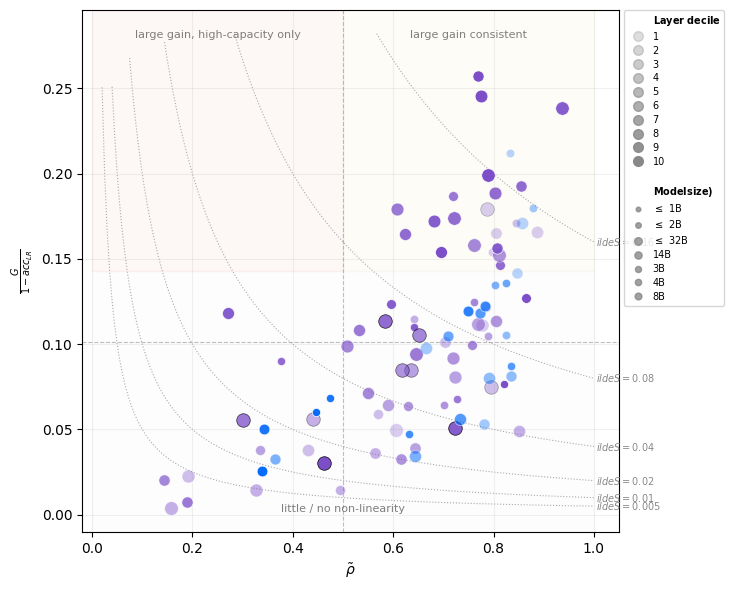

In [32]:
from matplotlib import lines as mlines

def plot_G_rho_scatter(
    df: pd.DataFrame,
    groupby_layer: str = "decile",
    min_G: float = 0.0,
    show_contours: bool = True,
    figsize=(8, 6),
    save_path: str = None,
):
    scores = compute_scores(df, scorer_name="S3_headroom",
                            groupby=["model", "family", groupby_layer])
    if "rho_tilde" not in scores.columns:
        raise ValueError("rho_tilde column missing — ensure scorer_name='S3'")

    scores = scores[scores["G"] >= min_G].copy()

    family_colors  = {
        "Qwen3":   "#7C4FC9",
        "Llama-3": "#056BFA",
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }

    model_sizes = {
        "Qwen3-0_6B": 35,
        "llama-3-1B": 35,
        "Qwen2-1_5B": 50,
        "Qwen2_5-1_5B": 50,
        "Qwen1_5-1_8B": 50,
        "Qwen3-1_7B": 50,
        "llama-3-3B": 60,
        "Qwen3-4B": 65,
        "Qwen3-8B": 75,
        "llama-3-8B": 75,
        "Qwen3-14B": 85,
        "Qwen3-30B-A3B": 95,
        "Qwen3-32B": 95,
    }

    fig, ax = plt.subplots(figsize=figsize)

    # ── S = G·ρ̃ iso-contours ─────────────────────────────────────────────────
    if show_contours:
        rho_grid = np.linspace(0.01, 1.0, 200)
        contour_levels = [0.005, 0.01, 0.02, 0.04, 0.08, 0.16]
        for S_val in contour_levels:
            G_grid = S_val / rho_grid
            mask   = (G_grid >= 0) & (G_grid <= scores["G"].max() * 1.1)
            ax.plot(rho_grid[mask], G_grid[mask],
                    color="#AAAAAA", linewidth=0.8, linestyle=":",
                    zorder=1)
            rho_label = rho_grid[mask][-1]
            G_label   = G_grid[mask][-1]
            ax.text(rho_label + 0.005, G_label,
                    f"$\tilde{{S}}={S_val}$",
                    fontsize=7, color="#888888", va="center")

    # ── Scatter ───────────────────────────────────────────────────────────────
    grouped = scores.groupby(["model", "family", groupby_layer]) if groupby_layer in scores.columns else scores.groupby("model")

    for keys, grp in grouped:
        if isinstance(keys, tuple):
            model, family, group = keys
        else:
            model, family, group = keys, None, None
        color  = family_colors.get(family, "#888888")
        alpha  = 0.2 + (0.8 * (grp["decile"] + 1) / 10.0)
        edgecolors = "black" if model == "Qwen3-30B-A3B" else "white"
        ax.scatter(
            grp["rho_tilde"], grp["G"],
            c=color, marker="o", s=model_sizes.get(model, 65),
            alpha=alpha, edgecolors=edgecolors, linewidths=0.5,
            zorder=3,
        )

    # ── Quadrant shading ──────────────────────────────────────────────────────
    G_mid   = scores["G"].quantile(0.5)
    rho_mid = 0.5
    alpha_q = 0.04
    ax.axvline(rho_mid, color="gray", linewidth=0.8, linestyle="--", alpha=0.5)
    ax.axhline(G_mid,   color="gray", linewidth=0.8, linestyle="--", alpha=0.5)
    ax.axvspan(0.0,     rho_mid, ymin=0.5, ymax=1.0,
               alpha=alpha_q, color="#CC3311", zorder=0)
    ax.axvspan(rho_mid, 1.0,     ymin=0.5, ymax=1.0,
               alpha=alpha_q, color="#CCBB44", zorder=0)
    ax.axvspan(0.0,     1.0,     ymin=0.0, ymax=0.5,
               alpha=alpha_q*0.5, color="#AAAAAA", zorder=0)

    xlim = ax.get_xlim(); ylim = ax.get_ylim()
    kw   = dict(fontsize=8, color="#555555", alpha=0.75)
    ax.text(rho_mid * 0.5,  ylim[1] * 0.96,
            "large gain, high-capacity only", ha="center", va="top", **kw)
    ax.text(rho_mid * 1.5,  ylim[1] * 0.96, "large gain consistent", ha="center", va="top", **kw)
    ax.text(0.5, ylim[0] * 1.02 if ylim[0] > 0 else abs(ylim[0]) * 0.02,
            "little / no non-linearity", ha="center", va="bottom", **kw)

    ax.set_xlabel(r"$\tilde{\rho}$", fontsize=10)
    ax.set_ylabel(r"$\frac{G}{1 - acc_{LR}}$", 
        fontsize=10,
    )
    # ax.set_title(
    #     r"$(G,\,\tilde{\rho})$ two-dimensional characterisation  —  "
    #     r"dashed curves: $\tilde{S}=G\cdot\tilde{\rho}$ iso-contours",
    #     fontsize=11,
    # )
    ax.set_xlim(-0.02, 1.05)
    ax.grid(True, alpha=0.18)

    # ── Legend: decile → alpha ────────────────────────────────────────────────
    decile_handles = []
    for d in range(10):
        alpha_d = 0.2 + (0.8 * (d + 1) / 10.0)
        h = mlines.Line2D(
            [], [], marker="o", linestyle="None",
            color="#888888", alpha=alpha_d,
            markersize=7, label=f"{d+1}",
        )
        decile_handles.append(h)

    # ── Legend: model name → marker size ─────────────────────────────────────
    # Deduplicate by size so we show one entry per distinct size bucket
    model_sizes_lgd = {
        r"$\leq$ 1B": 35,
        r"$\leq$ 2B": 50,
        "3B": 60,
        "4B": 65,
        "8B": 75,
        "14B": 85,
        r"$\leq$ 32B": 95,
    }
    # seen_sizes = {}
    # for model_name, sz in sorted(model_sizes_lgd.items(), key=lambda x: x[1]):
    #     if sz not in seen_sizes:
    #         seen_sizes[sz] = model_name   # keep first (smallest) model at that size

    size_handles = []
    for sz_label, sz in sorted(model_sizes_lgd.items()):
        h = mlines.Line2D(
            [], [], marker="o", linestyle="None",
            color="#888888", alpha=0.8,
            markersize=np.sqrt(sz/np.pi),          # matplotlib s = area, so sqrt for radius
            label=sz_label,
        )
        size_handles.append(h)

    # ── Combine into one legend with section headers ──────────────────────────
    blank = mlines.Line2D([], [], linestyle="None", marker="None", label="")

    title_decile = mlines.Line2D([], [], linestyle="None", marker="None",
                                  label=r"$\bf{Layer\ decile}$")
    title_size   = mlines.Line2D([], [], linestyle="None", marker="None",
                                  label=r"$\bf{Model size)}$")

    all_handles = [title_decile] + decile_handles + [blank, title_size] + size_handles

    leg = ax.legend(
        handles=all_handles,
        fontsize=7,
        loc="upper left",
        bbox_to_anchor=(1.01, 1.0),
        borderaxespad=0,
        frameon=True,
        handletextpad=0.5,
        labelspacing=0.4,
    )

    plt.tight_layout()
    plt.subplots_adjust(right=0.78)   # make room for the right-side legend

    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


plot_G_rho_scatter(ldf, save_path="figures/G_rho_scatter.pdf")

<>:61: SyntaxWarning: invalid escape sequence '\m'
<>:61: SyntaxWarning: invalid escape sequence '\m'
/var/folders/l_/qy6xpxn531ngvxwsvs64x62h0000gn/T/ipykernel_46018/3655003813.py:61: SyntaxWarning: invalid escape sequence '\m'
  "$G = \max_k\,\Delta(h_k)$", None),


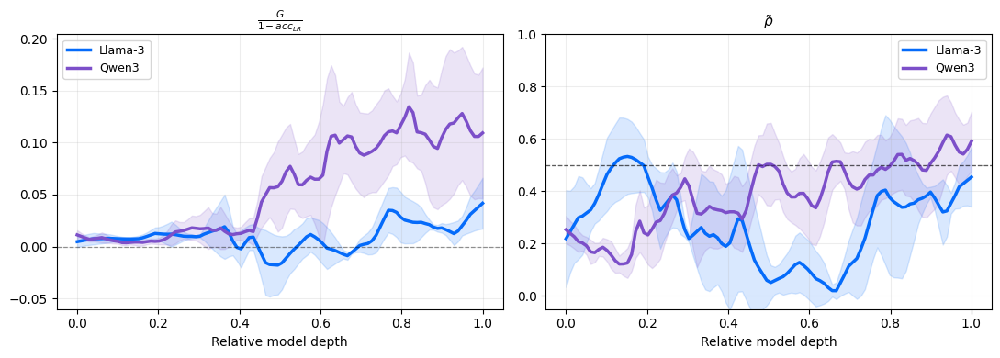

In [51]:
# ── S6: G and ρ̃ profiles across relative depth (full-layer data) ─────────────
# Two-panel figure: G on the left, ρ̃ on the right.
# Each family gets one mean line ± 95% CI band.
# Reading both panels together answers:
#   - Does non-linearity grow with depth? (G curve)
#   - Is the non-linearity consistent across capacities? (ρ̃ curve)

def plot_G_rho_by_depth(
    ldf: pd.DataFrame,
    families: list = None,
    n_interp: int = 100,
    figsize=(11, 4),
    save_path: str = None,
):
    """
    Full-layer analogue of the G–C depth plot, now using (G, ρ̃) from S3.
    """
    from scipy.interpolate import interp1d as _interp1d

    if families is None:
        families = sorted(ldf["family"].unique())

    family_colors = {
        "Qwen3":   "#7C4FC9",
        "Llama-3": "#056BFA",
        "Gemma3":  "#228833",
        "Qwen3-VL":"#AA3377",
    }
    xs = np.linspace(0, 1, n_interp)

    # Compute per-layer S3 scores
    layer_scores = compute_scores(ldf, scorer_name="S3_headroom",
                                  groupby=["model", "family", "layer"])

    fig, (ax_G, ax_rho) = plt.subplots(1, 2, figsize=figsize)

    for family in families:
        fdf    = layer_scores[layer_scores["family"] == family]
        models = fdf["model"].unique()
        G_curves, rho_curves = [], []

        for model in models:
            mdf = fdf[fdf["model"] == model].sort_values("rel_depth")
            if len(mdf) < 3:
                continue
            fG   = _interp1d(mdf["rel_depth"], mdf["G"],
                             kind="linear", bounds_error=False,
                             fill_value="extrapolate")
            frho = _interp1d(mdf["rel_depth"], mdf["rho_tilde"], #headroom, delta_std, rho_tilde
                             kind="linear", bounds_error=False,
                             fill_value="extrapolate")
            G_curves.append(fG(xs))
            rho_curves.append(frho(xs))

        if not G_curves:
            continue
        color = family_colors.get(family, "#888888")

        for curves, ax, ylabel, ref in [
            (G_curves,   ax_G,
             "$G = \max_k\,\Delta(h_k)$", None),
            (rho_curves, ax_rho,
             "$\tilde{\rho}$ — consistency", 0.5),
        ]:
            arr  = np.array(curves)
            mean = arr.mean(axis=0)
            ci   = 1.96 * arr.std(axis=0) / np.sqrt(len(arr))
            ax.plot(xs, mean, color=color, linewidth=2.5, label=family)
            ax.fill_between(xs, mean-ci, mean+ci, color=color, alpha=0.15)
            if ref is not None:
                ax.axhline(ref, color="black", linewidth=0.9,
                           linestyle="--", alpha=0.4)

    for ax, title in [
        (ax_G,   r"$\frac{G}{1 - acc_{LR}}$"), #$\frac{G}{1 - acc_{LR}}$
        (ax_rho, r"$\tilde{\rho}$"),
    ]:
        ax.set_xlabel("Relative model depth", fontsize=10)
        ax.set_title(title, fontsize=11)
        ax.legend(fontsize=9)
        ax.grid(True, alpha=0.22)

    ax_G.axhline(0, color="black", linewidth=0.9, linestyle="--", alpha=0.4)
    ax_rho.set_ylim(-0.05, 1)

    # fig.suptitle(
    #     "(G, rho) profiles across model depth"
    #     "G↑ = larger peak gain  |  rho↑ = more consistent across capacities",
    #     fontsize=11,
    # )
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


#ldf = load_layerwise_results()
plot_G_rho_by_depth(ldf, save_path="all_toxicity_results/G_head_rho_by_depth_truthfulness.pdf")


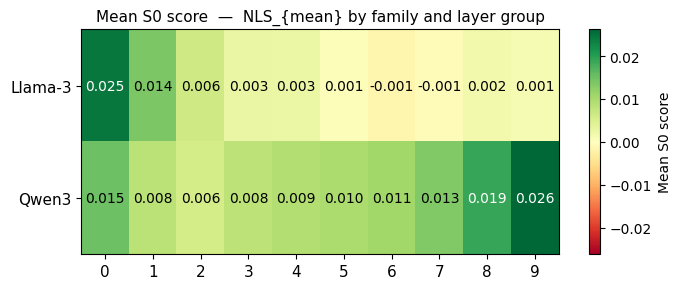

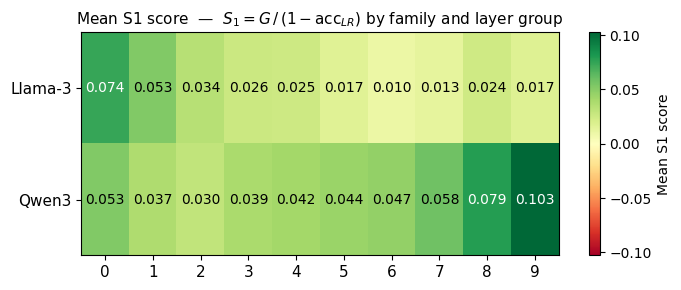

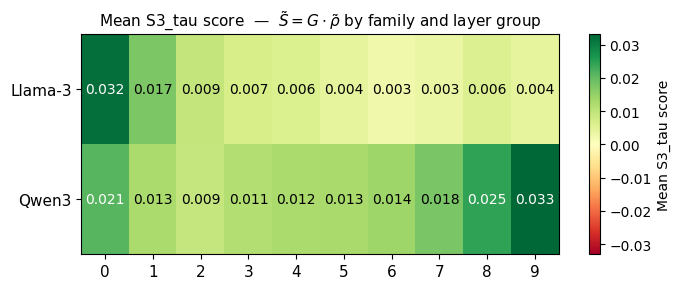

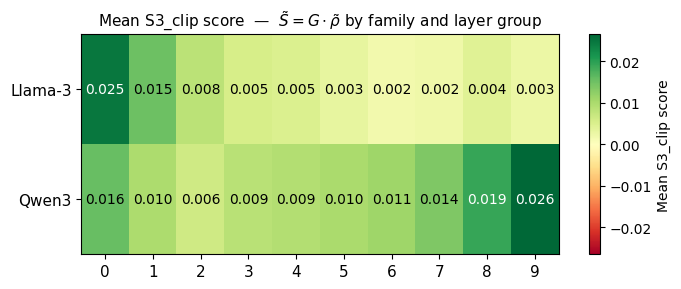

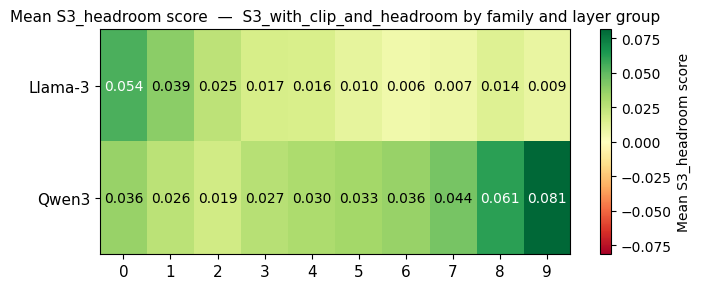

In [51]:
# ── S7: Score heatmap — active scorer across models × layer groups ────────────
# Reusable replacement for the old NLS heatmap (cell 10).
# Automatically uses ACTIVE_SCORER so swapping scorers updates this figure.

def plot_score_heatmap(
    df: pd.DataFrame,
    groupby_layer: str = "layer_group",
    layer_order: list = None,
    scorer_name: str = None,
    figsize=(7, 3),
    save_path: str = None,
):
    """
    Heatmap of mean score per (family, layer_group/decile).
    Green = positive score; red = negative (MLP worse than LR on average).
    """
    if scorer_name is None:
        scorer_name = ACTIVE_SCORER
    layer_order   = sorted(df["decile"].unique())

    scores = compute_scores(df, scorer_name=scorer_name,
                            groupby=["model", "family", "decile"])

    pivot = (
        scores
        .groupby(["family", "decile"])["score"]
        .mean()
        .unstack("decile")
        .reindex(columns=layer_order)
    )

    vmax = max(abs(pivot.values[~np.isnan(pivot.values)]).max(), 0.01)

    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(pivot.values, cmap="RdYlGn",
                   vmin=-vmax, vmax=vmax, aspect="auto")
    plt.colorbar(im, ax=ax, label=f"Mean {scorer_name} score")

    ax.set_xticks(range(len(layer_order)))
    ax.set_xticklabels([f"{g}" if len(str(g)) == 1 else f"D{g}"
                        for g in layer_order], fontsize=11)
    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels(pivot.index.tolist(), fontsize=11)

    for i in range(len(pivot.index)):
        for j in range(len(layer_order)):
            v = pivot.values[i, j]
            if not np.isnan(v):
                ax.text(j, i, f"{v:.3f}", ha="center", va="center",
                        fontsize=10,
                        color="black" if abs(v) < 0.6*vmax else "white")

    ax.set_title(
        f"Mean {scorer_name} score  —  {SCORER_LABELS.get(scorer_name, scorer_name)} by family and layer group",
        fontsize=11,
    )
    plt.tight_layout()
    # if save_path:
    #     plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()


#plot_score_heatmap(ldf, save_path="figures/score_heatmap.pdf")
plot_score_heatmap(ldf, scorer_name="S0")   # override active scorer
plot_score_heatmap(ldf, scorer_name="S1")   
plot_score_heatmap(ldf, scorer_name="S3_tau")  
plot_score_heatmap(ldf, scorer_name="S3_clip")  
plot_score_heatmap(ldf, scorer_name="S3_headroom")   
